## Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Funções

## Funções: RMS, NRMS, Normalização, Gráfico de perda e diferenças

In [ ]:
# Funções de RMS e NRMS
def rms(x):
  return np.sqrt(np.mean(x**2))

def nrms(x, y):
  return (200 * rms(x - y)) / (rms(x) + rms(y))

In [ ]:
# Função para normalização
def normalization_data(type, dataset, min=-1, max=1):
    if type == "minmax":
        scaler = MinMaxScaler(feature_range=(min, max))
        dataset_norm = scaler.fit_transform(dataset)
    elif type == "stand":
        scaler = StandardScaler()
        dataset_norm = scaler.fit_transform(dataset)
    else:
        print("Tipo especificado incorretamente")
    return dataset_norm, scaler

In [ ]:
# Função para plotar a perda
def plot_loss(history, model_name):
    plt.figure(figsize = (9, 6))
    plt.plot(history.history['loss'][10:])
    plt.plot(history.history['val_loss'][10:])
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.ylabel('Perda', fontsize=10)
    plt.xlabel('Época', fontsize=10)
    plt.yscale('log')
    plt.legend(['Perda no treino', 'Perda na validação'], loc='upper right', fontsize=10)
    plt.grid()
    plt.show()

In [ ]:
# # Função para plotar as diferenças em subplots
# def plot_differences(trace_baseline, trace_monitor, pred_base_amp, trace_perfect, trace_idx):
#   fig, axs = plt.subplots(1, 2, figsize=(15, 5))  # Subplots lado a lado

#   # Subplot à esquerda
#   axs[0].plot(trace_monitor[w:] - trace_baseline[w:], label='Sinal com ruído', color='k')
#   axs[0].plot(pred_base_amp[:, 0] - trace_baseline[w:], label='Sinal inferido', color='r')
#   axs[0].plot(trace_perfect[w:] - trace_baseline[w:], label='Sinal esperado', color='b', linestyle='--')
#   axs[0].set_xlim([800, 1300])  # Definindo os limites do eixo x
#   axs[0].set_ylim([-0.00015, 0.00015])
#   axs[0].set_title(f'Diferenças para o Traço {trace_idx}')
#   axs[0].set_xlabel('Amostras')
#   axs[0].set_ylabel('Diferença de Amplitude')
#   axs[0].legend()
#   axs[0].grid(True)

#   # Subplot à direita
#   axs[1].plot(trace_monitor[w:] - trace_baseline[w:], label='Sinal com ruído', color='k')
#   axs[1].plot(pred_base_amp[:, 0] - trace_baseline[w:], label='Sinal inferido', color='r')
#   axs[1].plot(trace_perfect[w:] - trace_baseline[w:], label='Sinal esperado', color='b', linestyle='--')
#   axs[1].axvline(w, color='g', linestyle='--', label=f'Início Treino (x={w})')
#   axs[1].axvline(lim, color='g', linestyle='--', label=f'Fim Treino (x={lim})')
#   axs[1].axvspan(w, lim, color='yellow', alpha=0.3, label='Região de Treino')
#   axs[1].set_title(f'Diferenças para o Traço {trace_idx}')
#   axs[1].set_xlabel('Amostras')
#   axs[1].set_ylabel('Diferença de Amplitude')
#   axs[1].legend()
#   axs[1].grid(True)

#   plt.tight_layout()
#   plt.show()

In [ ]:
def plot_differences(trace_baseline, trace_monitor, pred_base_amp, trace_perfect, trace_idx):
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))  # Subplots lado a lado

    # Subplot à esquerda
    axs[0].plot(trace_monitor[w:] - trace_baseline[w:], label='Sinal com ruído', color='k')
    axs[0].plot(pred_base_amp[:, 0] - trace_baseline[w:], label='Sinal inferido', color='r')
    axs[0].plot(trace_perfect[w:] - trace_baseline[w:], label='Sinal esperado', color='b', linestyle='--')
    axs[0].set_xlim([800, 1300])  # Definindo os limites do eixo x
    axs[0].set_ylim([-0.00015, 0.00015])
    axs[0].set_title(f'Diferenças para o Traço {trace_idx}')
    axs[0].set_xlabel('Amostras')
    axs[0].set_ylabel('Diferença de Amplitude')
    axs[0].legend(fontsize=12)  # Aumentando o tamanho da legenda
    axs[0].grid(True)

    # Subplot à direita
    axs[1].plot(trace_monitor[w:] - trace_baseline[w:], label='Sinal com ruído', color='k')
    axs[1].plot(pred_base_amp[:, 0] - trace_baseline[w:], label='Sinal inferido', color='r')
    axs[1].plot(trace_perfect[w:] - trace_baseline[w:], label='Sinal esperado', color='b', linestyle='--')

    # Destacando as regiões de chegada, reservatório e profunda
    axs[1].axvspan(280, 530, color='blue', alpha=0.3, label='Região de Chegada')
    axs[1].axvspan(880, 1230, color='green', alpha=0.3, label='Região de Reservatório')
    axs[1].axvspan(780, 2500, color='purple', alpha=0.2, label='Região Profunda')

    axs[1].set_title(f'Diferenças para o Traço {trace_idx}')
    axs[1].set_xlabel('Amostras')
    axs[1].set_ylabel('Diferença de Amplitude')
    axs[1].legend(fontsize=12)  # Aumentando o tamanho da legenda
    axs[1].grid(True)

    plt.tight_layout()
    plt.show()


In [ ]:
# # Função para plotar as diferenças
# def plot_differences(trace_baseline, trace_monitor, pred_base_amp, trace_perfect, trace_idx):
#   fig, axs = plt.subplots(1, 1, figsize=(10, 6))

#   # Diferença entre monitor e baseline
#   axs.plot(trace_monitor[w:] - trace_baseline[w:], label='Monitor - Baseline', color='k')
#   axs.plot(pred_base_amp[:, 0] - trace_baseline[w:], label='Predição (RNN) - Baseline', color='r')

#   # Diferença entre monitor perfeito e baseline
#   axs.plot(trace_perfect[w:] - trace_baseline[w:], label='Monitor Perfeito - Baseline', color='b', linestyle='--')

#   axs.set_xlim([800, 1200])  # Definindo os limites do eixo x
#   axs.set_ylim([-0.00015, 0.00015])
#   axs.set_title(f'Diferenças para o Traço {trace_idx}')
#   axs.set_xlabel('Amostras')
#   axs.set_ylabel('Diferença de Amplitude')
#   axs.legend()
#   axs.grid(True)

#   plt.tight_layout()
#   plt.show()

## Importando dados

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tensorflow import keras
from keras.models import Sequential
from keras.layers import GRU, Dense

# Definição dos caminhos dos arquivos e parâmetros
PATH_base = "/content/drive/MyDrive/1.ProjetoSísmica/4Dseismic/MACHINE_LEARNING_DANYELLE/REFERENCIA/BASELINE"
PATH_moni = "/content/drive/MyDrive/1.ProjetoSísmica/4Dseismic/MACHINE_LEARNING_DANYELLE/DADOS/VEL6M2"
PATH_rese = "/content/drive/MyDrive/1.ProjetoSísmica/4Dseismic/MACHINE_LEARNING_DANYELLE/REFERENCIA/MONITOR_PERFEITO"
nsamples = 2500   # Número de amostras
nrec     = 400    # Número de receptores
w        = 20     # Tamanho das janelas para treinamento e validação
lim      = 800    # Limite da regiao de treino

# Carregamento dos dados
def load_data(PATH_base, PATH_moni, PATH_rese):
    file_baseline = PATH_base + "/" + "tirobase0025"
    file_monitor  = PATH_moni + "/" + "tiromonitor0025"
    file_res_perf = PATH_rese + "/" + "tiromonitor0025"

    shot1_baseline = np.fromfile(file_baseline, dtype='float32')
    shot1_monitor  = np.fromfile(file_monitor, dtype='float32')
    shot1_res_perf = np.fromfile(file_res_perf, dtype='float32')

    return shot1_baseline, shot1_monitor, shot1_res_perf

shot1_baseline, shot1_monitor, shot1_res_perf = load_data(PATH_base, PATH_moni, PATH_rese)

# Reshaping dos dados em sismogramas (matrizes)
sis_baseline = shot1_baseline.reshape([nrec, nsamples])
sis_monitor  = shot1_monitor.reshape([nrec, nsamples])
sis_perfect  = shot1_res_perf.reshape([nrec, nsamples])

def trace(trace_idx):
  trace_baseline = sis_baseline[trace_idx, :]
  trace_monitor  = sis_monitor[trace_idx, :]

  return trace_baseline, trace_monitor

## Treinamento

In [ ]:
def train_many(traces_to_process, ep, bs):
  # Listas para armazenar os modelos e resultados NRMS
  models = []
  scalers = []
  histories = []

  # Traços escolhidos para treino
  # traces_to_process = [150, ... , 199, 200, 201, ... , 250]

  # Iteração sobre os traços específicos
  for trace_idx in traces_to_process:
      trace_baseline = sis_baseline[trace_idx, :]
      trace_monitor  = sis_monitor[trace_idx, :]
      trace_perfect  = sis_perfect[trace_idx, :]

      # Normalização dos dados do monitor
      trace_monitor_norm, _ = normalization_data('stand', trace_monitor.reshape(-1, 1), 0, 1)
      base_norm , scalerBase = normalization_data('stand', trace_baseline.reshape(-1, 1), 0, 1)

      moni_win = []
      base_amp = []

      # Criação das janelas de treinamento e seus respectivos valores base
      for i in range(w, lim):
          moni_win.append(trace_monitor_norm[(i-w):i])
          # base_amp.append(trace_baseline[i])
          base_amp.append( base_norm[i] )

      moni_win, base_amp = np.array(moni_win), np.array(base_amp)                 # base_amp contém valores normalizados
      moni_win = np.reshape(moni_win, (moni_win.shape[0], moni_win.shape[1], 1))

      # Construção do modelo de rede neural
      model = Sequential([
          GRU(units=50, input_shape=[w, 1]),
          Dense(units=1, activation='linear')
      ])

      # Compilação do modelo
      opt = keras.optimizers.Adam(learning_rate=0.002, beta_1=0.9, beta_2=0.999, epsilon=10e-8)
      model.compile(optimizer=opt, loss="mean_squared_error", metrics=['mean_squared_error', 'mean_absolute_error'])
      model.summary()

      # Treinamento do modelo
      # bs = len(moni_win)
      # bs = 128
      history = model.fit(moni_win, base_amp, batch_size=bs, epochs=ep, validation_split=0.2, shuffle=True)

      # Armazenamento do modelo treinado e histórico
      models.append(model)
      scalers.append(scalerBase)
      histories.append(history)

  return moni_win, base_amp, history, models, scalers, histories

In [ ]:
def one_train(traces_to_process, ep, bs):
  # Inicialização das listas para armazenar dados combinados
  scalers = []
  moni_win_combined = []
  base_amp_combined = []

  # Iteração sobre os traços específicos para treinamento
  for trace_idx in traces_to_process:
      trace_baseline = sis_baseline[trace_idx, :]
      trace_monitor  = sis_monitor[trace_idx, :]

      # print("trace_monitor (antes da norm) =", len(trace_monitor))
      # print("trace_baseline (antes da norm) =", len(trace_baseline))

      print("trace_monitor (antes da norm) =", trace_monitor.shape)
      print("trace_baseline (antes da norm) =", trace_baseline.shape)

      # Normalização dos dados do monitor
      trace_monitor_norm, _ = normalization_data('stand', trace_monitor.reshape(-1, 1), 0, 1)
      base_norm, scalerBase = normalization_data('stand', trace_baseline.reshape(-1, 1), 0, 1)

      print("trace_monitor (depois da norm) =", trace_monitor_norm.shape)
      print("trace_baseline (depois da norm) =", base_norm.shape)

      # Criação das janelas de treinamento e seus respectivos valores base
      for i in range(w, lim):
          moni_win_combined.append(trace_monitor_norm[(i-w):i])
          base_amp_combined.append(base_norm[i])

      scalers.append(scalerBase)

  print("Tam de moni_win (antes) =", len(moni_win_combined))
  print("Tam de base_amp (antes) =", len(base_amp_combined))

  moni_win_combined, base_amp_combined = np.array(moni_win_combined), np.array(base_amp_combined)
  moni_win_combined = np.reshape(moni_win_combined, (moni_win_combined.shape[0], moni_win_combined.shape[1], 1))

  print("Tam de moni_win (depois) =", len(moni_win_combined))
  print("Tam de base_amp (depois) =", len(base_amp_combined))

  # Construção do modelo de rede neural
  model = Sequential([
      GRU(units=50, input_shape=[w, 1]),
      Dense(units=1, activation='linear')
  ])

  # Compilação do modelo
  opt = keras.optimizers.Adam(learning_rate=0.002, beta_1=0.9, beta_2=0.999, epsilon=10e-8)
  model.compile(optimizer=opt, loss="mean_squared_error", metrics=['mean_squared_error', 'mean_absolute_error'])
  model.summary()

  # Treinamento do modelo
  history = model.fit(moni_win_combined, base_amp_combined, batch_size=bs, epochs=ep, validation_split=0.2, shuffle=True)

  return moni_win_combined, base_amp_combined, model, history, scalers

In [ ]:
def test_many(traces_to_process, models, histories, scalers):
  # Avaliação dos modelos e plotagem das diferenças
  for trace_idx, model, history, scl in zip(traces_to_process, models, histories, scalers):
    trace_baseline = sis_baseline[trace_idx, :]
    trace_monitor  = sis_monitor[trace_idx, :]
    trace_perfect  = sis_perfect[trace_idx, :]

    trace_monitor_norm, _ = normalization_data('stand', trace_monitor.reshape(-1, 1), 0, 1)

    # preparando dados de teste para avaliação do NRMS
    test_moni_win = []
    test_base_amp = []

    for i in range(w, nsamples):
      test_moni_win.append(trace_monitor_norm[(i-w):i])
      test_base_amp.append(trace_baseline[i])

    # test_moni_win, test_base_amp = np.array(test_moni_win), np.array(test_base_amp)

    test_moni_win = np.array(test_moni_win)
    test_moni_win = np.reshape(test_moni_win, (test_moni_win.shape[0], test_moni_win.shape[1], 1))

    # Previsão usando o modelo treinado
    pred_base_amp_norm = model.predict(test_moni_win)

    # de-normalizar saída da rede
    pred_base_amp = scl.inverse_transform(pred_base_amp_norm)


    # Cálculo do NRMS para várias seções do traço
    trace_baseline_to_plot = trace_baseline[w:]
    trace_monitor_to_plot = trace_monitor[w:]
    trace_perfect_to_plot = trace_perfect[w:]
    pred_base_amp_to_plot = pred_base_amp[:, 0]

    nrms_baseline_deep = nrms(trace_baseline_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
    nrms_baseline = nrms(trace_baseline_to_plot, trace_perfect_to_plot)
    nrms_baseline_reserv = nrms(trace_baseline_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
    nrms_baseline_arr = nrms(trace_baseline_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

    nrms_monitor_deep = nrms(trace_monitor_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
    nrms_monitor = nrms(trace_monitor_to_plot, trace_perfect_to_plot)
    nrms_monitor_reserv = nrms(trace_monitor_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
    nrms_monitor_arr = nrms(trace_monitor_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

    nrms_rnn_deep = nrms(pred_base_amp_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
    nrms_rnn = nrms(pred_base_amp_to_plot, trace_perfect_to_plot)
    nrms_rnn_reserv = nrms(pred_base_amp_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
    nrms_rnn_arr = nrms(pred_base_amp_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

    print(f"Traço {trace_idx}:")
    print("           full   arrival  deep  reserv")
    print("baseline:  " + str(round(nrms_baseline, 2)) + "       " + str(round(nrms_baseline_arr, 2)) +
          "  " + str(round(nrms_baseline_deep, 2)) + "    " + str(round(nrms_baseline_reserv, 2)))
    print("monitor:  " + str(round(nrms_monitor, 2)) + "     " + str(round(nrms_monitor_arr, 2)) +
          "  " + str(round(nrms_monitor_deep, 2)) + "    " + str(round(nrms_monitor_reserv, 2)))
    print("matched:   " + str(round(nrms_rnn, 2)) + "      " + str(round(nrms_rnn_arr, 2)) +
          "  " + str(round(nrms_rnn_deep, 2)) + "    " + str(round(nrms_rnn_reserv, 2)))

    # Plotagem das diferenças
    plot_differences(trace_baseline, trace_monitor, pred_base_amp, trace_perfect, trace_idx)
    plot_loss(history, f'Traço {trace_idx}')

##Um treino por traço

In [ ]:
def train_one(trace_idx, ep, bs):
  # Inicialização das listas para armazenar dados combinados
  scalers = []
  moni_win_combined = []
  base_amp_combined = []

  # Iteração sobre os traços específicos para treinamento
  # for trace_idx in traces_to_process:
  trace_baseline = sis_baseline[trace_idx, :]
  trace_monitor  = sis_monitor[trace_idx, :]

  print("trace_monitor (antes da norm) =", len(trace_monitor))
  print("trace_baseline (antes da norm) =", len(trace_baseline))

  # Normalização dos dados do monitor
  trace_monitor_norm, _ = normalization_data('stand', trace_monitor.reshape(-1, 1), 0, 1)
  base_norm, scalerBase = normalization_data('stand', trace_baseline.reshape(-1, 1), 0, 1)

  print("trace_monitor (depois da norm) =", len(trace_monitor_norm))
  print("trace_baseline (depois da norm) =", len(base_norm))

  # Criação das janelas de treinamento e seus respectivos valores base
  for i in range(w, lim):
    moni_win_combined.append(trace_monitor_norm[(i-w):i])
    base_amp_combined.append(base_norm[i])

  # scalers.append(scalerBase)

  print("Tam de moni_win (antes) =", len(moni_win_combined))
  print("Tam de base_amp (antes) =", len(base_amp_combined))

  moni_win_combined, base_amp_combined = np.array(moni_win_combined), np.array(base_amp_combined)
  moni_win_combined = np.reshape(moni_win_combined, (moni_win_combined.shape[0], moni_win_combined.shape[1], 1))

  print("Tam de moni_win (depois) =", moni_win_combined.shape)
  print("Tam de base_amp (depois) =", base_amp_combined.shape)

  # Construção do modelo de rede neural
  model = Sequential([
      GRU(units=50, input_shape=[w, 1]),
      Dense(units=1, activation='linear')
  ])

  # Compilação do modelo
  opt = keras.optimizers.Adam(learning_rate=0.002, beta_1=0.9, beta_2=0.999, epsilon=10e-8)
  model.compile(optimizer=opt, loss="mean_squared_error", metrics=['mean_squared_error', 'mean_absolute_error'])
  model.summary()

  # Treinamento do modelo
  history = model.fit(moni_win_combined, base_amp_combined, batch_size=bs, epochs=ep, validation_split=0.2, shuffle=True)

  return moni_win_combined, base_amp_combined, model, history, scalerBase

In [ ]:
# def train_many(traces_to_process, ep, bs):
#   # Listas para armazenar os modelos e resultados NRMS
#   models = []
#   scalers_monitor = []
#   scalers_base = []
#   histories = []

#   # Iteração sobre os traços específicos
#   for trace_idx in traces_to_process:
#     trace_baseline = sis_baseline[trace_idx, :]
#     trace_monitor = sis_monitor[trace_idx, :]
#     trace_perfect = sis_perfect[trace_idx, :]

#     print("Tam de trace_baseline = ", trace_baseline.shape)
#     # print("Print de trace_baseline = ", trace_baseline)

#     moni_win_list = []
#     base_amp_list = []
#     scaler_monitor_list = []
#     scaler_base_list = []

#     # Criação das janelas de treinamento e seus respectivos valores base
#     for i in range(w, lim):
#       moni_win = trace_monitor[(i-w):i].reshape(-1, 1)
#       # base_win = trace_baseline[i].reshape(-1, 1)  # Valor alvo é um escalar, mas reshape para normalização
#       base_win = trace_baseline[(i-w):i].reshape(-1, 1)

#       if (i == w):
#         print("Começo do janelamento:")
#         print("Tam 'moni_win[0]  = ", moni_win.shape)
#         print("Type 'moni_win[0] = ", type(moni_win))
#         print("Tam 'base_win[0]  = ", base_win.shape)
#         print("Type 'base_win[0] = ", type(base_win))

#       # Normalização dos dados do monitor e do valor alvo
#       moni_win_norm, scalerMoni = normalization_data('stand', moni_win)
#       base_win_norm, scalerBase = normalization_data('stand', base_win)
#       # base_win_norm = base_win
#       # scalerBase = lambda x: x

#       if (i == w):
#         print("Após normalização:")
#         print("Tam 'moni_win_norm[0]  = ", moni_win_norm.shape)
#         print("Type 'moni_win_norm[0] = ", type(moni_win_norm))
#         print("Tam 'base_win_norm[0]  = ", base_win_norm.shape)
#         print("Type 'base_win_norm[0] = ", type(base_win_norm))

#       # Armazenar janelas normalizadas e scalers
#       moni_win_list.append(moni_win_norm)
#       # base_amp_list.append( base_win_norm[0][0] )  # Valor normalizado alvo
#       base_amp_list.append( base_win_norm[-1][0] )
#       scaler_monitor_list.append(scalerMoni)
#       scaler_base_list.append(scalerBase)


#     # Convertendo listas para arrays numpy
#     moni_win, base_amp = np.array(moni_win_list), np.array(base_amp_list)

#     # Reshape para:                 (   num_samples,            w,         1)
#     moni_win = np.reshape(moni_win, (moni_win.shape[0], moni_win.shape[1], 1))

#     print("Após virarem arrays ( traço" + str(trace_idx) + " )")
#     print("Tam 'moni_win[0] = ", moni_win.shape)
#     print("Tam 'base_amp[0] = ", base_amp.shape)


#     # Construção do modelo de rede neural
#     model = Sequential([
#             GRU(units=50, input_shape=[w, 1]),
#             Dense(units=1, activation='linear')
#     ])

#     # Compilação do modelo
#     opt = keras.optimizers.Adam(learning_rate=0.002, beta_1=0.9, beta_2=0.999, epsilon=10e-8)
#     model.compile(optimizer=opt, loss="mean_squared_error", metrics=['mean_squared_error', 'mean_absolute_error'])
#     model.summary()

#     # Treinamento do modelo
#     history = model.fit(moni_win, base_amp, batch_size=bs, epochs=ep, validation_split=0.2, shuffle=True)

#     # Armazenamento do modelo treinado e histórico
#     models.append(model)
#     scalers_monitor.append(scaler_monitor_list)
#     scalers_base.append(scaler_base_list)
#     histories.append(history)

#   return models, histories, scalers_monitor, scalers_base

In [ ]:
# def test_many(traces_to_process, models, histories, scalers_monitor, scalers_base):
#     # Avaliação dos modelos e plotagem das diferenças
#     for trace_idx, model, history, scl_moni_list, scl_base_list in zip(traces_to_process, models, histories, scalers_monitor, scalers_base):
#         trace_baseline = sis_baseline[trace_idx, :]
#         trace_monitor  = sis_monitor[trace_idx, :]
#         trace_perfect  = sis_perfect[trace_idx, :]

#         # Preparando dados de teste para avaliação do NRMS
#         test_moni_win_list = []

#         for i in range(w, nsamples):
#             test_moni_win = trace_monitor[(i-w):i].reshape(-1,1)

#             # Normalização dos dados do monitor
#             test_moni_win_norm, _ = normalization_data('stand', test_moni_win)

#             # Adiciona janela normalizada à lista
#             test_moni_win_list.append(test_moni_win_norm)

#         test_moni_win = np.array(test_moni_win_list)
#         test_moni_win = np.reshape(test_moni_win, (test_moni_win.shape[0], test_moni_win.shape[1], 1))

#         # Previsão usando o modelo treinado
#         pred_base_amp_norm = model.predict(test_moni_win)

#         # Desnormalizar a saída da rede
#         pred_base_amp = np.zeros(pred_base_amp_norm.shape)
#         for j in range(len(scl_base_list)):
#             pred_base_amp[j] = scl_base_list[j].inverse_transform(pred_base_amp_norm[j].reshape(-1, 1)).reshape(-1)

#         # pred_base_amp = pred_base_amp_norm

#         # De-normalizar saída da rede
#         # pred_base_amp = scl.inverse_transform(pred_base_amp_norm.reshape(-1, pred_base_amp_norm.shape[-1])).reshape(pred_base_amp_norm.shape)

#         # Cálculo do NRMS para várias seções do traço
#         trace_baseline_to_plot = trace_baseline[w:]
#         trace_monitor_to_plot = trace_monitor[w:]
#         trace_perfect_to_plot = trace_perfect[w:]
#         pred_base_amp_to_plot = pred_base_amp[:, 0]

#         nrms_baseline_deep = nrms(trace_baseline_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
#         nrms_baseline = nrms(trace_baseline_to_plot, trace_perfect_to_plot)
#         nrms_baseline_reserv = nrms(trace_baseline_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
#         nrms_baseline_arr = nrms(trace_baseline_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

#         nrms_monitor_deep = nrms(trace_monitor_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
#         nrms_monitor = nrms(trace_monitor_to_plot, trace_perfect_to_plot)
#         nrms_monitor_reserv = nrms(trace_monitor_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
#         nrms_monitor_arr = nrms(trace_monitor_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

#         nrms_rnn_deep = nrms(pred_base_amp_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
#         nrms_rnn = nrms(pred_base_amp_to_plot, trace_perfect_to_plot)
#         nrms_rnn_reserv = nrms(pred_base_amp_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
#         nrms_rnn_arr = nrms(pred_base_amp_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

#         print(f"Traço {trace_idx}:")
#         print("           full   arrival  deep  reserv")
#         print("baseline:  " + str(round(nrms_baseline, 2)) + "       " + str(round(nrms_baseline_arr, 2)) +
#               "  " + str(round(nrms_baseline_deep, 2)) + "    " + str(round(nrms_baseline_reserv, 2)))
#         print("monitor:  " + str(round(nrms_monitor, 2)) + "     " + str(round(nrms_monitor_arr, 2)) +
#               "  " + str(round(nrms_monitor_deep, 2)) + "    " + str(round(nrms_monitor_reserv, 2)))
#         print("matched:   " + str(round(nrms_rnn, 2)) + "      " + str(round(nrms_rnn_arr, 2)) +
#               "  " + str(round(nrms_rnn_deep, 2)) + "    " + str(round(nrms_rnn_reserv, 2)))

#         # Plotagem das diferenças
#         plot_differences(trace_baseline, trace_monitor, pred_base_amp, trace_perfect, trace_idx)
#         plot_loss(history, f'Traço {trace_idx}')


## Teste (um traço)

In [ ]:
def test_one(trace_idx, model, history, scaler):
  # Avaliação dos modelos e plotagem das diferenças
  trace_baseline = sis_baseline[trace_idx, :]
  trace_monitor  = sis_monitor[trace_idx, :]
  trace_perfect  = sis_perfect[trace_idx, :]

  trace_monitor_norm, _ = normalization_data('stand', trace_monitor.reshape(-1, 1), 0, 1)

  # preparando dados de teste para avaliação do NRMS
  test_moni_win = []
  test_base_amp = []

  for i in range(w, nsamples):
    test_moni_win.append(trace_monitor_norm[(i-w):i])
    test_base_amp.append(trace_baseline[i])

  # test_moni_win, test_base_amp = np.array(test_moni_win), np.array(test_base_amp)

  test_moni_win = np.array(test_moni_win)
  test_moni_win = np.reshape(test_moni_win, (test_moni_win.shape[0], test_moni_win.shape[1], 1))

  # Previsão usando o modelo treinado
  pred_base_amp_norm = model.predict(test_moni_win)

  # de-normalizar saída da rede
  pred_base_amp = scaler.inverse_transform(pred_base_amp_norm)


  # Cálculo do NRMS para várias seções do traço
  trace_baseline_to_plot = trace_baseline[w:]
  trace_monitor_to_plot = trace_monitor[w:]
  trace_perfect_to_plot = trace_perfect[w:]
  pred_base_amp_to_plot = pred_base_amp[:, 0]

  nrms_baseline_deep = nrms(trace_baseline_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
  nrms_baseline = nrms(trace_baseline_to_plot, trace_perfect_to_plot)
  nrms_baseline_reserv = nrms(trace_baseline_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
  nrms_baseline_arr = nrms(trace_baseline_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

  nrms_monitor_deep = nrms(trace_monitor_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
  nrms_monitor = nrms(trace_monitor_to_plot, trace_perfect_to_plot)
  nrms_monitor_reserv = nrms(trace_monitor_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
  nrms_monitor_arr = nrms(trace_monitor_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

  nrms_rnn_deep = nrms(pred_base_amp_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
  nrms_rnn = nrms(pred_base_amp_to_plot, trace_perfect_to_plot)
  nrms_rnn_reserv = nrms(pred_base_amp_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
  nrms_rnn_arr = nrms(pred_base_amp_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

  print(f"Traço {trace_idx}:")
  print("           full   arrival  deep  reserv")
  print("baseline:  " + str(round(nrms_baseline, 2)) + "       " + str(round(nrms_baseline_arr, 2)) +
        "  " + str(round(nrms_baseline_deep, 2)) + "    " + str(round(nrms_baseline_reserv, 2)))
  print("monitor:  " + str(round(nrms_monitor, 2)) + "     " + str(round(nrms_monitor_arr, 2)) +
        "  " + str(round(nrms_monitor_deep, 2)) + "    " + str(round(nrms_monitor_reserv, 2)))
  print("matched:   " + str(round(nrms_rnn, 2)) + "      " + str(round(nrms_rnn_arr, 2)) +
        "  " + str(round(nrms_rnn_deep, 2)) + "    " + str(round(nrms_rnn_reserv, 2)))

  # Plotagem das diferenças
  plot_differences(trace_baseline, trace_monitor, pred_base_amp, trace_perfect, trace_idx)
  plot_loss(history, f'Traço {trace_idx}')

## Teste (traços escolhidos)

In [ ]:
def test_all(traces_to_process, model, history, scalers):
  # Avaliação dos modelos e plotagem das diferenças
  for trace_idx, scl in zip(traces_to_process, scalers):
    trace_baseline = sis_baseline[trace_idx, :]
    trace_monitor  = sis_monitor[trace_idx, :]
    trace_perfect  = sis_perfect[trace_idx, :]

    trace_monitor_norm, _ = normalization_data('stand', trace_monitor.reshape(-1, 1), 0, 1)

    # preparando dados de teste para avaliação do NRMS
    test_moni_win = []
    test_base_amp = []

    for i in range(w, nsamples):
      test_moni_win.append(trace_monitor_norm[(i-w):i])
      test_base_amp.append(trace_baseline[i])

    # test_moni_win, test_base_amp = np.array(test_moni_win), np.array(test_base_amp)

    test_moni_win = np.array(test_moni_win)
    test_moni_win = np.reshape(test_moni_win, (test_moni_win.shape[0], test_moni_win.shape[1], 1))

    # Previsão usando o modelo treinado
    pred_base_amp_norm = model.predict(test_moni_win)

    # de-normalizar saída da rede
    pred_base_amp = scl.inverse_transform(pred_base_amp_norm)


    # Cálculo do NRMS para várias seções do traço
    trace_baseline_to_plot = trace_baseline[w:]
    trace_monitor_to_plot = trace_monitor[w:]
    trace_perfect_to_plot = trace_perfect[w:]
    pred_base_amp_to_plot = pred_base_amp[:, 0]

    nrms_baseline_deep = nrms(trace_baseline_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
    nrms_baseline = nrms(trace_baseline_to_plot, trace_perfect_to_plot)
    nrms_baseline_reserv = nrms(trace_baseline_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
    nrms_baseline_arr = nrms(trace_baseline_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

    nrms_monitor_deep = nrms(trace_monitor_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
    nrms_monitor = nrms(trace_monitor_to_plot, trace_perfect_to_plot)
    nrms_monitor_reserv = nrms(trace_monitor_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
    nrms_monitor_arr = nrms(trace_monitor_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

    nrms_rnn_deep = nrms(pred_base_amp_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
    nrms_rnn = nrms(pred_base_amp_to_plot, trace_perfect_to_plot)
    nrms_rnn_reserv = nrms(pred_base_amp_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
    nrms_rnn_arr = nrms(pred_base_amp_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

    print(f"Traço {trace_idx}:")
    print("           full   arrival  deep  reserv")
    print("baseline:  " + str(round(nrms_baseline, 2)) + "       " + str(round(nrms_baseline_arr, 2)) +
          "  " + str(round(nrms_baseline_deep, 2)) + "    " + str(round(nrms_baseline_reserv, 2)))
    print("monitor:  " + str(round(nrms_monitor, 2)) + "     " + str(round(nrms_monitor_arr, 2)) +
          "  " + str(round(nrms_monitor_deep, 2)) + "    " + str(round(nrms_monitor_reserv, 2)))
    print("matched:   " + str(round(nrms_rnn, 2)) + "      " + str(round(nrms_rnn_arr, 2)) +
          "  " + str(round(nrms_rnn_deep, 2)) + "    " + str(round(nrms_rnn_reserv, 2)))

    # Plotagem das diferenças
    plot_differences(trace_baseline, trace_monitor, pred_base_amp, trace_perfect, trace_idx)
    plot_loss(history, f'Traço {trace_idx}')

## Mostrar apenas as diferenças, dos traços escolhidos inteiros

In [ ]:
# Função para plotar as diferenças
def plot_differences_all(trace_baseline, trace_monitor, pred_base_amp, trace_perfect, trace_idx):
  fig, axs = plt.subplots(1, 1, figsize=(10, 6))

  # Diferença entre monitor e baseline
  axs.plot(trace_monitor[w:] - trace_baseline[w:], label='Monitor - Baseline', color='k')
  axs.plot(pred_base_amp[:, 0] - trace_baseline[w:], label='Predição (RNN) - Baseline', color='r')

  # Diferença entre monitor perfeito e baseline
  axs.plot(trace_perfect[w:] - trace_baseline[w:], label='Monitor Perfeito - Baseline', color='b', linestyle='--')

  # axs.set_xlim([800, 1200])  # Definindo os limites do eixo x
  # axs.set_ylim([-0.00015, 0.00015])
  axs.set_title(f'Diferenças para o Traço {trace_idx}')
  axs.set_xlabel('Amostras')
  axs.set_ylabel('Diferença de Amplitude')
  axs.legend()
  axs.grid(True)

  plt.tight_layout()
  plt.show()

def test_all_all_trace(trace_idx, model, history, scaler):
  # Avaliação dos modelos e plotagem das diferenças
  trace_baseline = sis_baseline[trace_idx, :]
  trace_monitor  = sis_monitor[trace_idx, :]
  trace_perfect  = sis_perfect[trace_idx, :]

  trace_monitor_norm, _ = normalization_data('stand', trace_monitor.reshape(-1, 1), 0, 1)

  # preparando dados de teste para avaliação do NRMS
  test_moni_win = []
  test_base_amp = []

  for i in range(w, nsamples):
    test_moni_win.append(trace_monitor_norm[(i-w):i])
    test_base_amp.append(trace_baseline[i])

  # test_moni_win, test_base_amp = np.array(test_moni_win), np.array(test_base_amp)

  test_moni_win = np.array(test_moni_win)
  test_moni_win = np.reshape(test_moni_win, (test_moni_win.shape[0], test_moni_win.shape[1], 1))

  # Previsão usando o modelo treinado
  pred_base_amp_norm = model.predict(test_moni_win)

  # de-normalizar saída da rede
  pred_base_amp = scaler.inverse_transform(pred_base_amp_norm)


  # Cálculo do NRMS para várias seções do traço
  trace_baseline_to_plot = trace_baseline[w:]
  trace_monitor_to_plot = trace_monitor[w:]
  trace_perfect_to_plot = trace_perfect[w:]
  pred_base_amp_to_plot = pred_base_amp[:, 0]

  nrms_baseline_deep = nrms(trace_baseline_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
  nrms_baseline = nrms(trace_baseline_to_plot, trace_perfect_to_plot)
  nrms_baseline_reserv = nrms(trace_baseline_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
  nrms_baseline_arr = nrms(trace_baseline_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

  nrms_monitor_deep = nrms(trace_monitor_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
  nrms_monitor = nrms(trace_monitor_to_plot, trace_perfect_to_plot)
  nrms_monitor_reserv = nrms(trace_monitor_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
  nrms_monitor_arr = nrms(trace_monitor_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

  nrms_rnn_deep = nrms(pred_base_amp_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
  nrms_rnn = nrms(pred_base_amp_to_plot, trace_perfect_to_plot)
  nrms_rnn_reserv = nrms(pred_base_amp_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
  nrms_rnn_arr = nrms(pred_base_amp_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

  print(f"Traço {trace_idx}:")
  print("           full   arrival  deep  reserv")
  print("baseline:  " + str(round(nrms_baseline, 2)) + "       " + str(round(nrms_baseline_arr, 2)) +
        "  " + str(round(nrms_baseline_deep, 2)) + "    " + str(round(nrms_baseline_reserv, 2)))
  print("monitor:  " + str(round(nrms_monitor, 2)) + "     " + str(round(nrms_monitor_arr, 2)) +
        "  " + str(round(nrms_monitor_deep, 2)) + "    " + str(round(nrms_monitor_reserv, 2)))
  print("matched:   " + str(round(nrms_rnn, 2)) + "      " + str(round(nrms_rnn_arr, 2)) +
        "  " + str(round(nrms_rnn_deep, 2)) + "    " + str(round(nrms_rnn_reserv, 2)))

  # Plotagem das diferenças
  plot_differences_all(trace_baseline, trace_monitor, pred_base_amp, trace_perfect, trace_idx)
  # plot_loss(history, f'Traço {trace_idx}')


def test_all_three_traces(traces_to_process, model, history, scaler):
  # Avaliação dos modelos e plotagem das diferenças
  for trace_idx in traces_to_process:
    trace_baseline = sis_baseline[trace_idx, :]
    trace_monitor  = sis_monitor[trace_idx, :]
    trace_perfect  = sis_perfect[trace_idx, :]

    trace_monitor_norm, _ = normalization_data('stand', trace_monitor.reshape(-1, 1), 0, 1)

    # preparando dados de teste para avaliação do NRMS
    test_moni_win = []
    test_base_amp = []

    for i in range(w, nsamples):
      test_moni_win.append(trace_monitor_norm[(i-w):i])
      test_base_amp.append(trace_baseline[i])

    # test_moni_win, test_base_amp = np.array(test_moni_win), np.array(test_base_amp)

    test_moni_win = np.array(test_moni_win)
    test_moni_win = np.reshape(test_moni_win, (test_moni_win.shape[0], test_moni_win.shape[1], 1))

    # Previsão usando o modelo treinado
    pred_base_amp_norm = model.predict(test_moni_win)

    # de-normalizar saída da rede
    pred_base_amp = scaler.inverse_transform(pred_base_amp_norm)


    # Cálculo do NRMS para várias seções do traço
    trace_baseline_to_plot = trace_baseline[w:]
    trace_monitor_to_plot = trace_monitor[w:]
    trace_perfect_to_plot = trace_perfect[w:]
    pred_base_amp_to_plot = pred_base_amp[:, 0]

    nrms_baseline_deep = nrms(trace_baseline_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
    nrms_baseline = nrms(trace_baseline_to_plot, trace_perfect_to_plot)
    nrms_baseline_reserv = nrms(trace_baseline_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
    nrms_baseline_arr = nrms(trace_baseline_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

    nrms_monitor_deep = nrms(trace_monitor_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
    nrms_monitor = nrms(trace_monitor_to_plot, trace_perfect_to_plot)
    nrms_monitor_reserv = nrms(trace_monitor_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
    nrms_monitor_arr = nrms(trace_monitor_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

    nrms_rnn_deep = nrms(pred_base_amp_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
    nrms_rnn = nrms(pred_base_amp_to_plot, trace_perfect_to_plot)
    nrms_rnn_reserv = nrms(pred_base_amp_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
    nrms_rnn_arr = nrms(pred_base_amp_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

    print(f"Traço {trace_idx}:")
    print("           full   arrival  deep  reserv")
    print("baseline:  " + str(round(nrms_baseline, 2)) + "       " + str(round(nrms_baseline_arr, 2)) +
          "  " + str(round(nrms_baseline_deep, 2)) + "    " + str(round(nrms_baseline_reserv, 2)))
    print("monitor:  " + str(round(nrms_monitor, 2)) + "     " + str(round(nrms_monitor_arr, 2)) +
          "  " + str(round(nrms_monitor_deep, 2)) + "    " + str(round(nrms_monitor_reserv, 2)))
    print("matched:   " + str(round(nrms_rnn, 2)) + "      " + str(round(nrms_rnn_arr, 2)) +
          "  " + str(round(nrms_rnn_deep, 2)) + "    " + str(round(nrms_rnn_reserv, 2)))

    # Plotagem das diferenças
    plot_differences_all(trace_baseline, trace_monitor, pred_base_amp, trace_perfect, trace_idx)
    # plot_loss(history, f'Traço {trace_idx}')


def test_all_all_traces(traces_to_process, model, history, scalers):
  # Avaliação dos modelos e plotagem das diferenças
  for trace_idx, scl in zip(traces_to_process, scalers):
    trace_baseline = sis_baseline[trace_idx, :]
    trace_monitor  = sis_monitor[trace_idx, :]
    trace_perfect  = sis_perfect[trace_idx, :]

    trace_monitor_norm, _ = normalization_data('stand', trace_monitor.reshape(-1, 1), 0, 1)

    # preparando dados de teste para avaliação do NRMS
    test_moni_win = []
    test_base_amp = []

    for i in range(w, nsamples):
      test_moni_win.append(trace_monitor_norm[(i-w):i])
      test_base_amp.append(trace_baseline[i])

    # test_moni_win, test_base_amp = np.array(test_moni_win), np.array(test_base_amp)

    test_moni_win = np.array(test_moni_win)
    test_moni_win = np.reshape(test_moni_win, (test_moni_win.shape[0], test_moni_win.shape[1], 1))

    # Previsão usando o modelo treinado
    pred_base_amp_norm = model.predict(test_moni_win)

    # de-normalizar saída da rede
    pred_base_amp = scl.inverse_transform(pred_base_amp_norm)


    # Cálculo do NRMS para várias seções do traço
    trace_baseline_to_plot = trace_baseline[w:]
    trace_monitor_to_plot = trace_monitor[w:]
    trace_perfect_to_plot = trace_perfect[w:]
    pred_base_amp_to_plot = pred_base_amp[:, 0]

    nrms_baseline_deep = nrms(trace_baseline_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
    nrms_baseline = nrms(trace_baseline_to_plot, trace_perfect_to_plot)
    nrms_baseline_reserv = nrms(trace_baseline_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
    nrms_baseline_arr = nrms(trace_baseline_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

    nrms_monitor_deep = nrms(trace_monitor_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
    nrms_monitor = nrms(trace_monitor_to_plot, trace_perfect_to_plot)
    nrms_monitor_reserv = nrms(trace_monitor_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
    nrms_monitor_arr = nrms(trace_monitor_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

    nrms_rnn_deep = nrms(pred_base_amp_to_plot[lim-w:], trace_perfect_to_plot[lim-w:])
    nrms_rnn = nrms(pred_base_amp_to_plot, trace_perfect_to_plot)
    nrms_rnn_reserv = nrms(pred_base_amp_to_plot[900-w:1250-w], trace_perfect_to_plot[900-w:1250-w])
    nrms_rnn_arr = nrms(pred_base_amp_to_plot[300-w:550-w], trace_perfect_to_plot[300-w:550-w])

    print(f"Traço {trace_idx}:")
    print("           full   arrival  deep  reserv")
    print("baseline:  " + str(round(nrms_baseline, 2)) + "       " + str(round(nrms_baseline_arr, 2)) +
          "  " + str(round(nrms_baseline_deep, 2)) + "    " + str(round(nrms_baseline_reserv, 2)))
    print("monitor:  " + str(round(nrms_monitor, 2)) + "     " + str(round(nrms_monitor_arr, 2)) +
          "  " + str(round(nrms_monitor_deep, 2)) + "    " + str(round(nrms_monitor_reserv, 2)))
    print("matched:   " + str(round(nrms_rnn, 2)) + "      " + str(round(nrms_rnn_arr, 2)) +
          "  " + str(round(nrms_rnn_deep, 2)) + "    " + str(round(nrms_rnn_reserv, 2)))

    # Plotagem das diferenças
    plot_differences_all(trace_baseline, trace_monitor, pred_base_amp, trace_perfect, trace_idx)
    # plot_loss(history, f'Traço {trace_idx}')

# PLOTANDO TRAÇOS

In [ ]:
# Função para plotar as diferenças
def plot_dif(trace_baseline, trace_monitor, trace_perfect, trace_idx):
  fig, axs = plt.subplots(1, 1, figsize=(10, 6))

  # axs.plot(trace_monitor[w:], label='Monitor', color='g')
  # axs.plot(trace_baseline[w:], label='Baseline', color='g')

  # Diferença entre monitor e baseline
  axs.plot(trace_monitor[w:] - trace_baseline[w:], label='Monitor - Baseline', color='k')
  # axs.plot(pred_base_amp[:, 0] - trace_baseline[w:], label='Predição (RNN) - Baseline', color='r')

  # Diferença entre monitor perfeito e baseline
  axs.plot(trace_perfect[w:] - trace_baseline[w:], label='Monitor Perfeito - Baseline', color='b', linestyle='--')

  # axs.set_xlim([800, 1200])  # Definindo os limites do eixo x
  # axs.set_ylim([-0.00015, 0.00015])
  axs.axvline(20, color='g', linestyle='--', label=f'Início Treino (x={20})')
  axs.axvline(800, color='g', linestyle='--', label=f'Fim Treino (x={800})')
  axs.axvspan(20, 800, color='yellow', alpha=0.3, label='Região de Treino')
  axs.set_title(f'Diferenças para o Traço {trace_idx}')
  axs.set_xlabel('Amostras')
  axs.set_ylabel('Diferença de Amplitude')
  axs.legend()
  axs.grid(True)

  plt.tight_layout()
  plt.show()

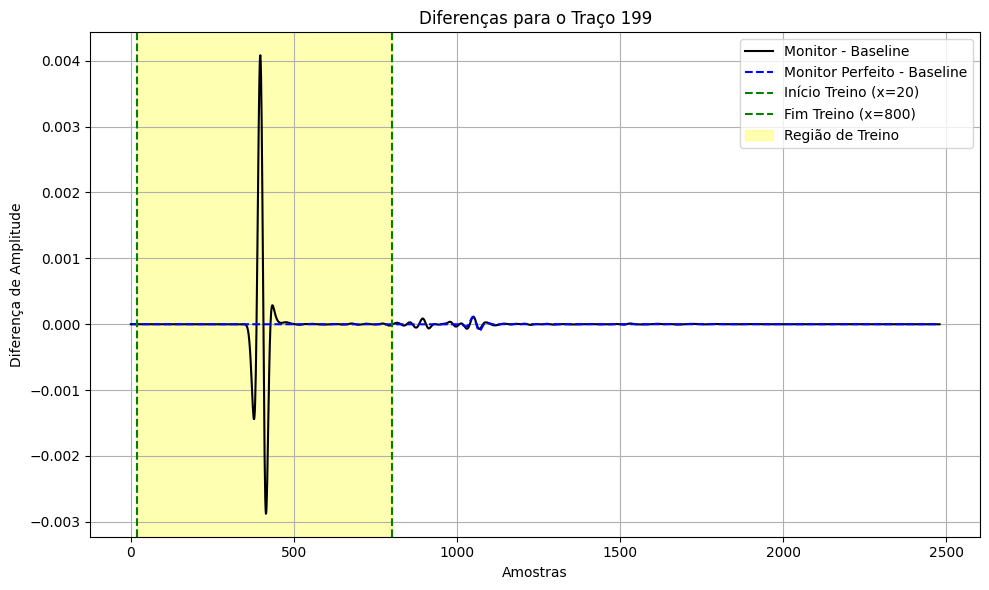

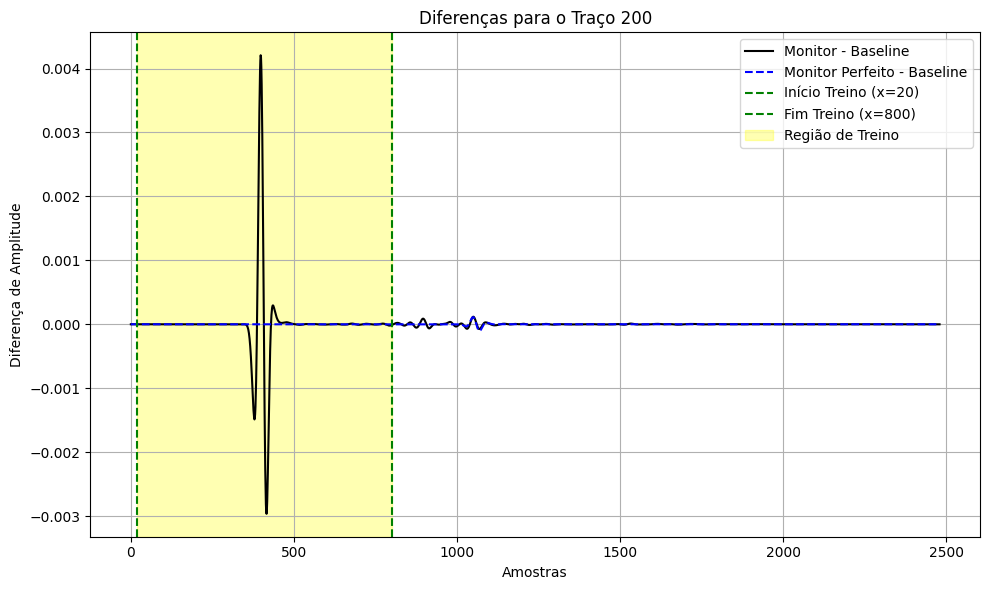

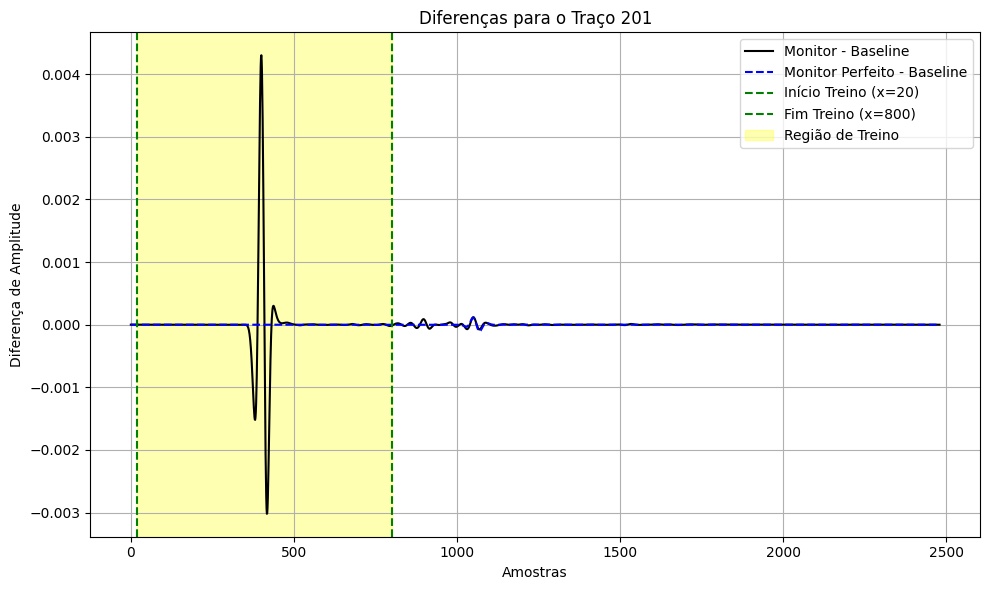

In [ ]:
traces_to_process = [199, 200, 201]

for trace_idx in traces_to_process:

  trace_baseline   = sis_baseline[trace_idx, :]
  trace_monitor    = sis_monitor[trace_idx, :]
  trace_monitor_p  = sis_perfect[trace_idx, :]

  # trace_idx = 200
  # trace_baseline, trace_monitor = trace(trace_idx)
  plot_dif(trace_baseline, trace_monitor, trace_monitor_p, trace_idx)

# Teste INDIVIDUAIS teste com inferência de mais traços

## **1 traço (199)** teste com inferência de mais traços

In [ ]:
traces_to_process       = 199

### bs = 128 , ep = 300

In [ ]:
bs = 128
ep = 300

moni_win, base_amp, model, history, scaler = train_one(traces_to_process, ep, bs)

trace_monitor (antes da norm) = 2500
trace_baseline (antes da norm) = 2500
trace_monitor (depois da norm) = 2500
trace_baseline (depois da norm) = 2500
Tam de moni_win (antes) = 780
Tam de base_amp (antes) = 780
Tam de moni_win (depois) = (780, 20, 1)
Tam de base_amp (depois) = (780, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gru (GRU)                            │ (None, 50)                  │           7,950 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,001 (31.25 KB)

 Trainable params: 8,001 (31.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/300
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 121ms/step - loss: 3.2938 - mean_absolute_error: 0.5575 - mean_squared_error: 3.2938 - val_loss: 0.0021 - val_mean_absolute_error: 0.0437 - val_mean_squared_error: 0.0021
Epoch 2/300
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 2.5432 - mean_absolute_error: 0.4671 - mean_squared_error: 2.5432 - val_loss: 7.3270e-04 - val_mean_absolute_error: 0.0258 - val_mean_squared_error: 7.3270e-04
Epoch 3/300
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 1.5141 - mean_absolute_error: 0.3207 - mean_squared_error: 1.5141 - val_loss: 1.4460e-04 - val_mean_absolute_error: 0.0101 - val_mean_squared_error: 1.4460e-04
Epoch 4/300
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 1.0010 - mean_absolute_error: 0.2770 - mean_squared_error: 1.0010 - val_loss: 2.6101e-04 - val_mean_absolute_error: 0.0133 - val_mean_squared_error: 2.6101e-04
Epoch 5/300
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.8008 - mean_absolute_error: 0.2528 - mean_squared_error: 0.8008 - val_loss:

In [ ]:
# print(moni_win) # moni_win_combined

In [ ]:
# regiao3 = moni_win[350:500, 10:15, 0]
# print("Região 3:")
# print(regiao3)

##### INFERÊNCIA DO TRAÇO 199

78/78 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
Traço 199:
           full   arrival  deep  reserv
baseline:  0.43       0.0  9.27    9.74
monitor:  13.64     13.65  9.21    8.61
matched:   0.34      0.33  2.37    1.85


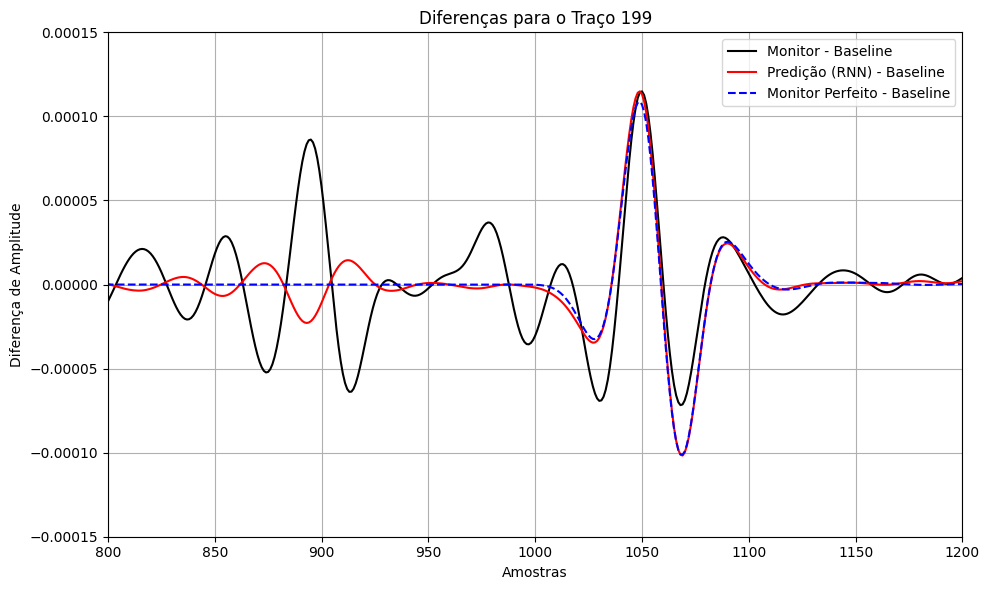

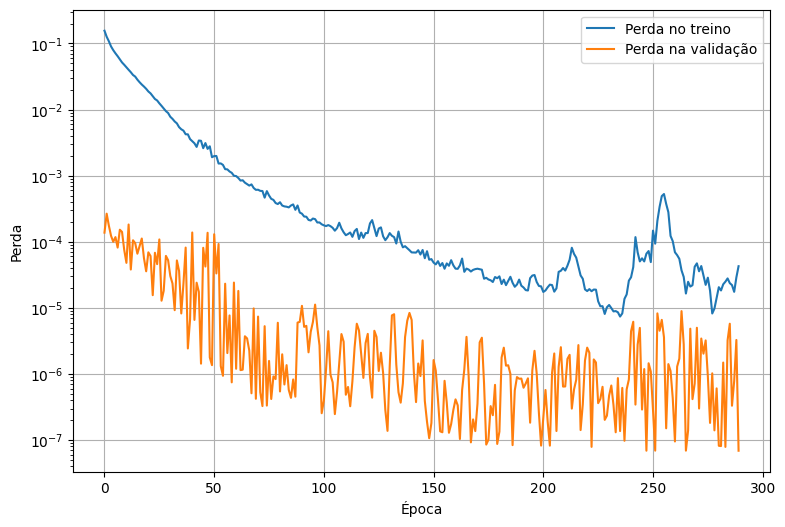

In [ ]:
test_one(traces_to_process, model, history, scaler)

##### INFERÊNCIA DO TRAÇO 199 INTEIRO

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 199:
           full   arrival  deep  reserv
baseline:  0.43       0.0  9.27    9.74
monitor:  13.64     13.65  9.21    8.61
matched:   0.34      0.33  2.37    1.85


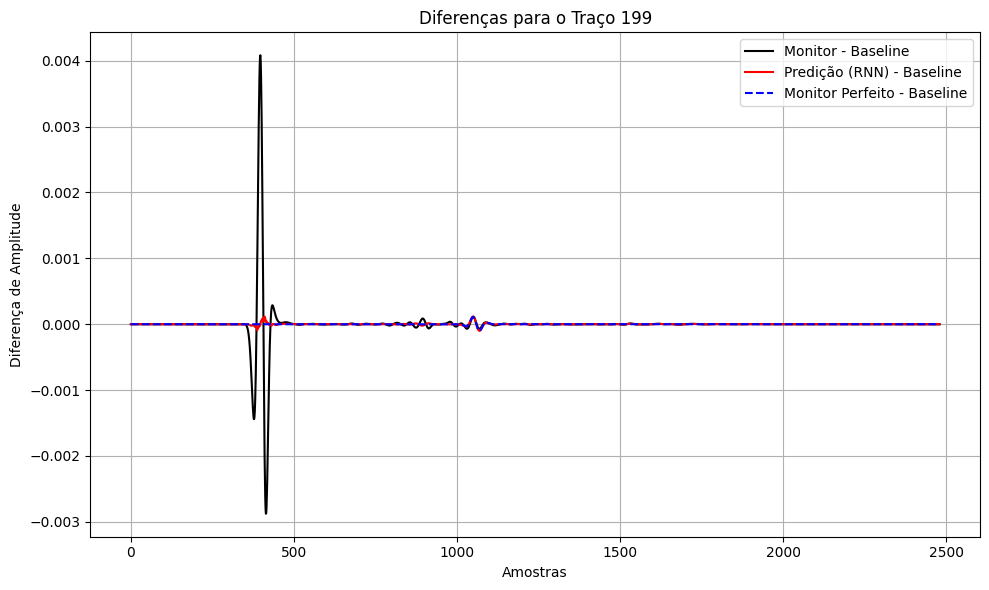

In [ ]:
test_all_all_trace(traces_to_process, model, history, scaler)

##### INFERÊNCIA DOS 3 TRAÇOS INTEIROS

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 199:
           full   arrival  deep  reserv
baseline:  0.43       0.0  9.27    9.74
monitor:  13.64     13.65  9.21    8.61
matched:   0.34      0.33  2.37    1.85


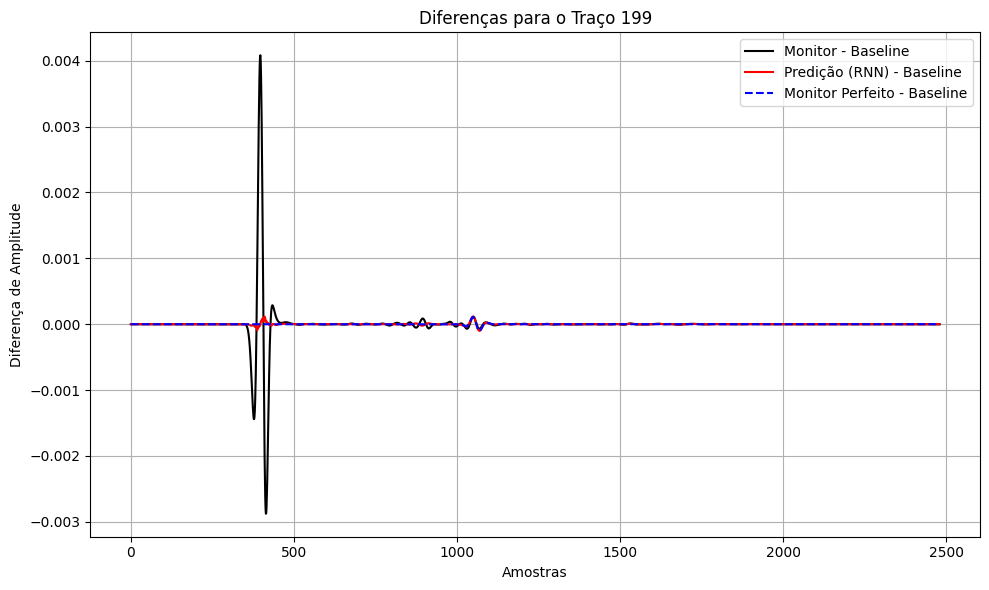

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.39      0.38  2.34    1.82


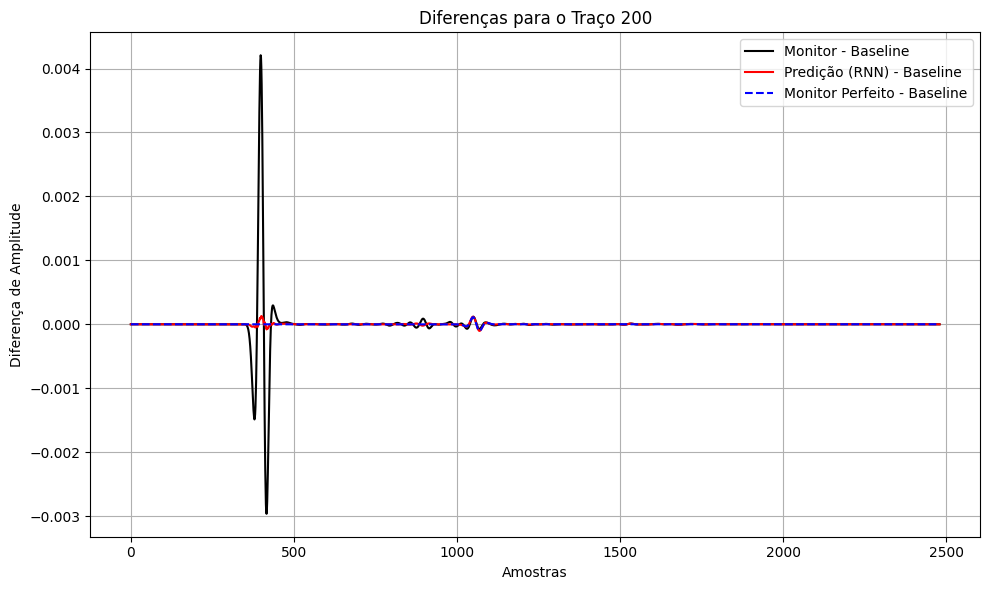

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 201:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.61    10.03
monitor:  14.41     14.42  9.33    8.74
matched:   1.03      1.03  2.3    1.79


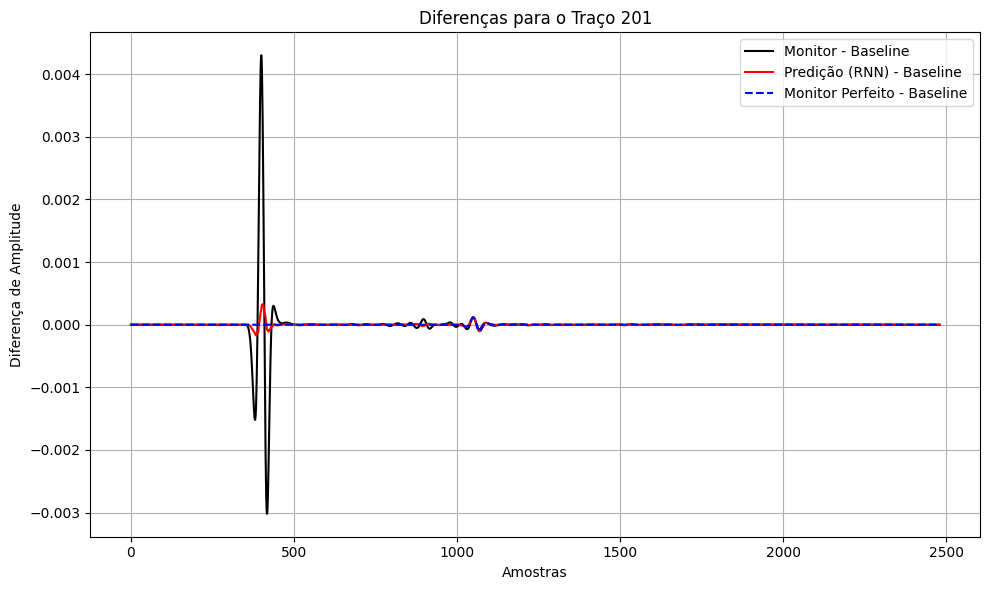

In [ ]:
traces_to_process_three = [199, 200, 201]
test_all_three_traces(traces_to_process_three, model, history, scaler)

##### INFERÊNCIA DOS 5 TRAÇOS INTEIROS

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 198:
           full   arrival  deep  reserv
baseline:  0.42       0.0  9.1    9.61
monitor:  13.26     13.26  9.15    8.57
matched:   0.53      0.52  2.48    1.97


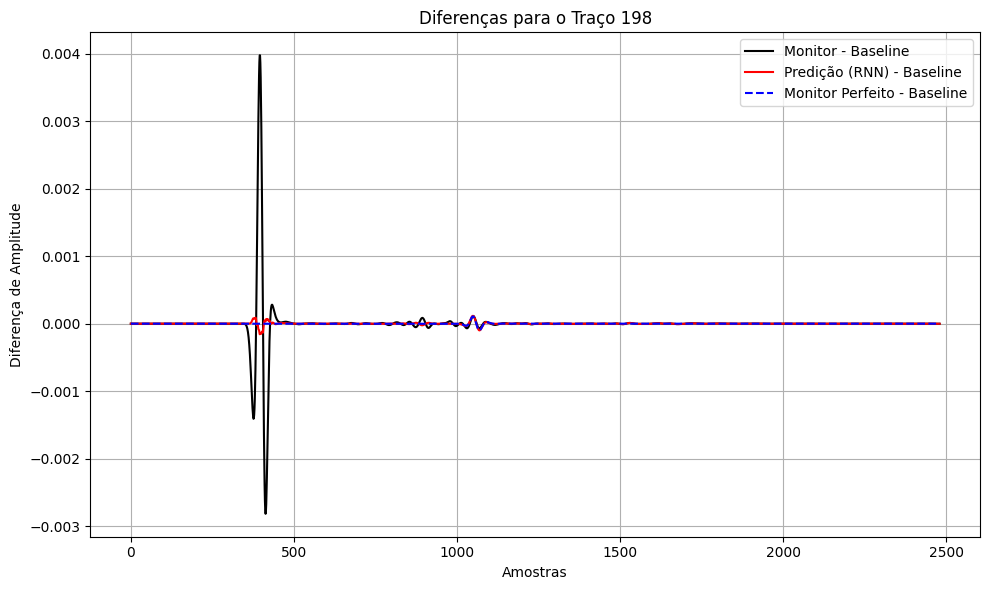

78/78 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
Traço 199:
           full   arrival  deep  reserv
baseline:  0.43       0.0  9.27    9.74
monitor:  13.64     13.65  9.21    8.61
matched:   0.34      0.33  2.37    1.85


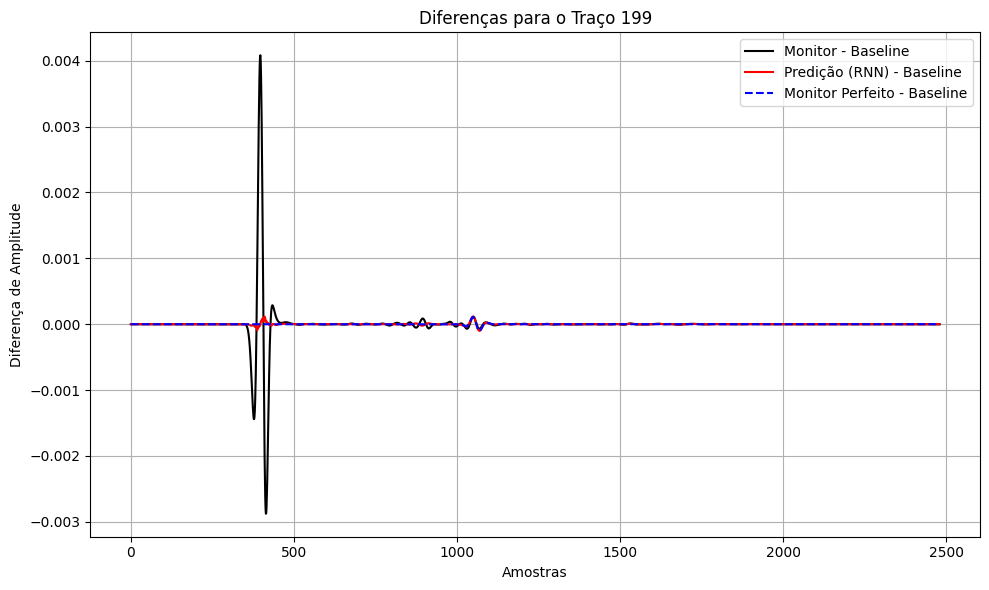

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.39      0.38  2.34    1.82


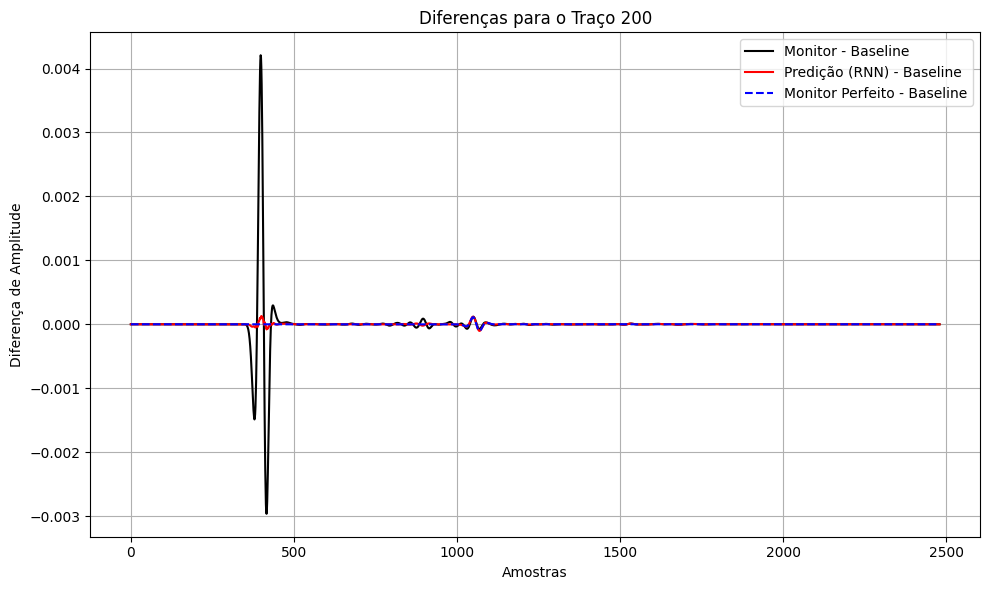

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 201:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.61    10.03
monitor:  14.41     14.42  9.33    8.74
matched:   1.03      1.03  2.3    1.79


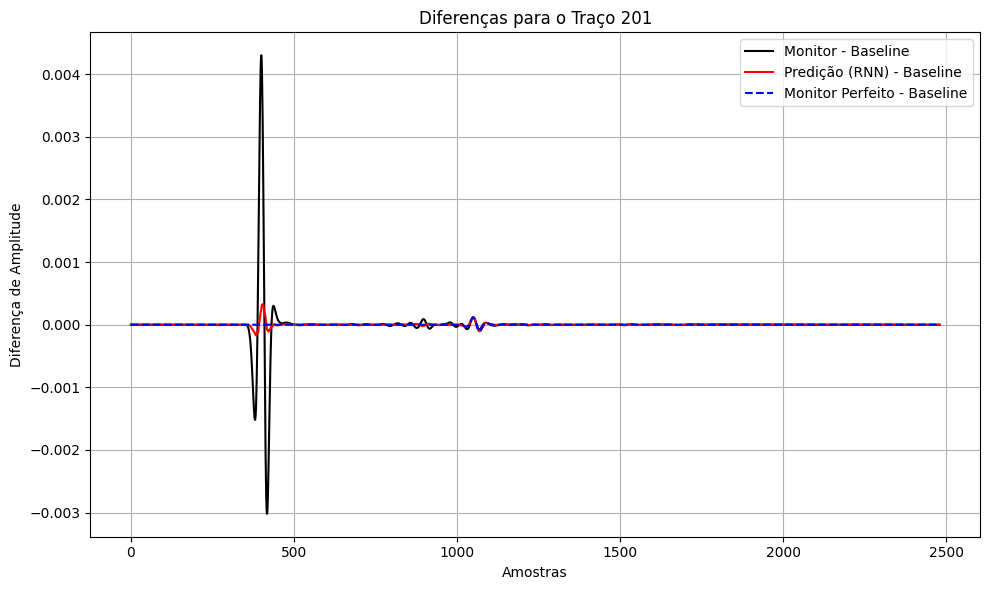

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 202:
           full   arrival  deep  reserv
baseline:  0.45       0.0  9.77    10.19
monitor:  14.8     14.81  9.39    8.83
matched:   1.28      1.28  2.23    1.73


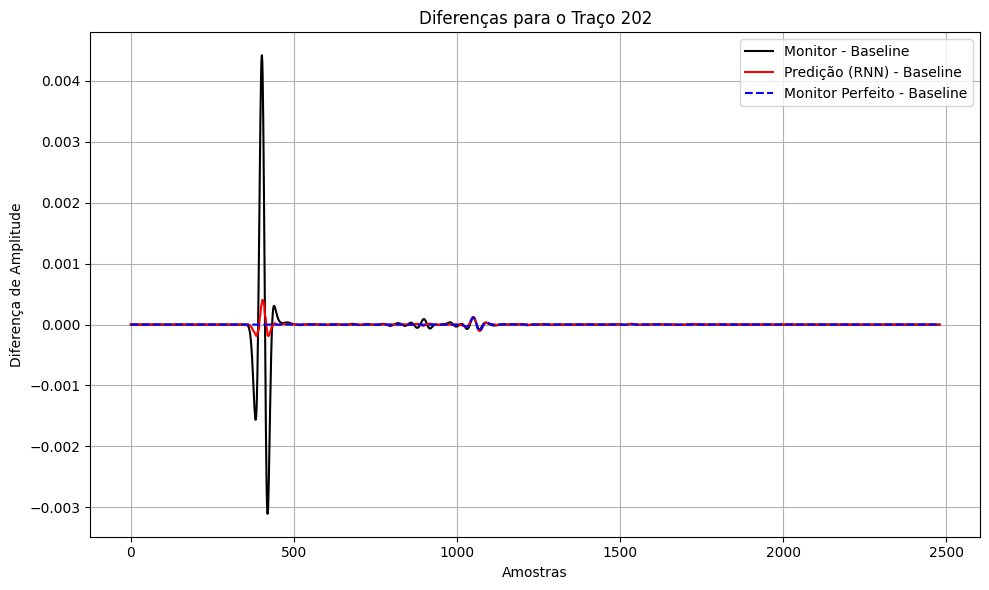

In [ ]:
traces_to_process_three = [198, 199, 200, 201, 202]
test_all_three_traces(traces_to_process_three, model, history, scaler)

## **1 traço (200)**

In [ ]:
traces_to_process       = 200

### bs = 128 , ep = 300

In [ ]:
bs = 128
ep = 300

moni_win, base_amp, model, history, scaler = train_one(traces_to_process, ep, bs)

trace_monitor (antes da norm) = 2500
trace_baseline (antes da norm) = 2500
trace_monitor (depois da norm) = 2500
trace_baseline (depois da norm) = 2500
Tam de moni_win (antes) = 780
Tam de base_amp (antes) = 780
Tam de moni_win (depois) = (780, 20, 1)
Tam de base_amp (depois) = (780, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gru_1 (GRU)                          │ (None, 50)                  │           7,950 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,001 (31.25 KB)

 Trainable params: 8,001 (31.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/300
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - loss: 3.9017 - mean_absolute_error: 0.5935 - mean_squared_error: 3.9017 - val_loss: 0.0033 - val_mean_absolute_error: 0.0548 - val_mean_squared_error: 0.0033
Epoch 2/300
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 2.6779 - mean_absolute_error: 0.5036 - mean_squared_error: 2.6779 - val_loss: 0.0064 - val_mean_absolute_error: 0.0793 - val_mean_squared_error: 0.0064
Epoch 3/300
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 1.7894 - mean_absolute_error: 0.4057 - mean_squared_error: 1.7894 - val_loss: 0.0020 - val_mean_absolute_error: 0.0446 - val_mean_squared_error: 0.0020
Epoch 4/300
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 1.1481 - mean_absolute_error: 0.2903 - mean_squared_error: 1.1481 - val_loss: 9.5481e-04 - val_mean_absolute_error: 0.0300 - val_mean_squared_error: 9.5481e-04
Epoch 5/300
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.8006 - mean_absolute_error: 0.2666 - mean_squared_error: 0.8006 - val_loss: 0.0043 - val_me

##### INFERÊNCIA DO TRAÇO

78/78 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.89      0.85  5.69    3.67


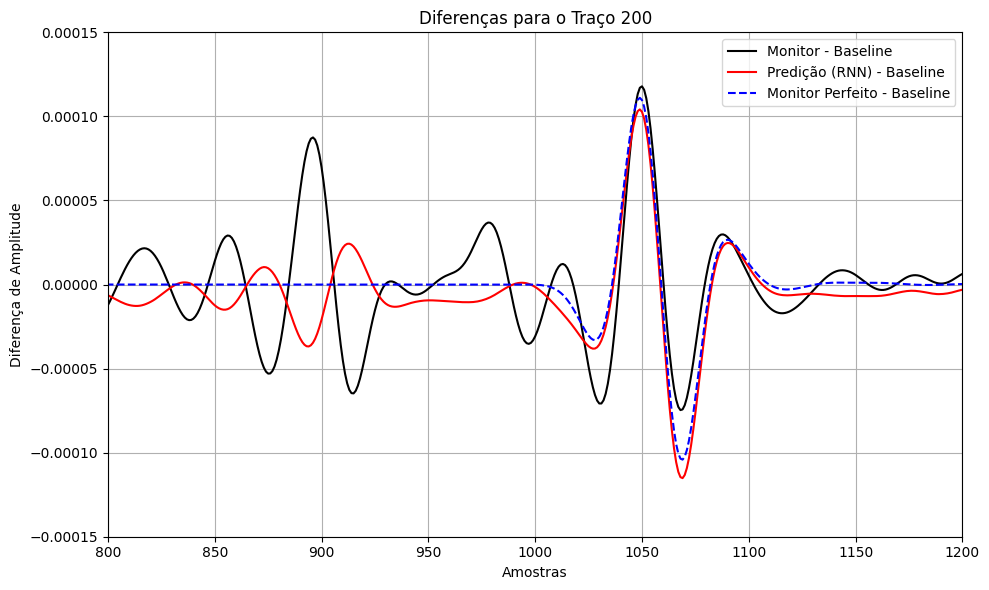

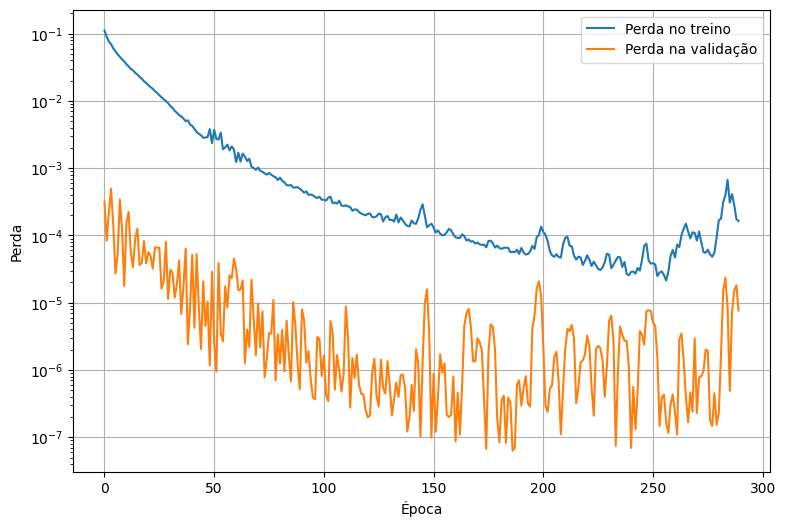

In [ ]:
test_one(traces_to_process, model, history, scaler)

##### INFERÊNCIA DO TRAÇO INTEIRO

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.89      0.85  5.69    3.67


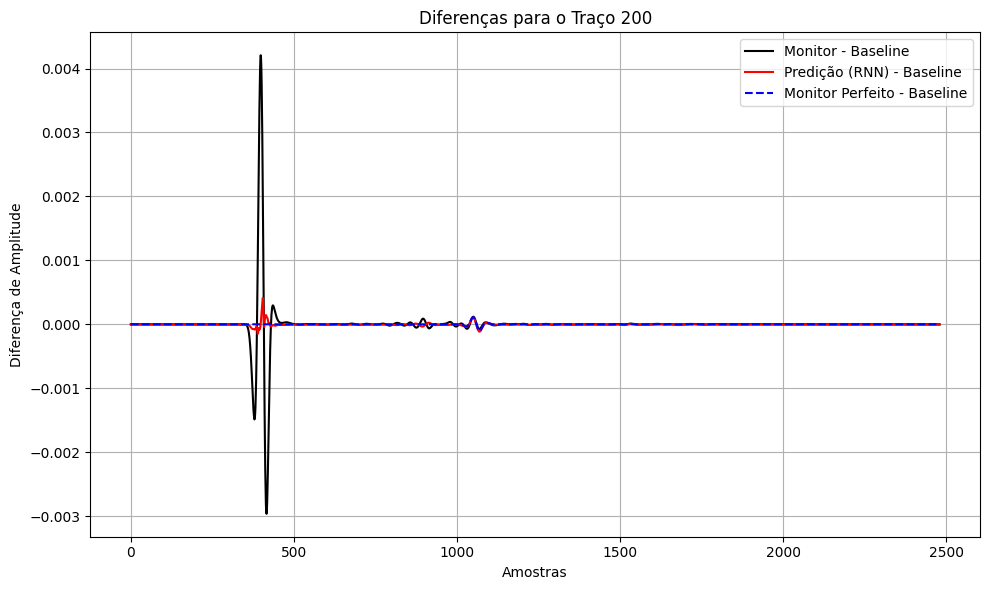

In [ ]:
test_all_all_trace(traces_to_process, model, history, scaler)

##### INFERÊNCIA DOS 17 TRAÇOS INTEIROS

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 192:
           full   arrival  deep  reserv
baseline:  0.36       0.0  7.92    8.67
monitor:  11.04     11.04  8.83    8.58
matched:   2.96      2.95  5.74    3.89


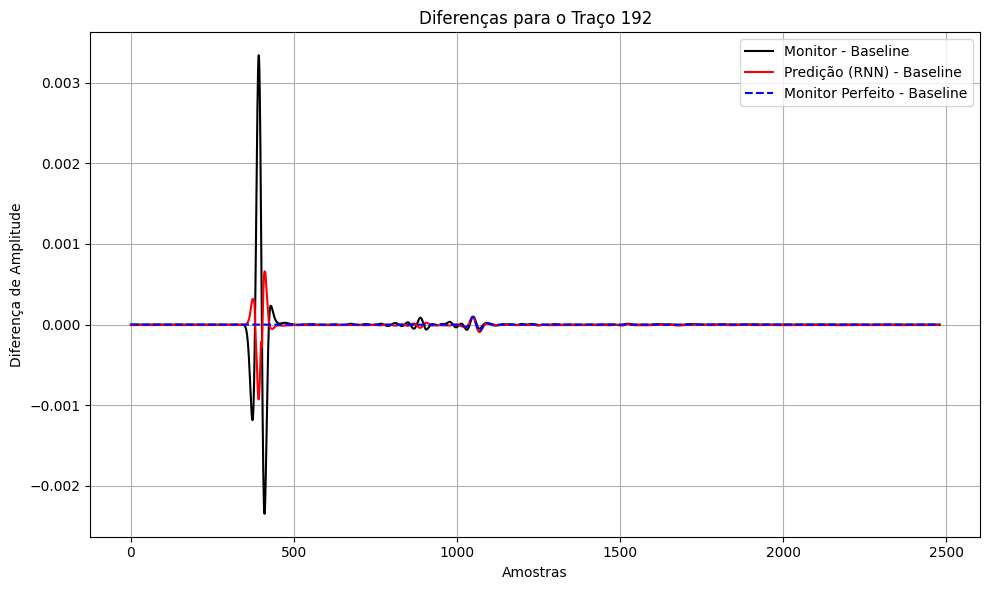

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 193:
           full   arrival  deep  reserv
baseline:  0.37       0.0  8.14    8.87
monitor:  11.4     11.4  8.88    8.59
matched:   2.61      2.6  5.79    3.93


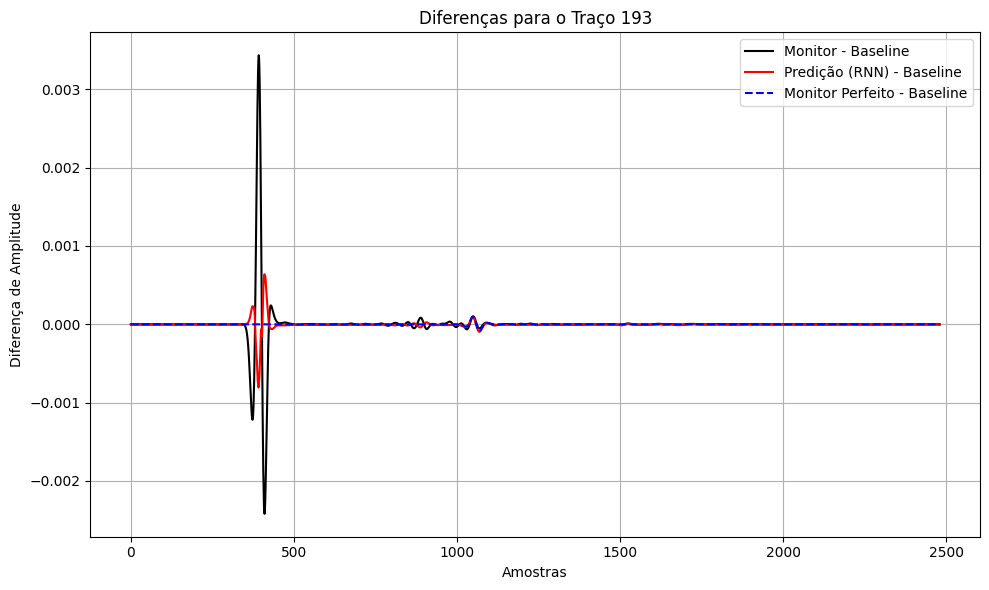

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 194:
           full   arrival  deep  reserv
baseline:  0.38       0.0  8.36    9.05
monitor:  11.76     11.77  8.93    8.59
matched:   2.26      2.24  5.73    3.82


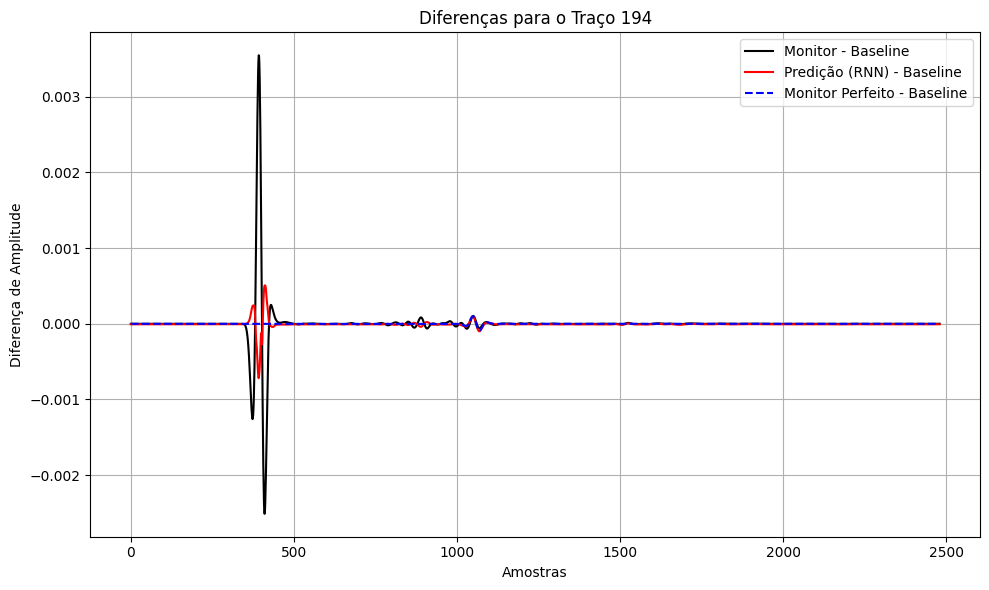

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 195:
           full   arrival  deep  reserv
baseline:  0.39       0.0  8.56    9.21
monitor:  12.13     12.13  8.99    8.57
matched:   1.92      1.9  5.79    3.86


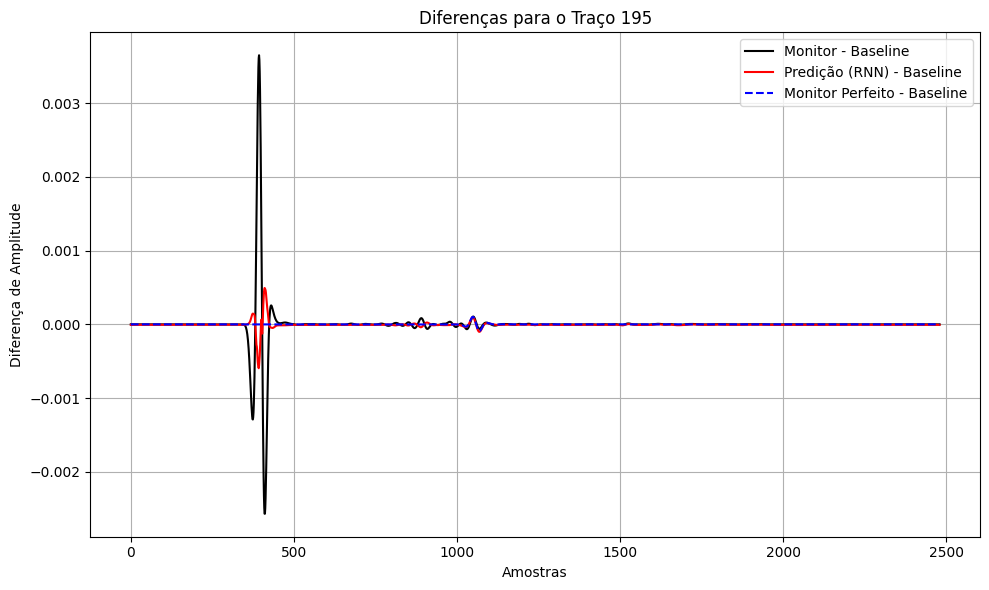

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 196:
           full   arrival  deep  reserv
baseline:  0.4       0.0  8.75    9.35
monitor:  12.5     12.51  9.04    8.55
matched:   1.55      1.52  5.73    3.74


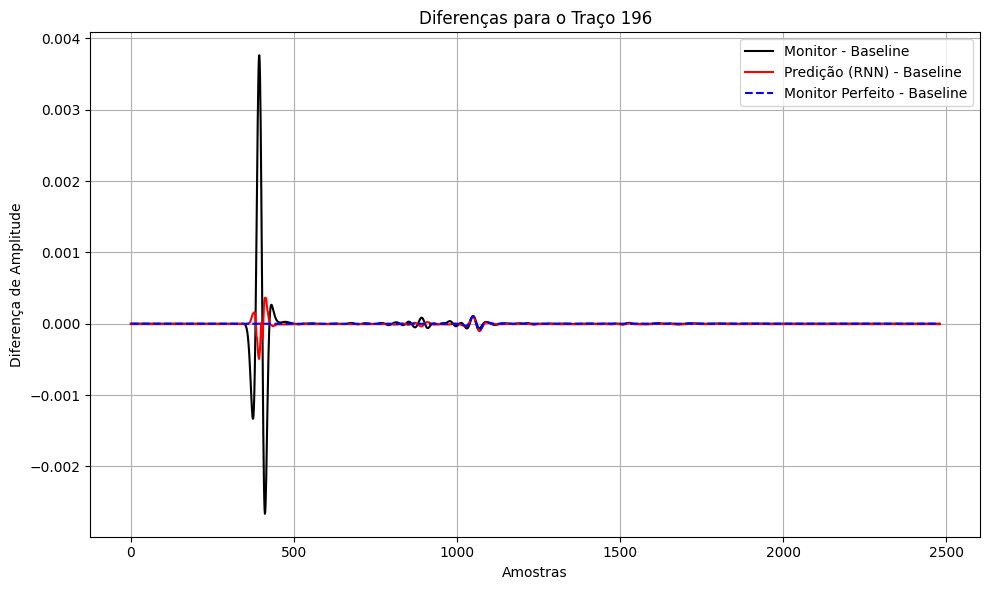

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 197:
           full   arrival  deep  reserv
baseline:  0.41       0.0  8.93    9.48
monitor:  12.88     12.89  9.1    8.55
matched:   1.31      1.28  5.79    3.81


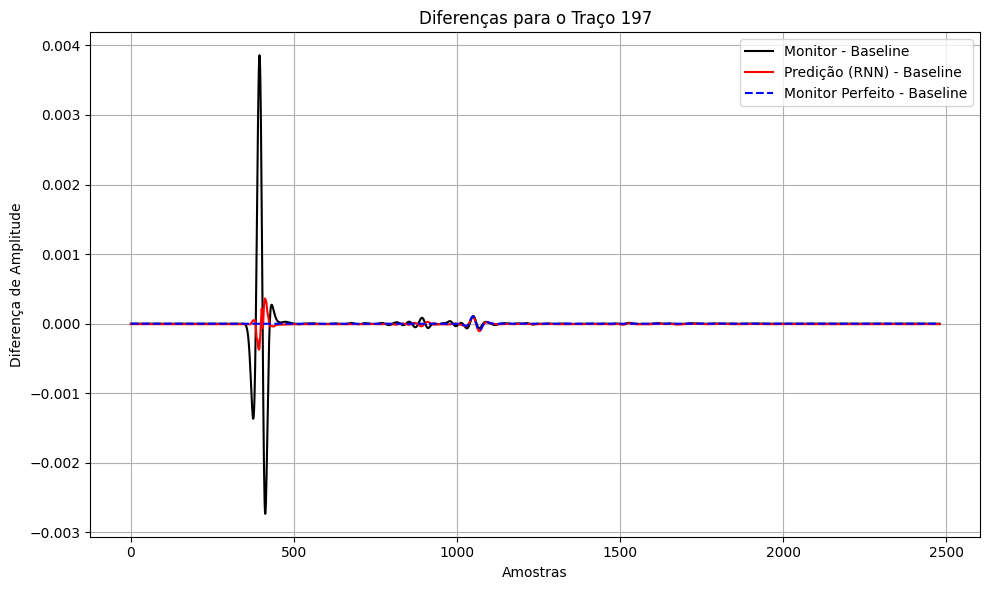

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 198:
           full   arrival  deep  reserv
baseline:  0.42       0.0  9.1    9.61
monitor:  13.26     13.26  9.15    8.57
matched:   0.94      0.9  5.7    3.68


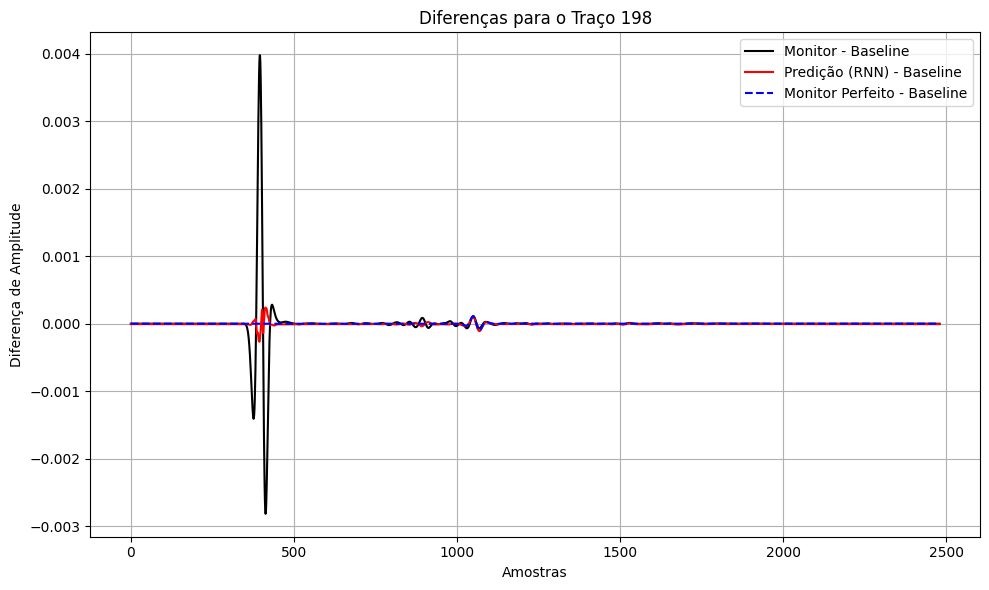

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 199:
           full   arrival  deep  reserv
baseline:  0.43       0.0  9.27    9.74
monitor:  13.64     13.65  9.21    8.61
matched:   1.06      1.02  5.78    3.8


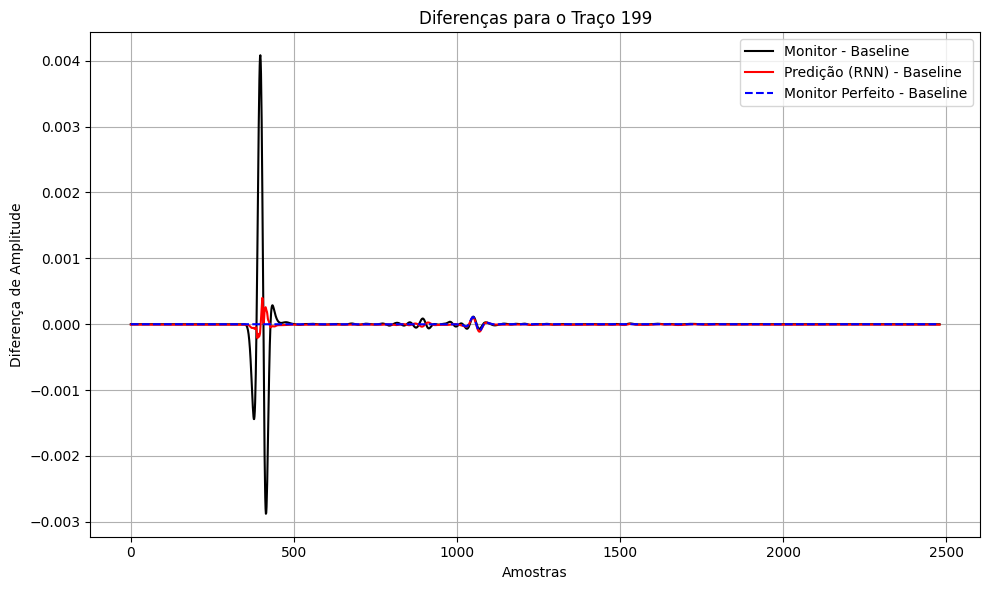

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.89      0.85  5.69    3.67


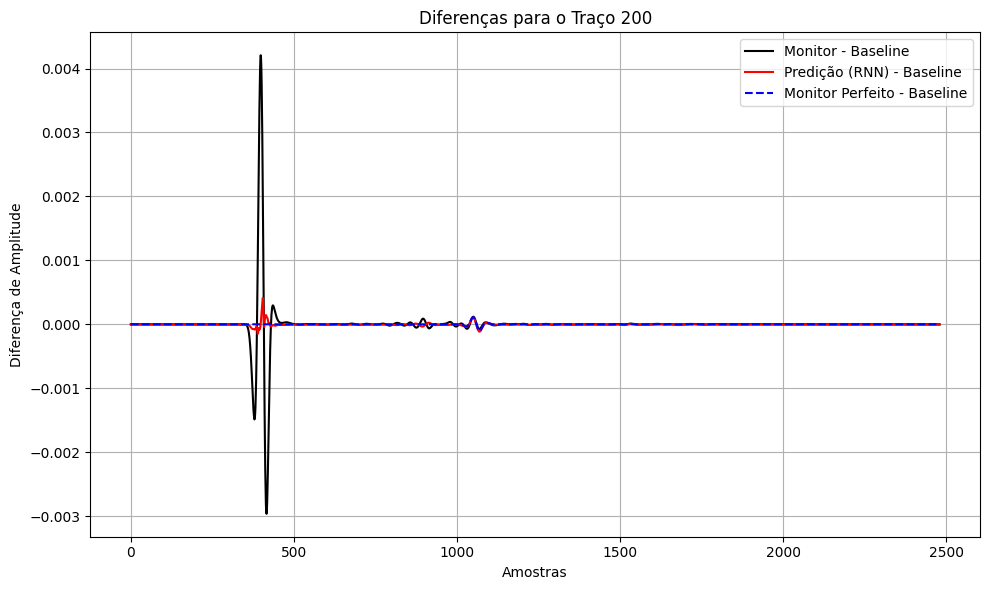

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 201:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.61    10.03
monitor:  14.41     14.42  9.33    8.74
matched:   1.47      1.44  5.82    3.84


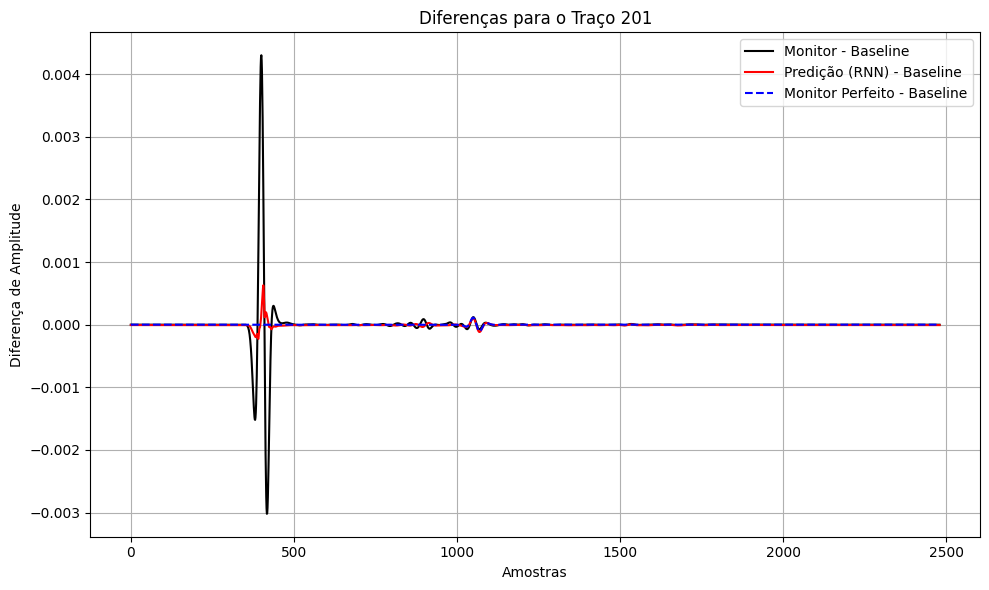

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Traço 202:
           full   arrival  deep  reserv
baseline:  0.45       0.0  9.77    10.19
monitor:  14.8     14.81  9.39    8.83
matched:   1.55      1.53  5.73    3.73


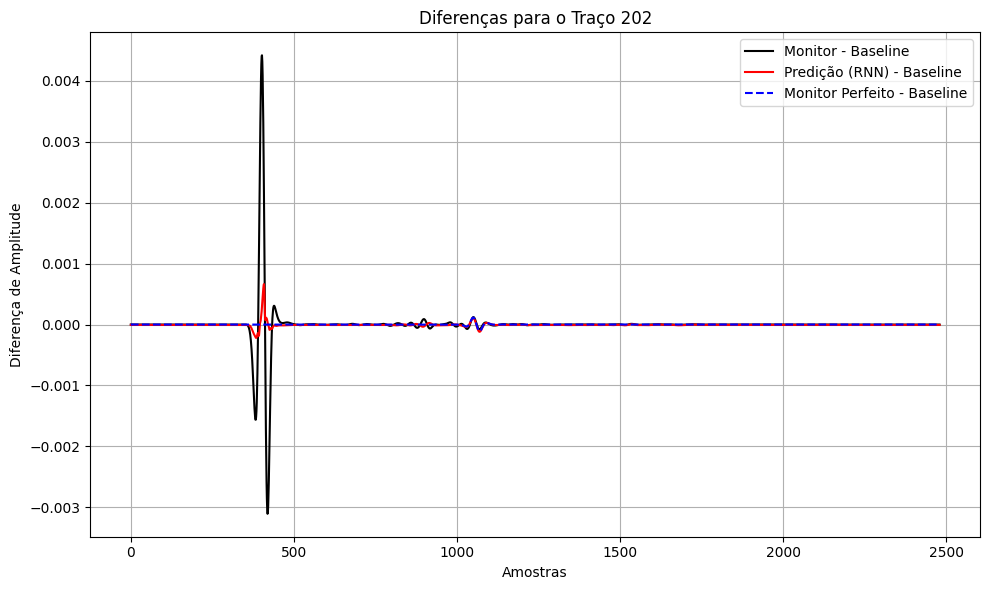

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 203:
           full   arrival  deep  reserv
baseline:  0.46       0.0  9.92    10.35
monitor:  15.19     15.2  9.44    8.94
matched:   2.25      2.23  5.91    3.98


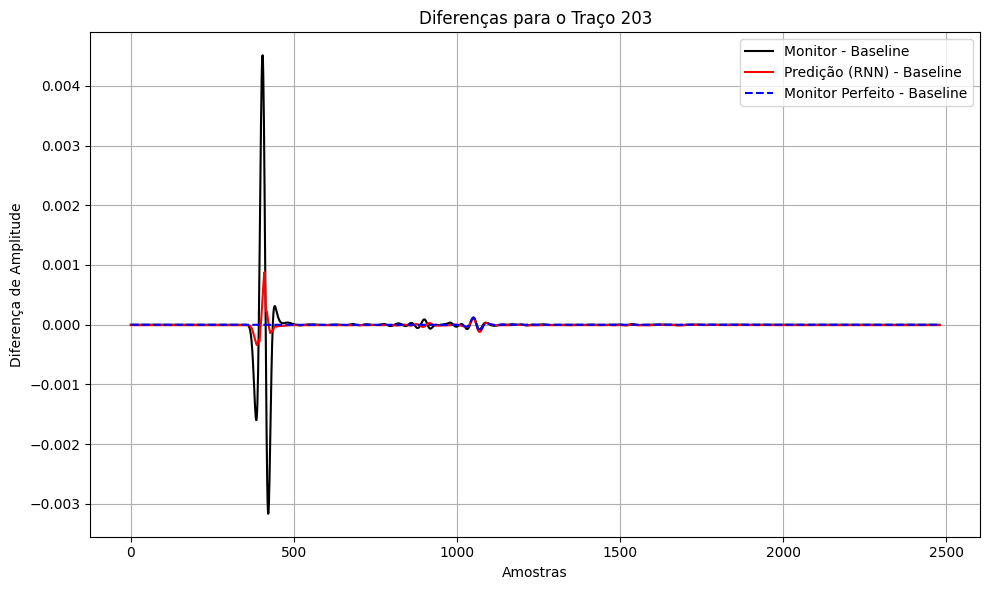

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Traço 204:
           full   arrival  deep  reserv
baseline:  0.47       0.0  10.07    10.51
monitor:  15.57     15.58  9.5    9.06
matched:   2.45      2.44  5.84    3.89


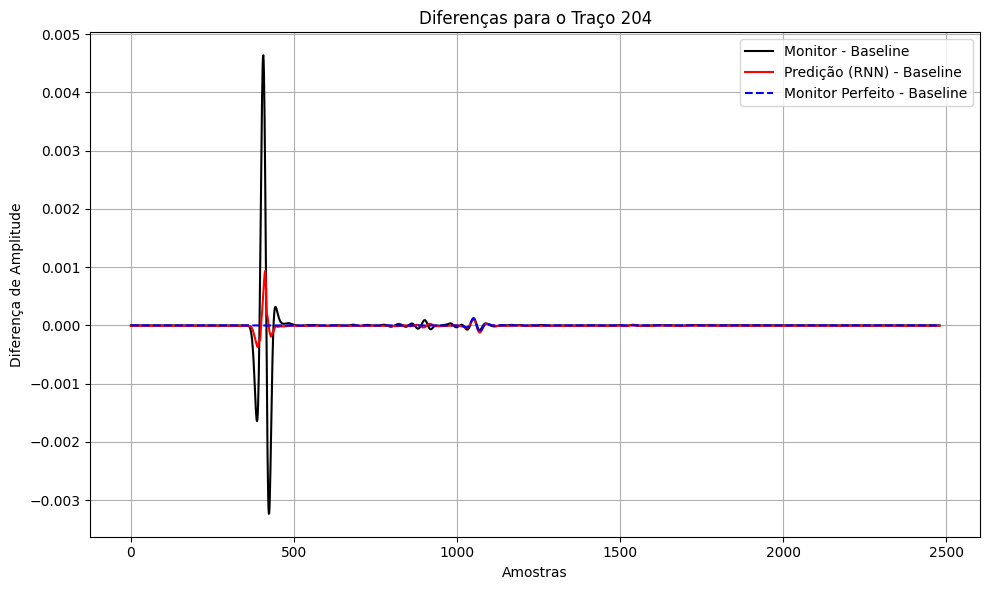

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 205:
           full   arrival  deep  reserv
baseline:  0.47       0.0  10.2    10.66
monitor:  15.96     15.98  9.57    9.19
matched:   3.18      3.17  6.08    4.23


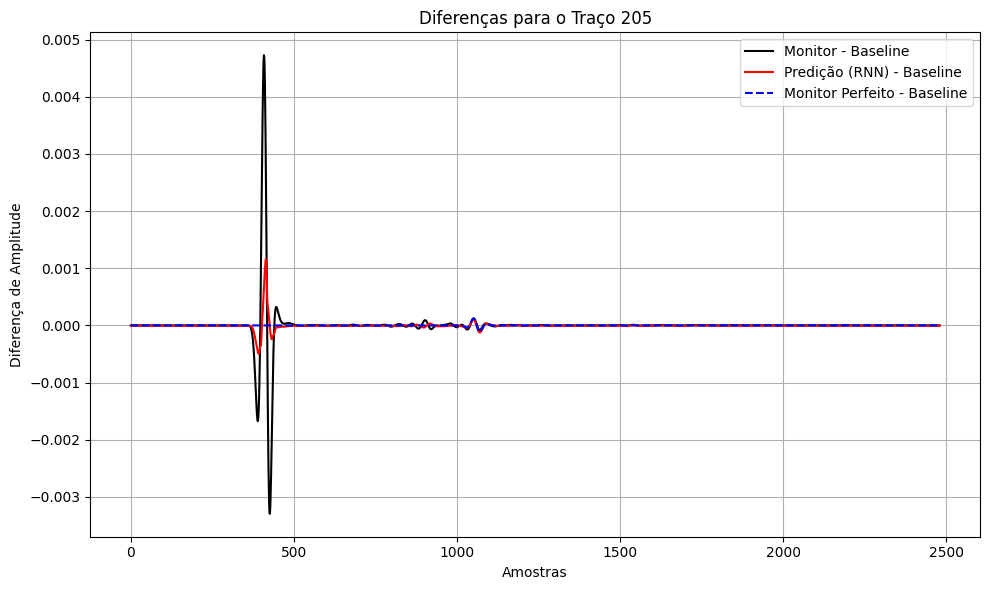

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 206:
           full   arrival  deep  reserv
baseline:  0.48       0.0  10.32    10.8
monitor:  16.35     16.36  9.64    9.32
matched:   3.45      3.44  6.04    4.18


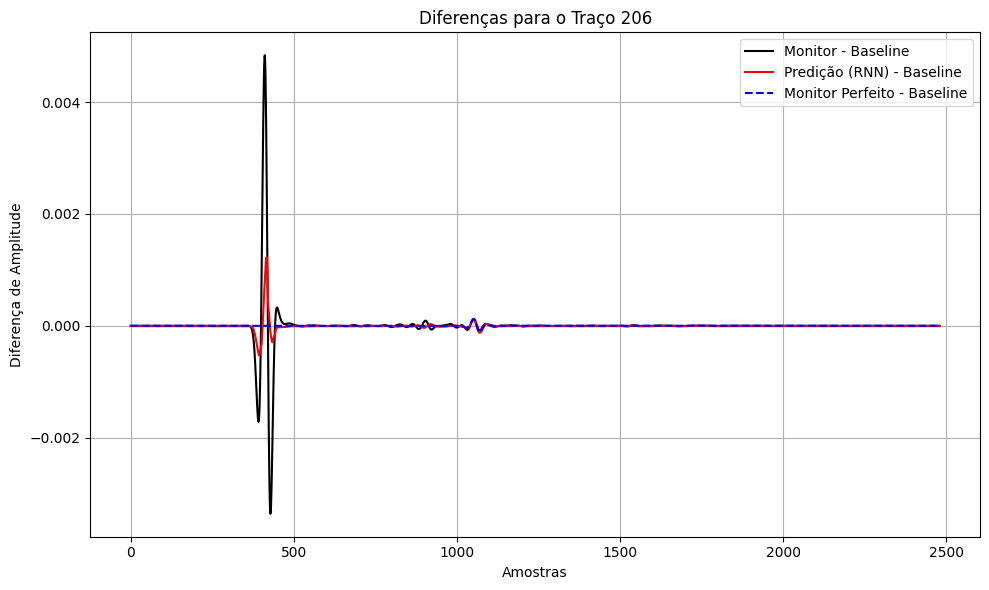

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 207:
           full   arrival  deep  reserv
baseline:  0.48       0.0  10.43    10.93
monitor:  16.74     16.75  9.71    9.44
matched:   4.19      4.18  6.34    4.6


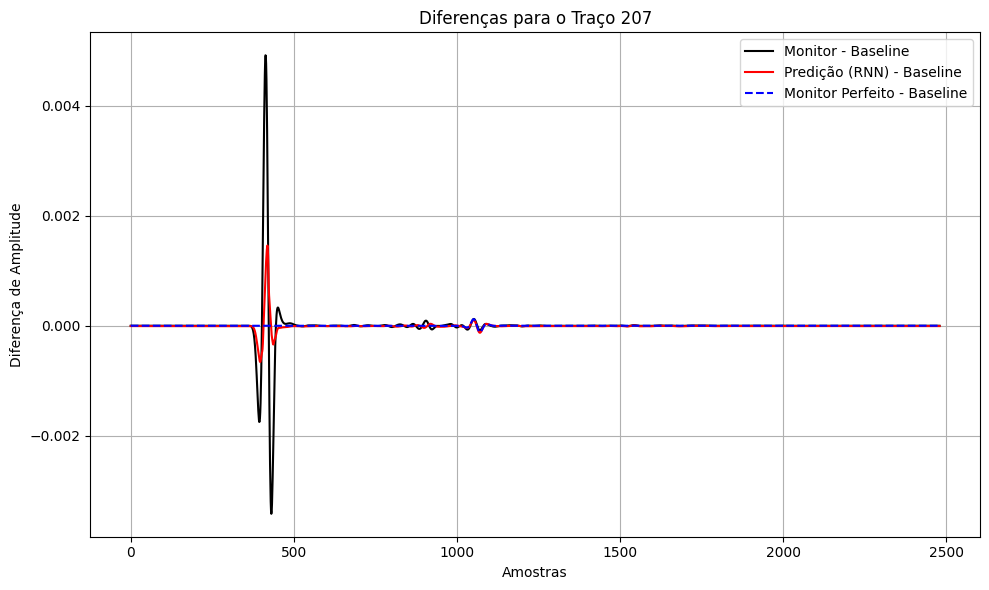

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 208:
           full   arrival  deep  reserv
baseline:  0.49       0.0  10.53    11.04
monitor:  17.11     17.13  9.79    9.54
matched:   4.5      4.5  6.33    4.6


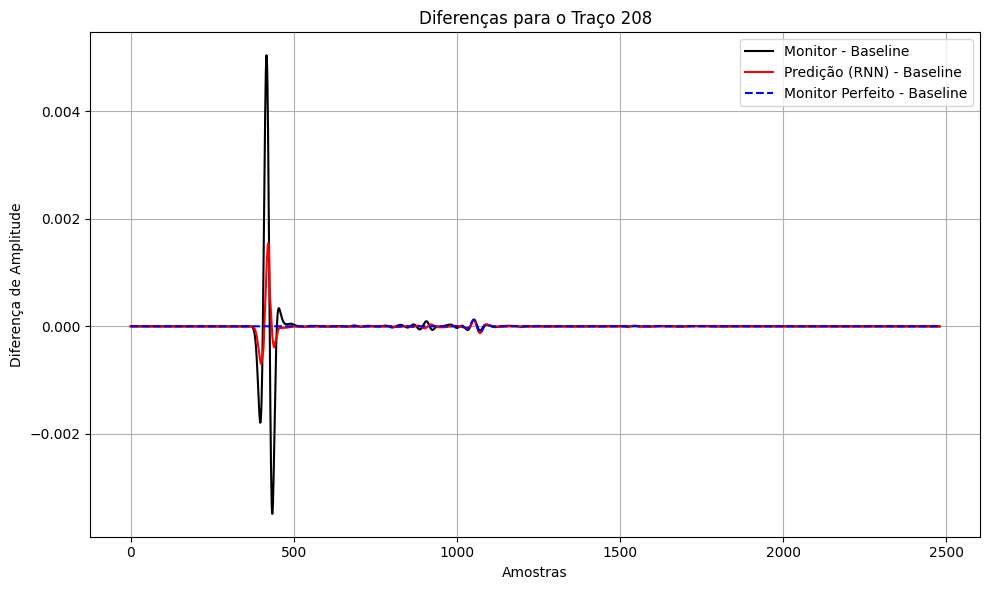

In [ ]:
# Inferência dos 17 traços com o treino no traço 200
traces_to_process_three = [192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208]
test_all_three_traces(traces_to_process_three, model, history, scaler)

### bs = 256 , ep = 300

In [ ]:
bs = 256
ep = 300

moni_win, base_amp, model, history, scaler = train_one(traces_to_process, ep, bs)

trace_monitor (antes da norm) = 2500
trace_baseline (antes da norm) = 2500
trace_monitor (depois da norm) = 2500
trace_baseline (depois da norm) = 2500
Tam de moni_win (antes) = 780
Tam de base_amp (antes) = 780
Tam de moni_win (depois) = (780, 20, 1)
Tam de base_amp (depois) = (780, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gru_2 (GRU)                          │ (None, 50)                  │           7,950 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,001 (31.25 KB)

 Trainable params: 8,001 (31.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/300
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 331ms/step - loss: 3.6988 - mean_absolute_error: 0.5729 - mean_squared_error: 3.6988 - val_loss: 0.0025 - val_mean_absolute_error: 0.0458 - val_mean_squared_error: 0.0025
Epoch 2/300
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 2.9866 - mean_absolute_error: 0.5289 - mean_squared_error: 2.9866 - val_loss: 0.0038 - val_mean_absolute_error: 0.0600 - val_mean_squared_error: 0.0038
Epoch 3/300
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 2.8045 - mean_absolute_error: 0.5163 - mean_squared_error: 2.8045 - val_loss: 0.0031 - val_mean_absolute_error: 0.0545 - val_mean_squared_error: 0.0031
Epoch 4/300
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 2.0935 - mean_absolute_error: 0.4264 - mean_squared_error: 2.0935 - val_loss: 0.0011 - val_mean_absolute_error: 0.0329 - val_mean_squared_error: 0.0011
Epoch 5/300
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 1.5992 - mean_absolute_error: 0.3404 - mean_squared_error: 1.5992 - val_loss: 4.2656e-05 - val_mean_a

##### INFERÊNCIA DO TRAÇO

78/78 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.58      0.55  4.02    3.74


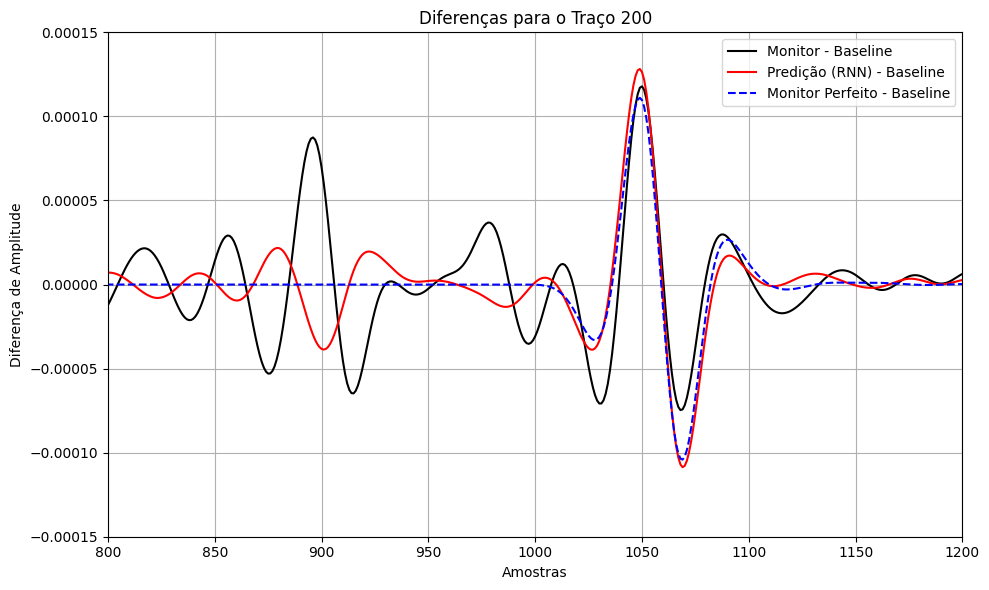

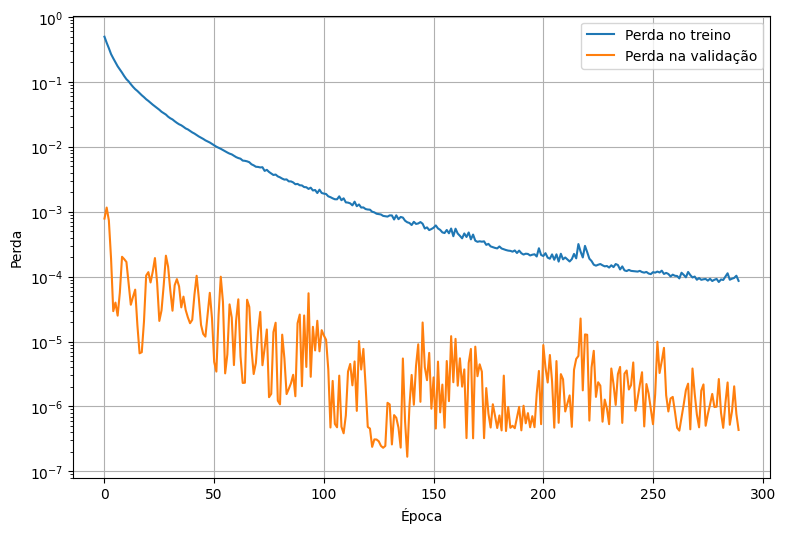

In [ ]:
test_one(traces_to_process, model, history, scaler)

##### INFERÊNCIA DO TRAÇO INTEIRO

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.58      0.55  4.02    3.74


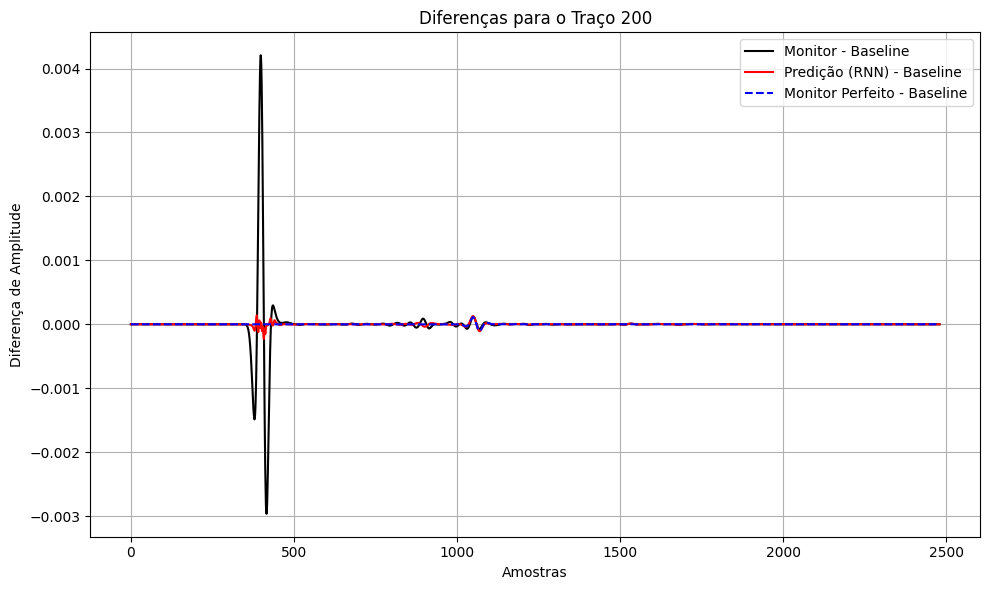

In [ ]:
test_all_all_trace(traces_to_process, model, history, scaler)

##### INFERÊNCIA DOS 17 TRAÇOS INTEIROS

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 192:
           full   arrival  deep  reserv
baseline:  0.36       0.0  7.92    8.67
monitor:  11.04     11.04  8.83    8.58
matched:   3.25      3.24  4.77    4.55


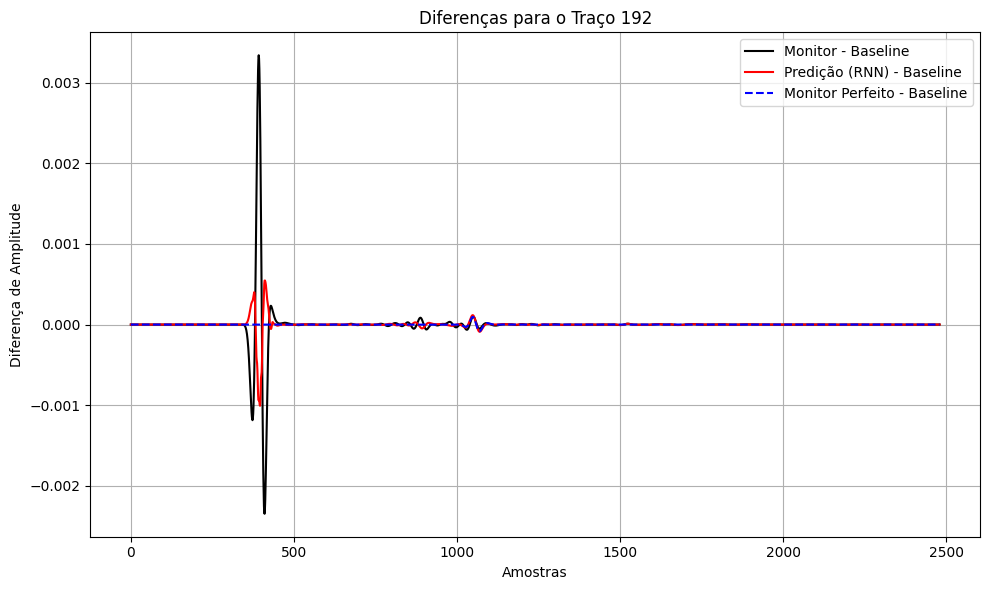

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 193:
           full   arrival  deep  reserv
baseline:  0.37       0.0  8.14    8.87
monitor:  11.4     11.4  8.88    8.59
matched:   2.78      2.78  4.45    4.2


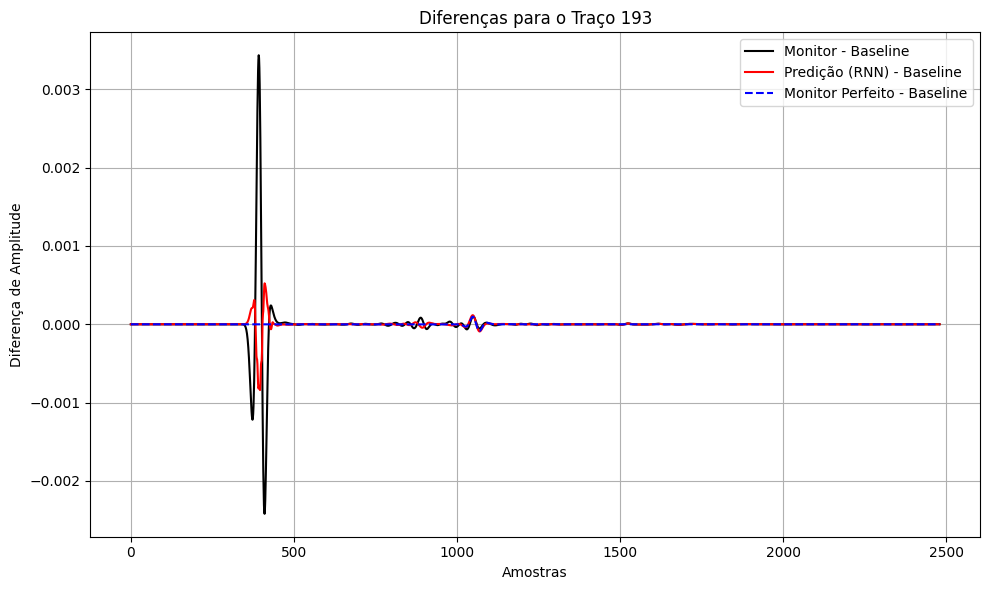

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 194:
           full   arrival  deep  reserv
baseline:  0.38       0.0  8.36    9.05
monitor:  11.76     11.77  8.93    8.59
matched:   2.57      2.57  4.71    4.45


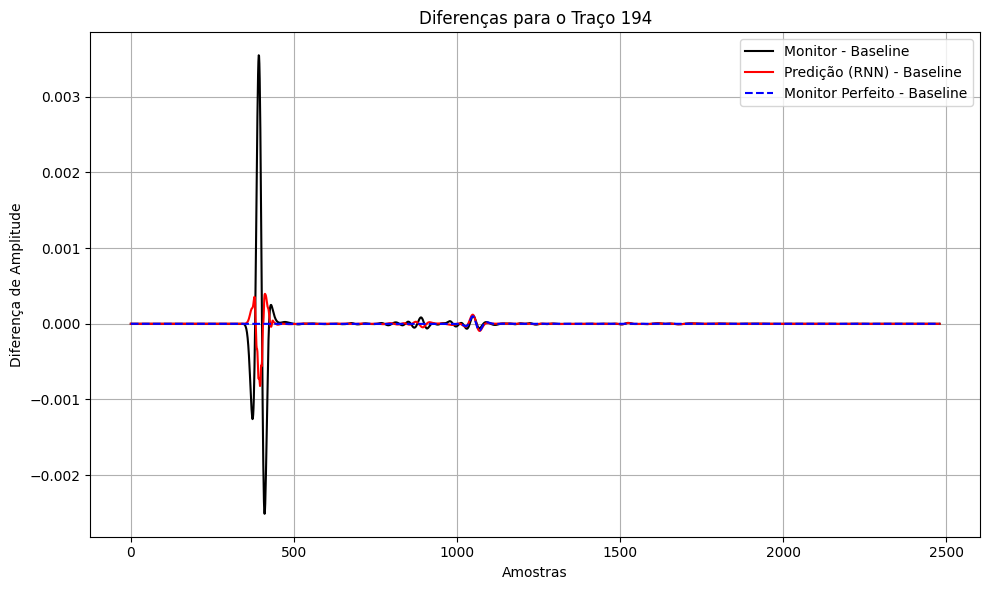

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 195:
           full   arrival  deep  reserv
baseline:  0.39       0.0  8.56    9.21
monitor:  12.13     12.13  8.99    8.57
matched:   2.06      2.06  4.35    4.06


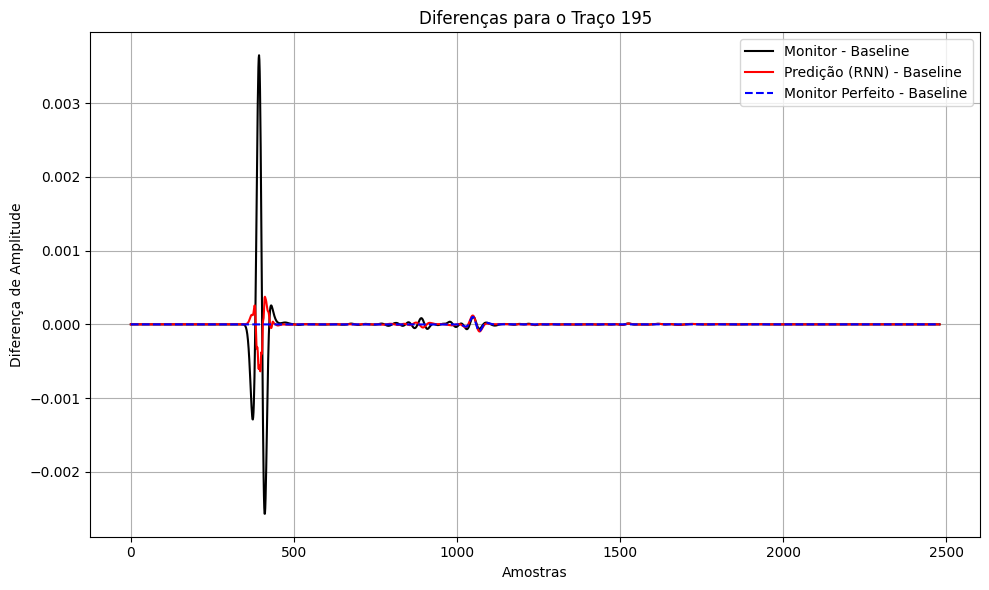

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 196:
           full   arrival  deep  reserv
baseline:  0.4       0.0  8.75    9.35
monitor:  12.5     12.51  9.04    8.55
matched:   1.86      1.85  4.56    4.27


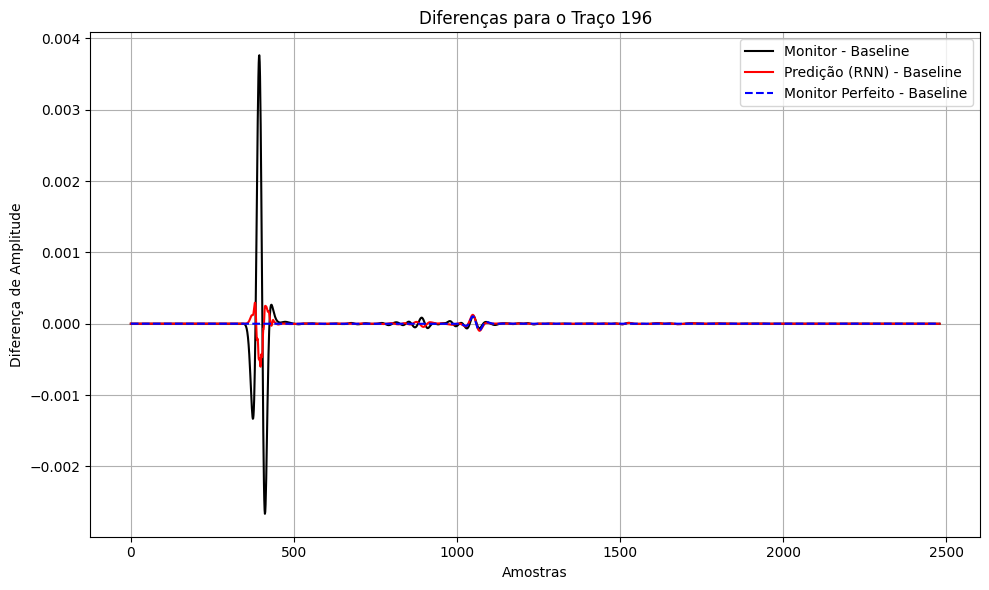

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 197:
           full   arrival  deep  reserv
baseline:  0.41       0.0  8.93    9.48
monitor:  12.88     12.89  9.1    8.55
matched:   1.32      1.31  4.16    3.85


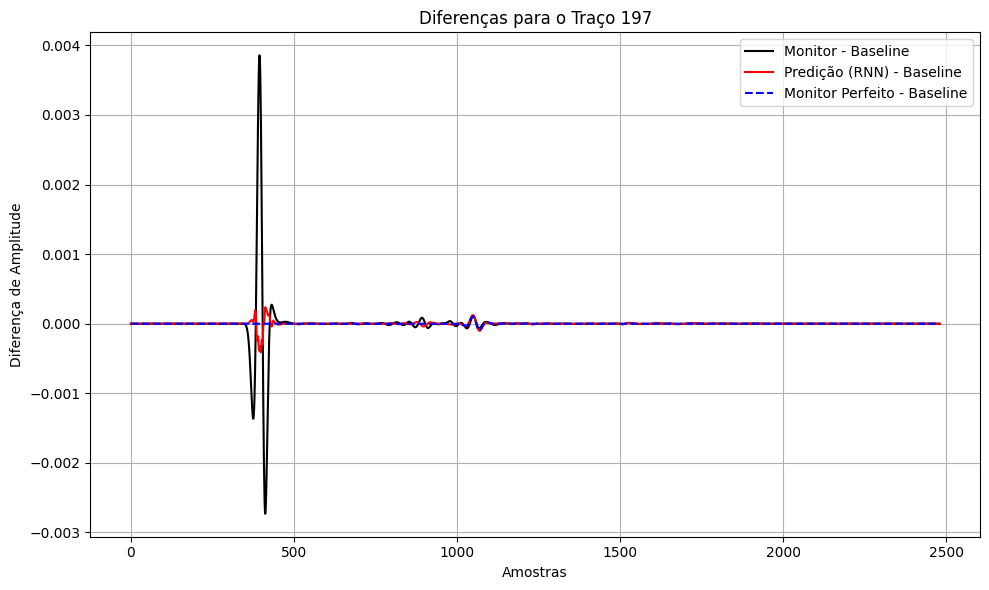

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 198:
           full   arrival  deep  reserv
baseline:  0.42       0.0  9.1    9.61
monitor:  13.26     13.26  9.15    8.57
matched:   1.13      1.12  4.32    4.03


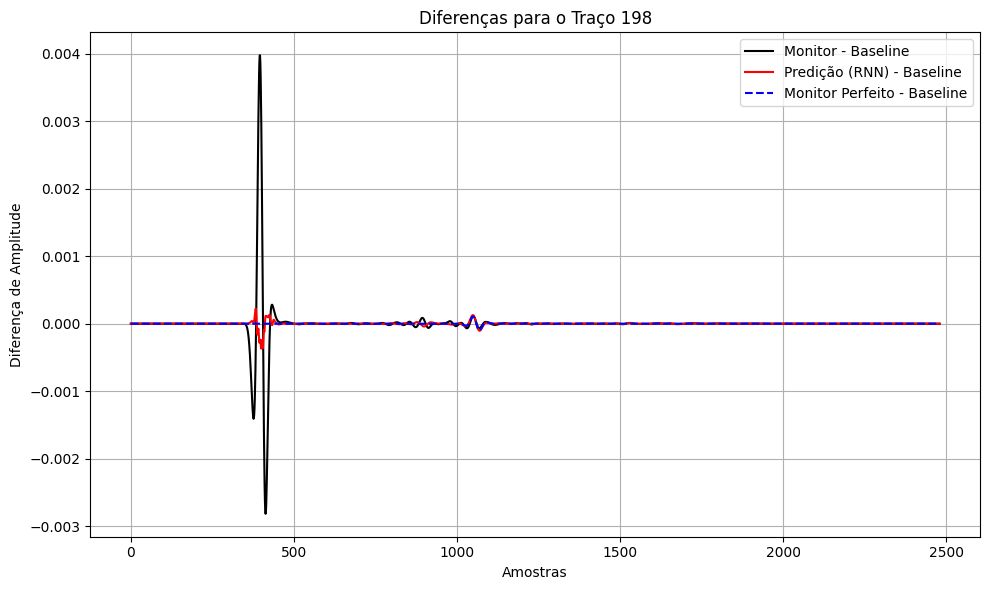

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 199:
           full   arrival  deep  reserv
baseline:  0.43       0.0  9.27    9.74
monitor:  13.64     13.65  9.21    8.61
matched:   0.64      0.61  3.9    3.6


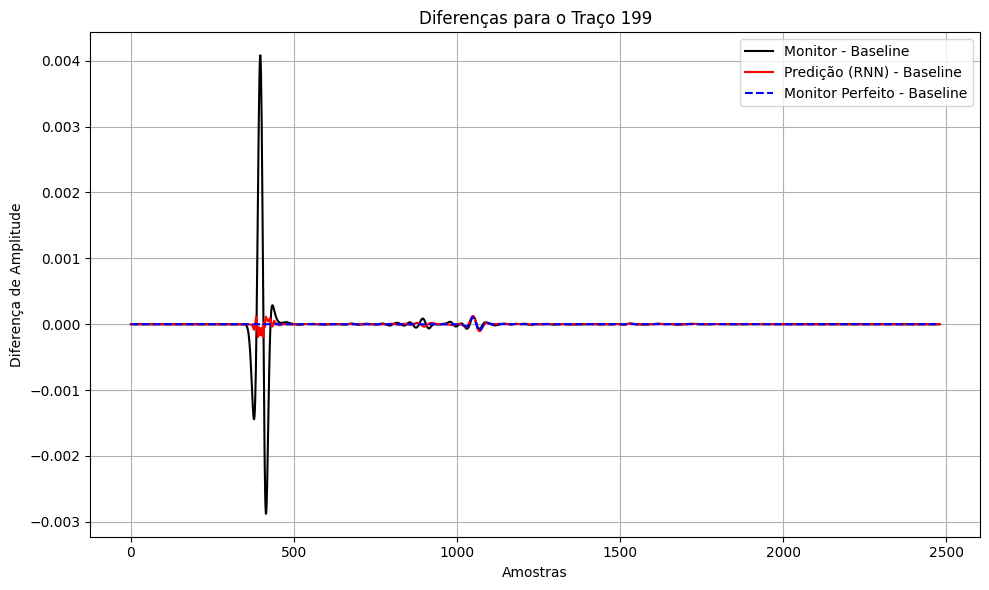

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.58      0.55  4.02    3.74


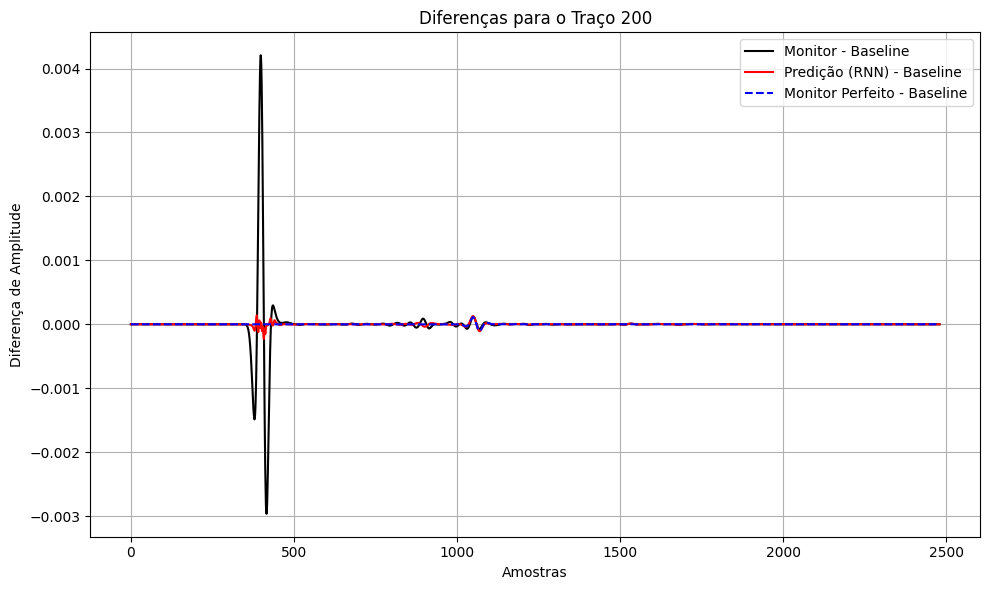

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 201:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.61    10.03
monitor:  14.41     14.42  9.33    8.74
matched:   0.71      0.69  3.59    3.3


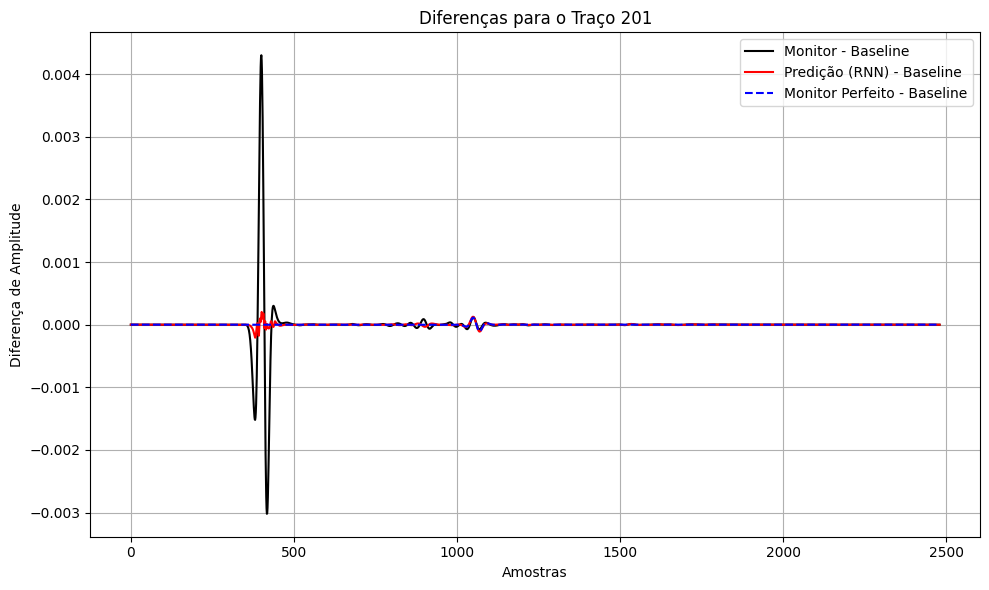

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 202:
           full   arrival  deep  reserv
baseline:  0.45       0.0  9.77    10.19
monitor:  14.8     14.81  9.39    8.83
matched:   0.95      0.94  3.66    3.4


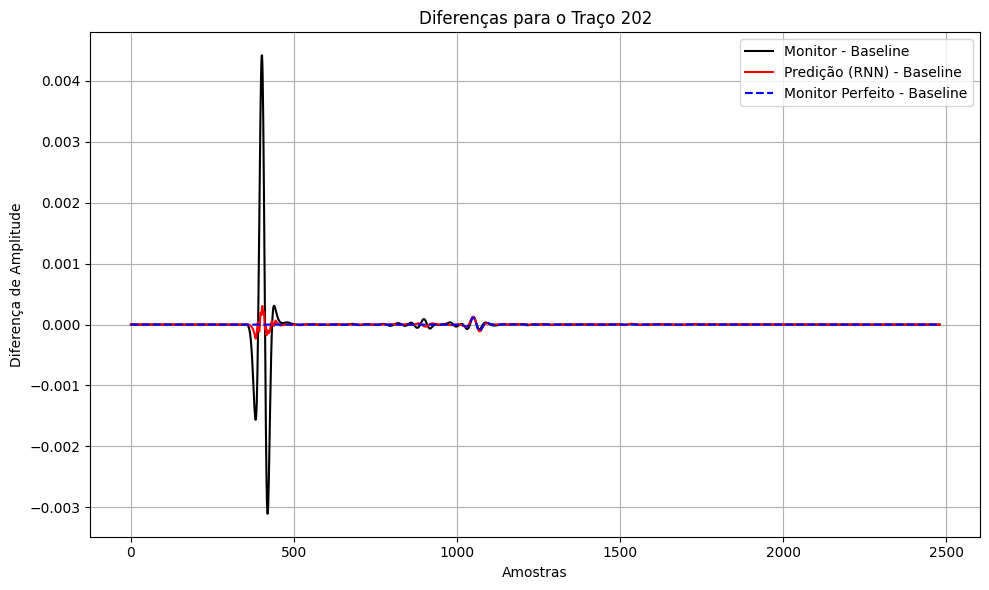

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 203:
           full   arrival  deep  reserv
baseline:  0.46       0.0  9.92    10.35
monitor:  15.19     15.2  9.44    8.94
matched:   1.52      1.51  3.24    2.97


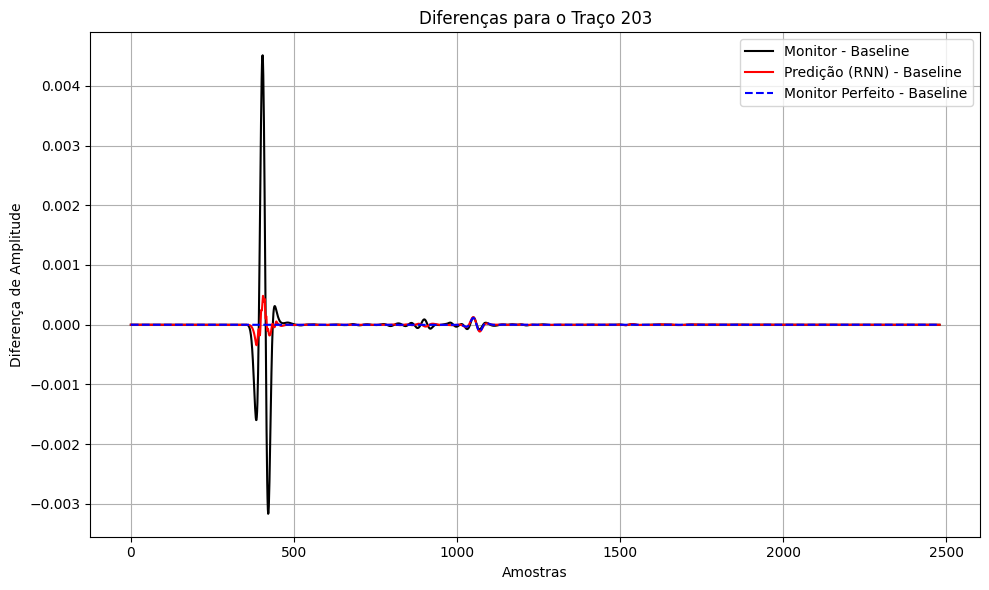

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 204:
           full   arrival  deep  reserv
baseline:  0.47       0.0  10.07    10.51
monitor:  15.57     15.58  9.5    9.06
matched:   1.81      1.81  3.26    3.01


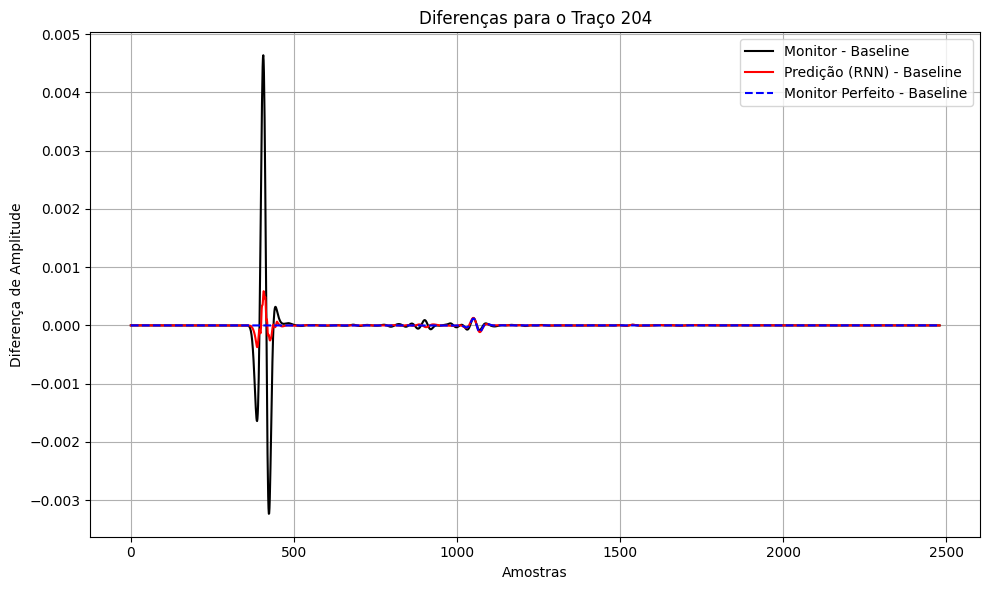

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 205:
           full   arrival  deep  reserv
baseline:  0.47       0.0  10.2    10.66
monitor:  15.96     15.98  9.57    9.19
matched:   2.47      2.46  2.88    2.6


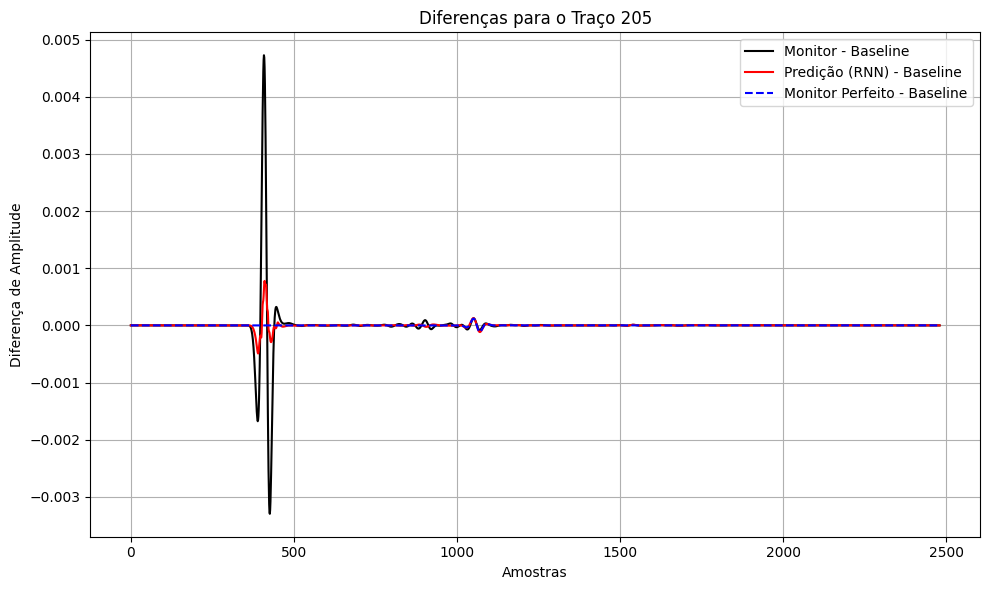

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 206:
           full   arrival  deep  reserv
baseline:  0.48       0.0  10.32    10.8
monitor:  16.35     16.36  9.64    9.32
matched:   2.79      2.79  2.86    2.59


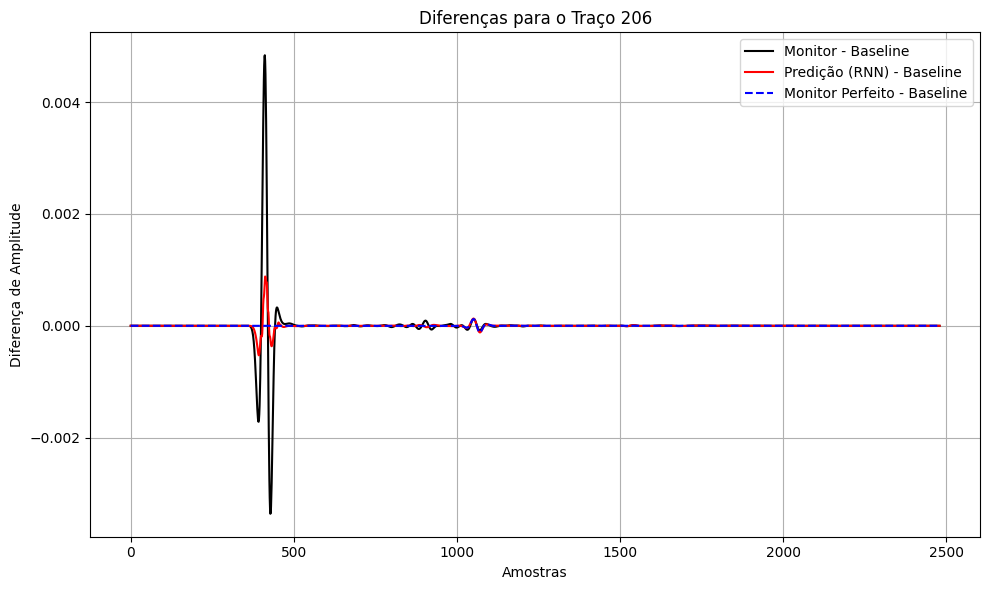

78/78 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
Traço 207:
           full   arrival  deep  reserv
baseline:  0.48       0.0  10.43    10.93
monitor:  16.74     16.75  9.71    9.44
matched:   3.48      3.48  2.57    2.26


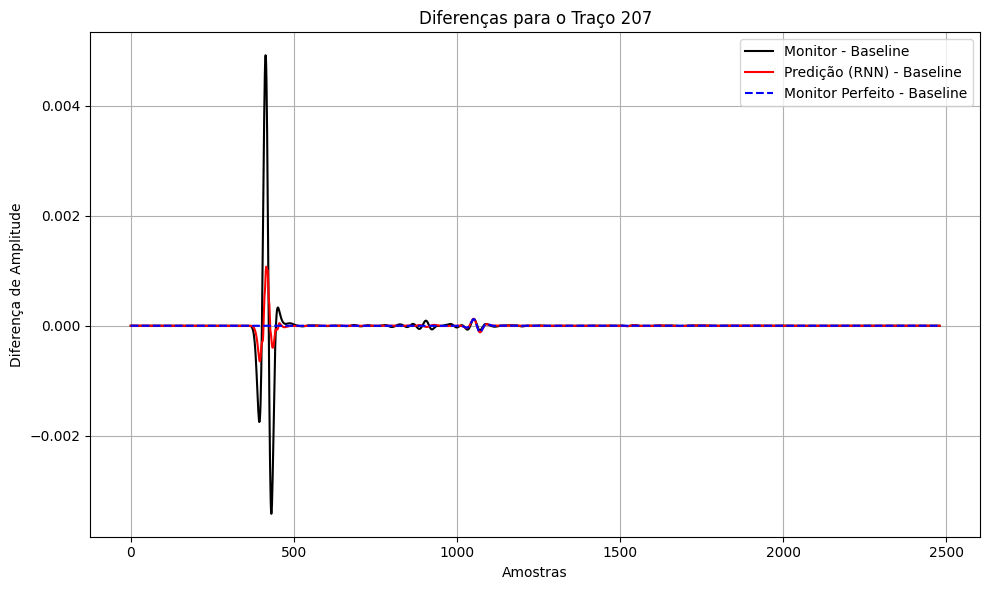

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 208:
           full   arrival  deep  reserv
baseline:  0.49       0.0  10.53    11.04
monitor:  17.11     17.13  9.79    9.54
matched:   3.83      3.83  2.54    2.22


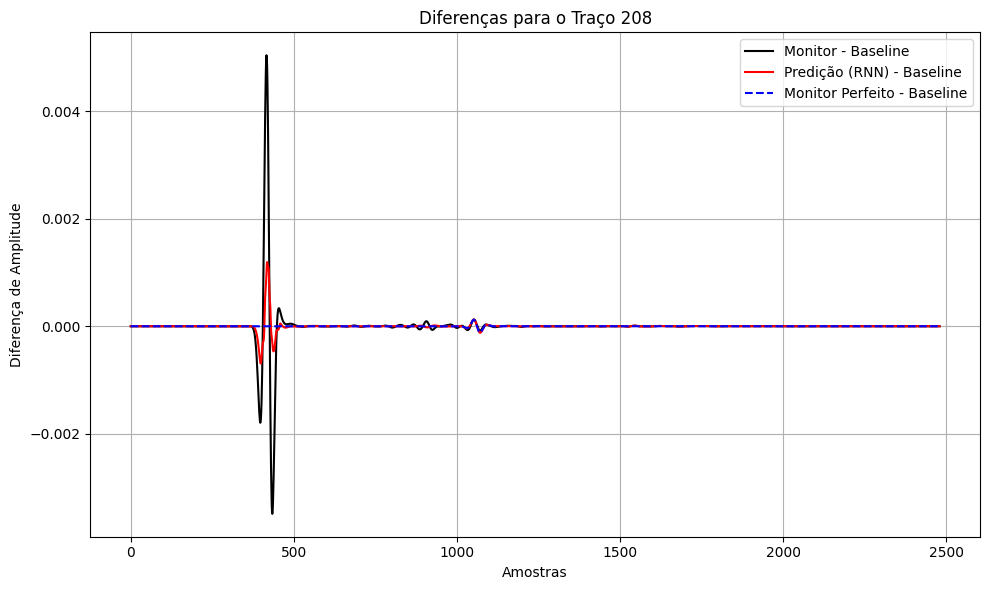

In [ ]:
# Inferência dos 17 traços com o treino no traço 200
traces_to_process_three = [192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208]
test_all_three_traces(traces_to_process_three, model, history, scaler)

### bs = 256 , ep = 700 **BOM**

In [ ]:
bs = 256
ep = 700

moni_win, base_amp, model, history, scaler = train_one(traces_to_process, ep, bs)

trace_monitor (antes da norm) = 2500
trace_baseline (antes da norm) = 2500
trace_monitor (depois da norm) = 2500
trace_baseline (depois da norm) = 2500
Tam de moni_win (antes) = 780
Tam de base_amp (antes) = 780
Tam de moni_win (depois) = (780, 20, 1)
Tam de base_amp (depois) = (780, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gru_5 (GRU)                          │ (None, 50)                  │           7,950 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,001 (31.25 KB)

 Trainable params: 8,001 (31.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/700
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 207ms/step - loss: 2.7694 - mean_absolute_error: 0.4965 - mean_squared_error: 2.7694 - val_loss: 0.0014 - val_mean_absolute_error: 0.0346 - val_mean_squared_error: 0.0014
Epoch 2/700
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 2.6423 - mean_absolute_error: 0.4874 - mean_squared_error: 2.6423 - val_loss: 0.0018 - val_mean_absolute_error: 0.0411 - val_mean_squared_error: 0.0018
Epoch 3/700
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 2.1741 - mean_absolute_error: 0.4253 - mean_squared_error: 2.1741 - val_loss: 0.0010 - val_mean_absolute_error: 0.0314 - val_mean_squared_error: 0.0010
Epoch 4/700
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 1.6669 - mean_absolute_error: 0.3580 - mean_squared_error: 1.6669 - val_loss: 5.1327e-05 - val_mean_absolute_error: 0.0061 - val_mean_squared_error: 5.1327e-05
Epoch 5/700
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 1.4563 - mean_absolute_error: 0.3274 - mean_squared_error: 1.4563 - val_loss: 9.0592e-04 - va

##### INFERÊNCIA DO TRAÇO

78/78 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.24      0.13  4.12    2.97


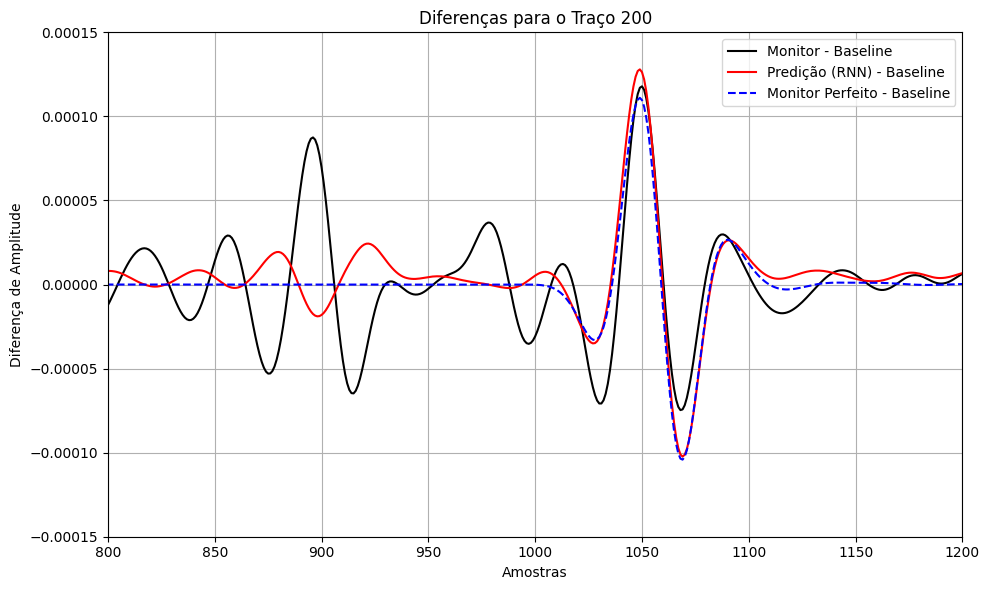

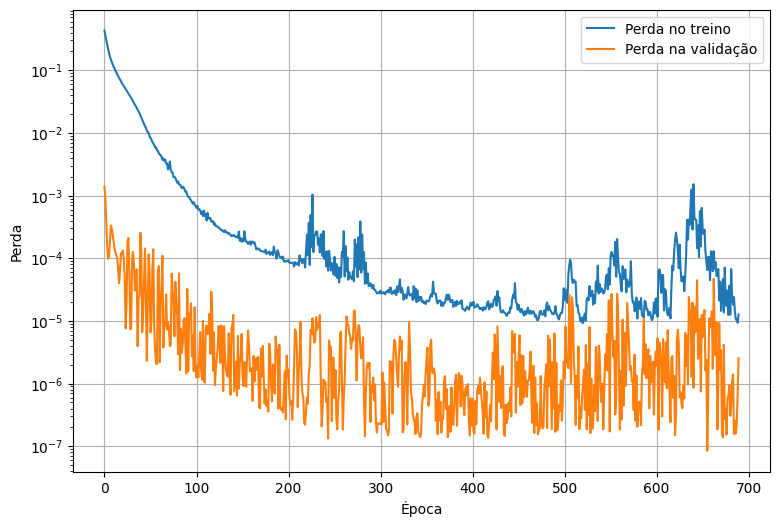

In [ ]:
test_one(traces_to_process, model, history, scaler)

##### INFERÊNCIA DO TRAÇO INTEIRO

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.24      0.13  4.12    2.97


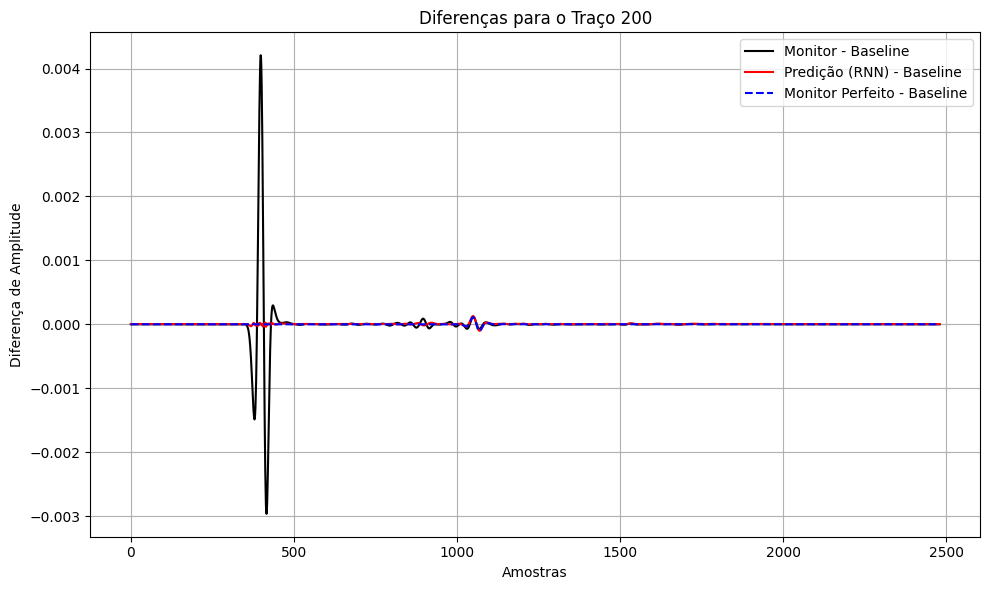

In [ ]:
test_all_all_trace(traces_to_process, model, history, scaler)

##### INFERÊNCIA DOS 17 TRAÇOS INTEIROS

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 192:
           full   arrival  deep  reserv
baseline:  0.36       0.0  7.92    8.67
monitor:  11.04     11.04  8.83    8.58
matched:   3.11      3.11  4.6    3.54


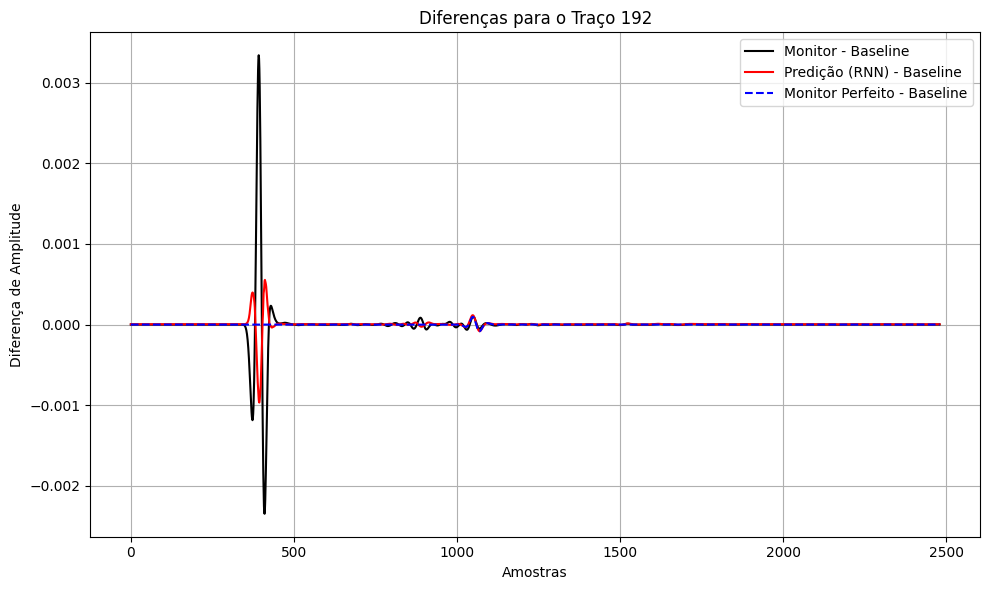

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 193:
           full   arrival  deep  reserv
baseline:  0.37       0.0  8.14    8.87
monitor:  11.4     11.4  8.88    8.59
matched:   2.67      2.66  4.41    3.29


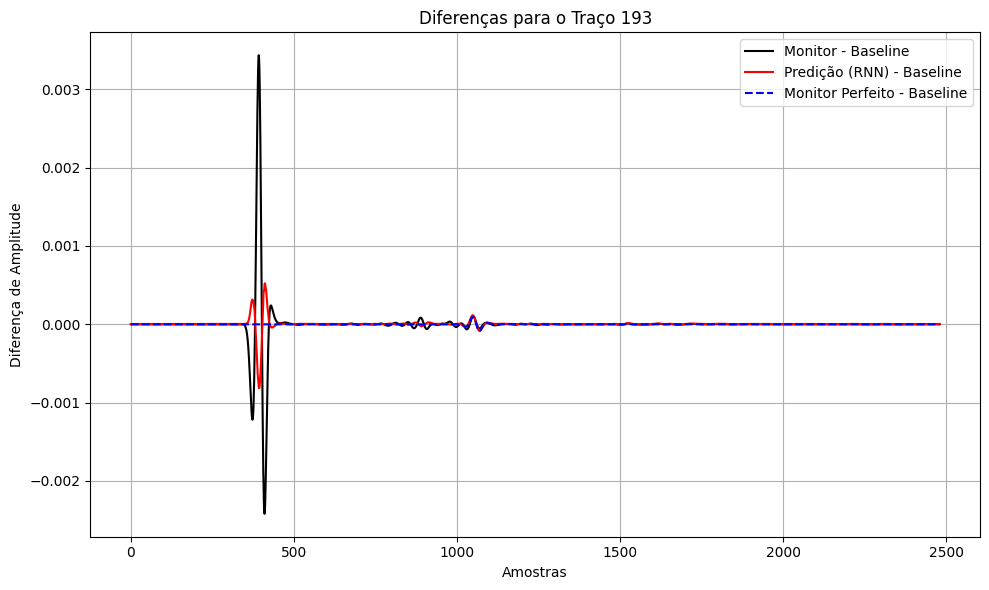

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 194:
           full   arrival  deep  reserv
baseline:  0.38       0.0  8.36    9.05
monitor:  11.76     11.77  8.93    8.59
matched:   2.42      2.41  4.57    3.47


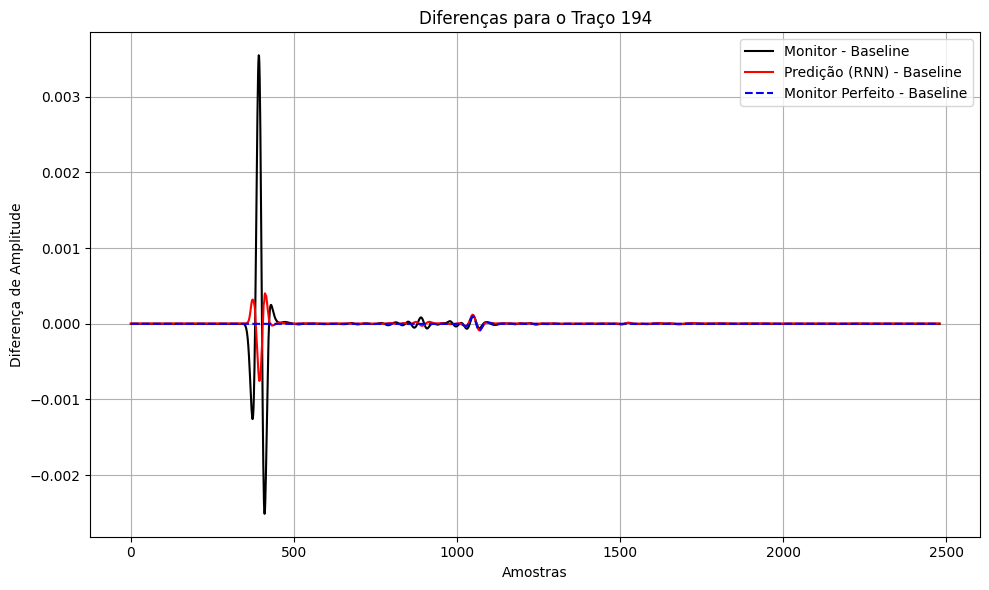

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 195:
           full   arrival  deep  reserv
baseline:  0.39       0.0  8.56    9.21
monitor:  12.13     12.13  8.99    8.57
matched:   1.93      1.92  4.36    3.2


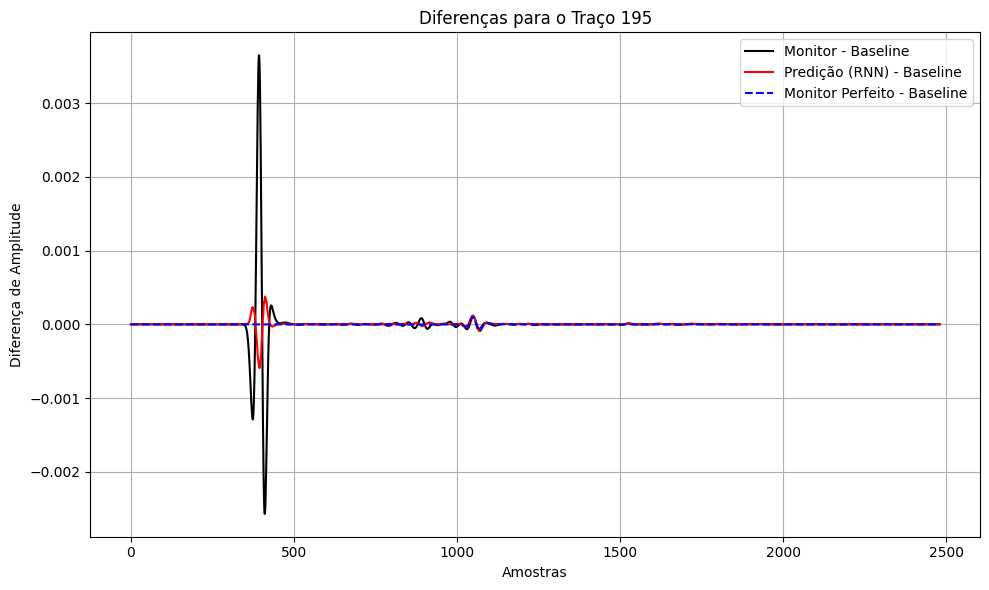

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 196:
           full   arrival  deep  reserv
baseline:  0.4       0.0  8.75    9.35
monitor:  12.5     12.51  9.04    8.55
matched:   1.67      1.66  4.47    3.34


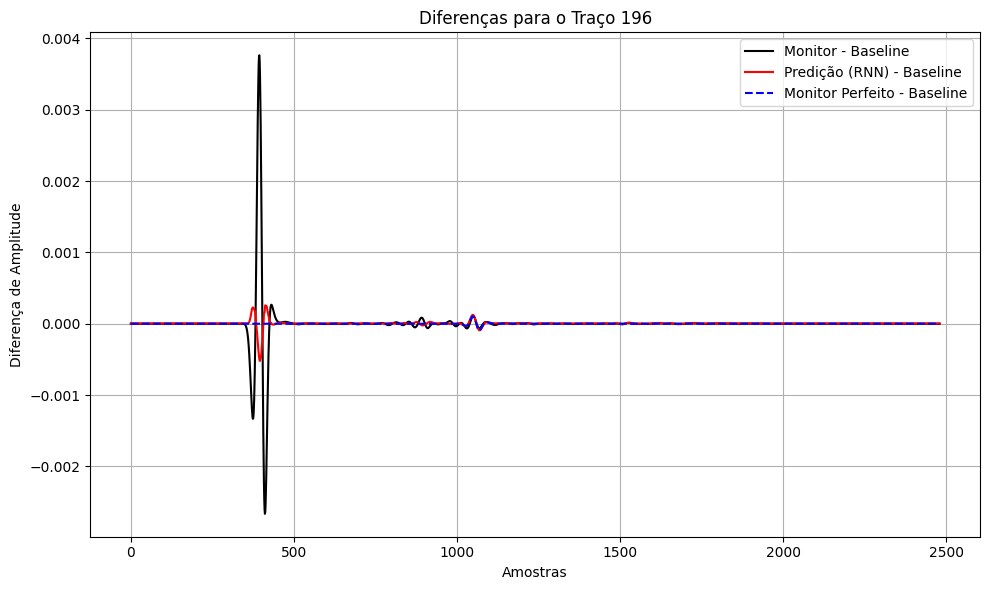

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 197:
           full   arrival  deep  reserv
baseline:  0.41       0.0  8.93    9.48
monitor:  12.88     12.89  9.1    8.55
matched:   1.17      1.15  4.24    3.05


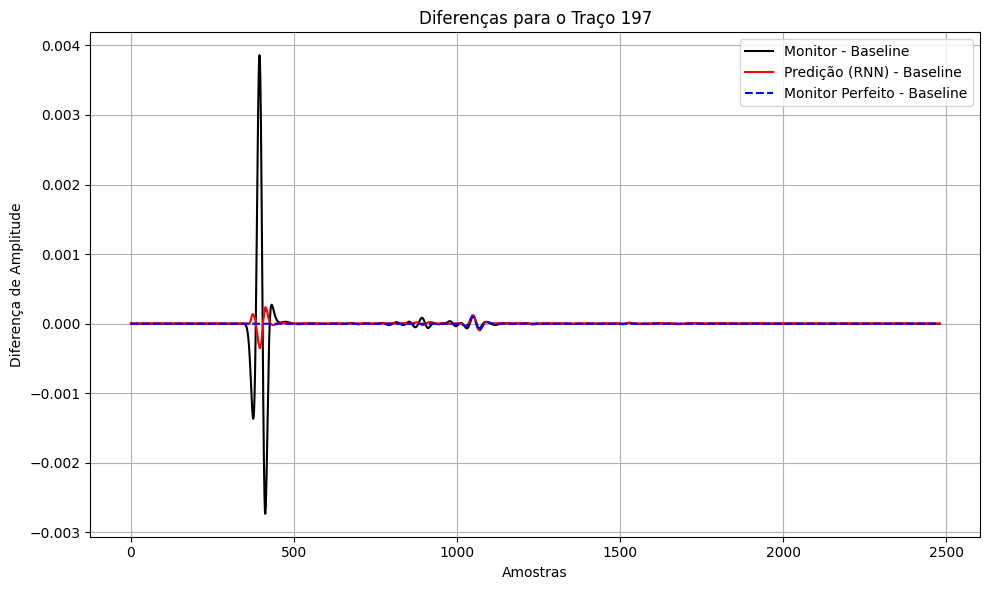

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 198:
           full   arrival  deep  reserv
baseline:  0.42       0.0  9.1    9.61
monitor:  13.26     13.26  9.15    8.57
matched:   0.89      0.86  4.31    3.16


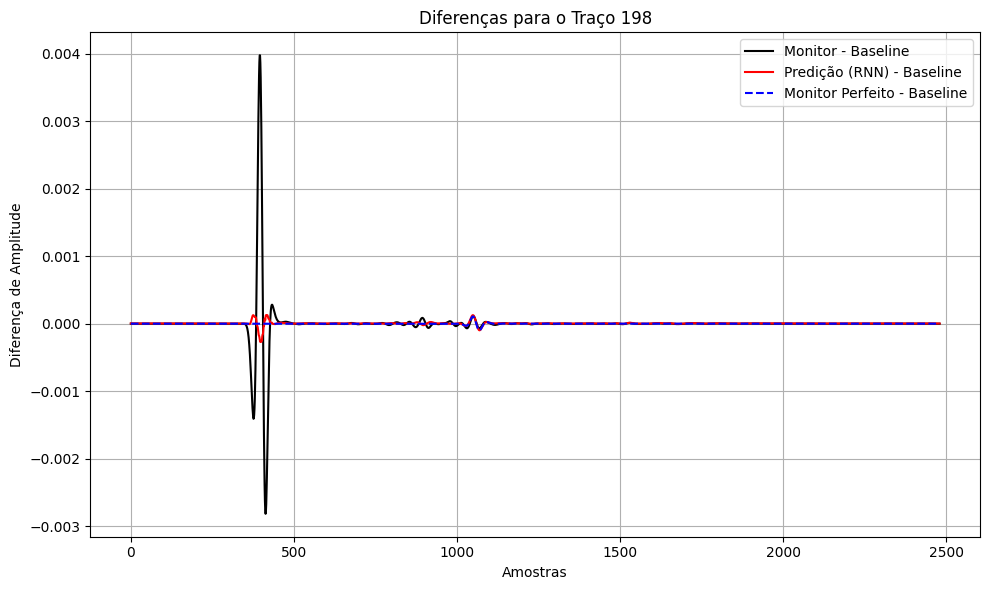

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 199:
           full   arrival  deep  reserv
baseline:  0.43       0.0  9.27    9.74
monitor:  13.64     13.65  9.21    8.61
matched:   0.47      0.42  4.09    2.89


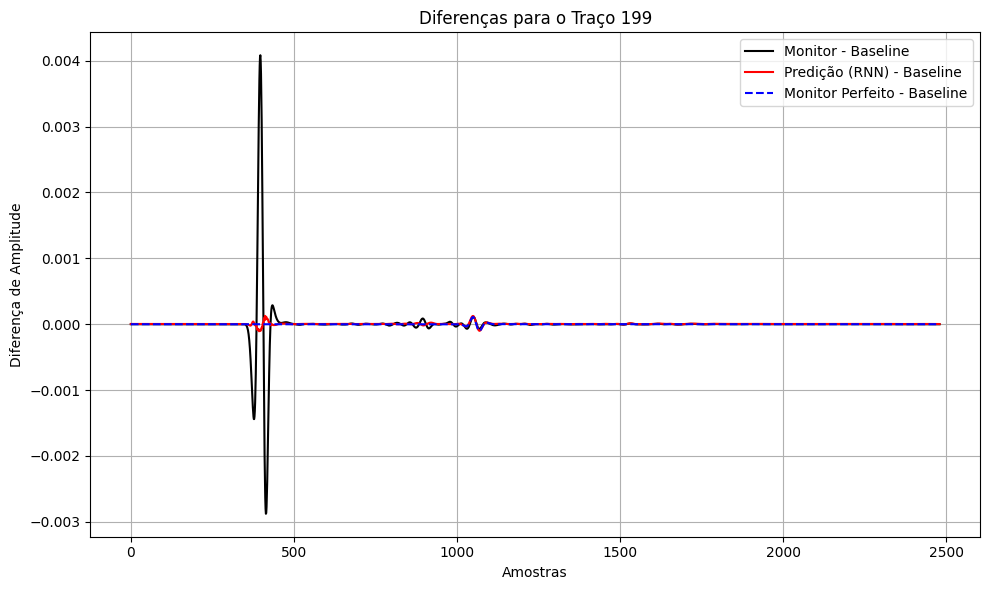

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.24      0.13  4.12    2.97


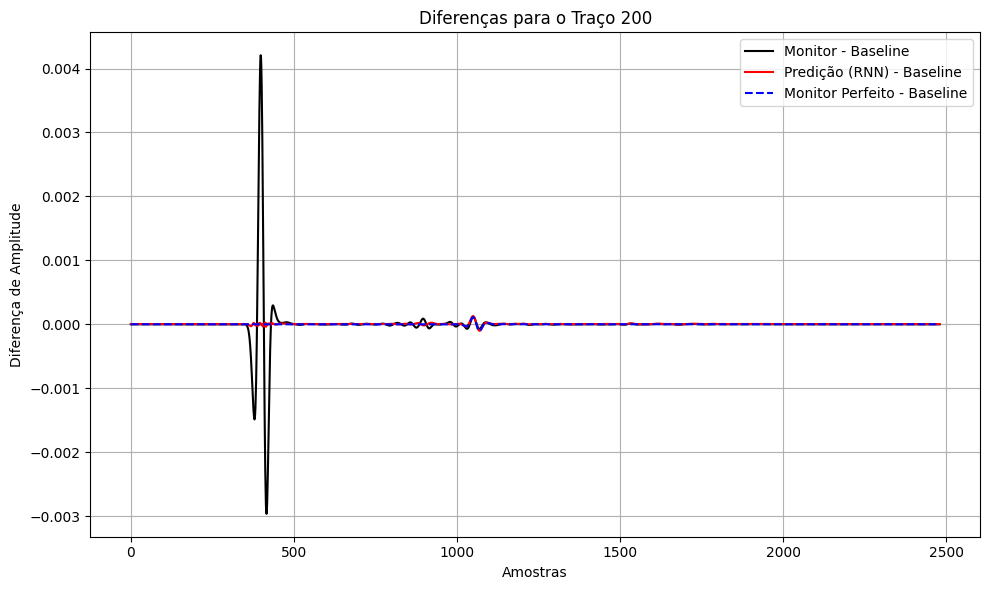

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 201:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.61    10.03
monitor:  14.41     14.42  9.33    8.74
matched:   0.73      0.71  3.93    2.72


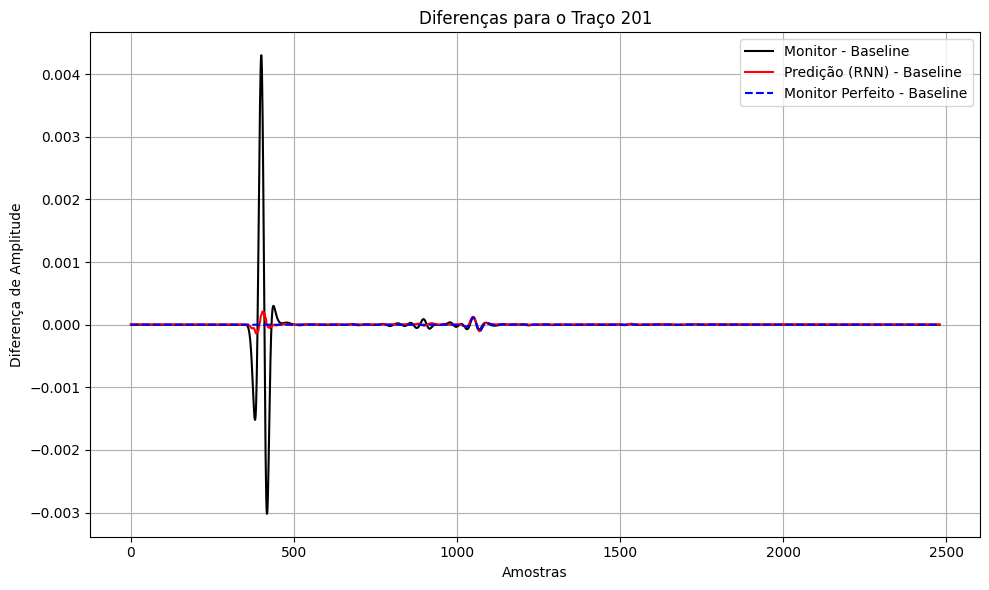

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 202:
           full   arrival  deep  reserv
baseline:  0.45       0.0  9.77    10.19
monitor:  14.8     14.81  9.39    8.83
matched:   0.93      0.92  3.93    2.76


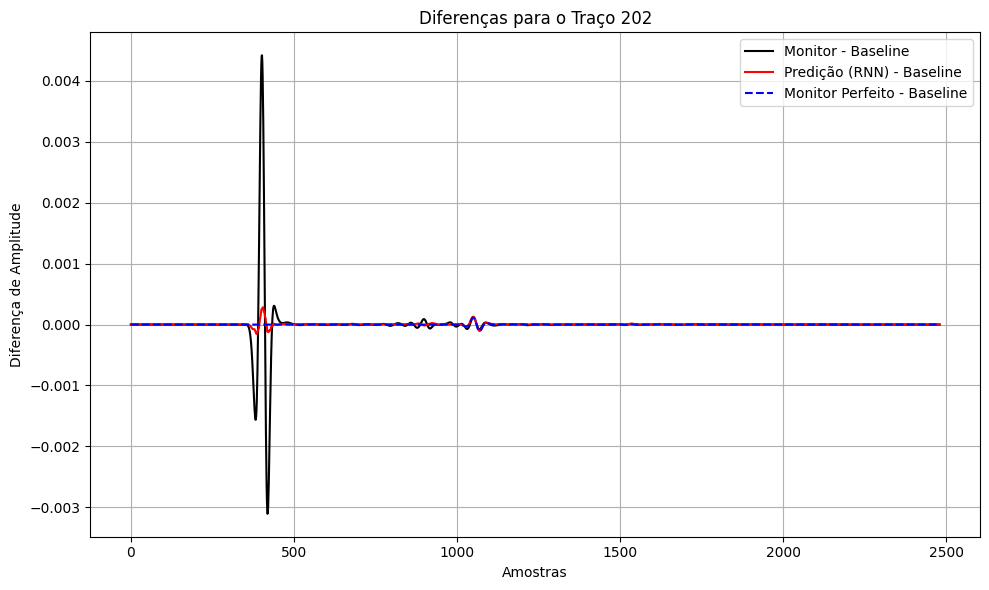

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 203:
           full   arrival  deep  reserv
baseline:  0.46       0.0  9.92    10.35
monitor:  15.19     15.2  9.44    8.94
matched:   1.61      1.6  3.79    2.56


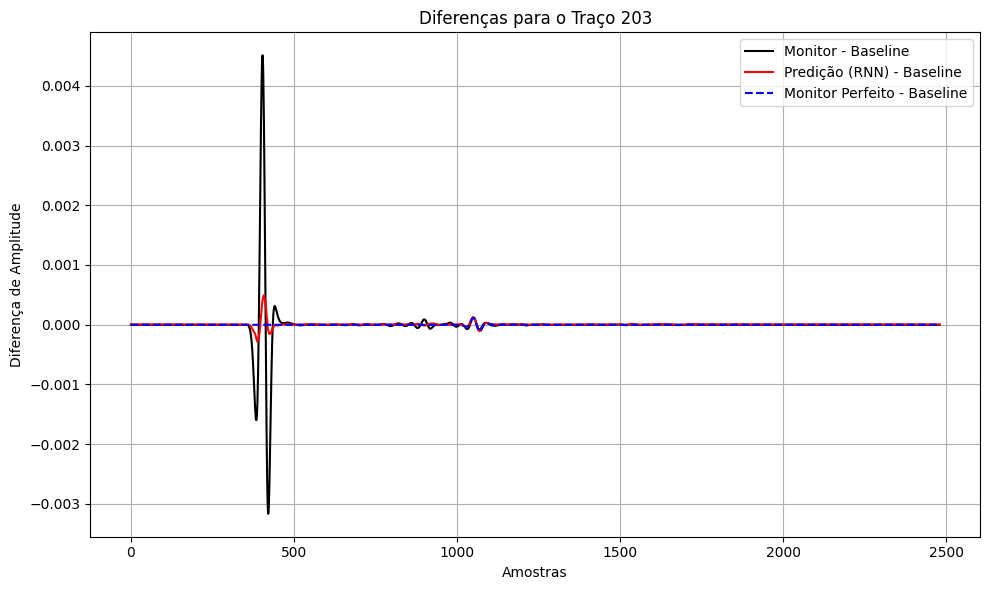

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 204:
           full   arrival  deep  reserv
baseline:  0.47       0.0  10.07    10.51
monitor:  15.57     15.58  9.5    9.06
matched:   1.88      1.87  3.77    2.56


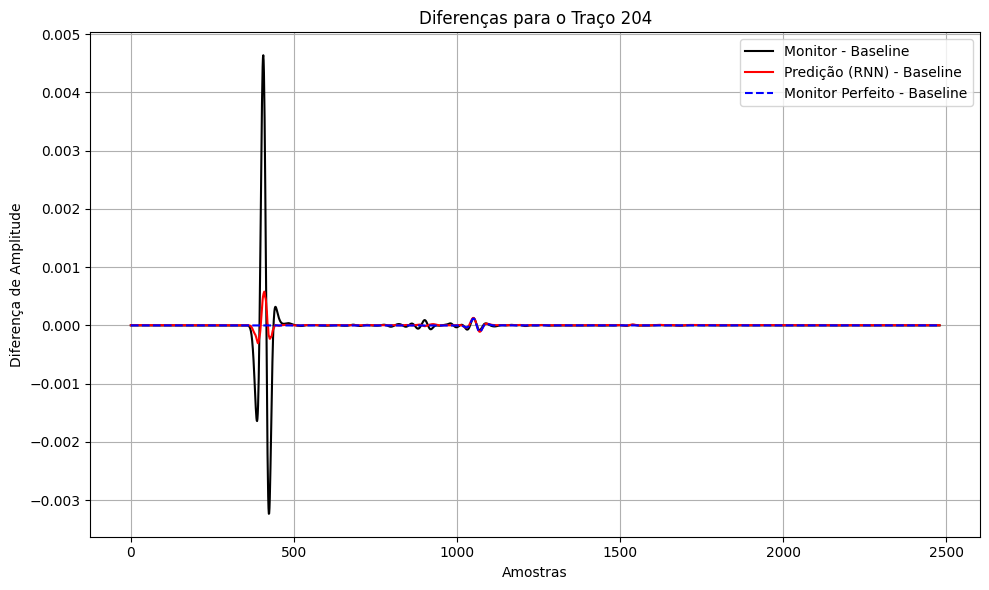

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 205:
           full   arrival  deep  reserv
baseline:  0.47       0.0  10.2    10.66
monitor:  15.96     15.98  9.57    9.19
matched:   2.58      2.57  3.7    2.46


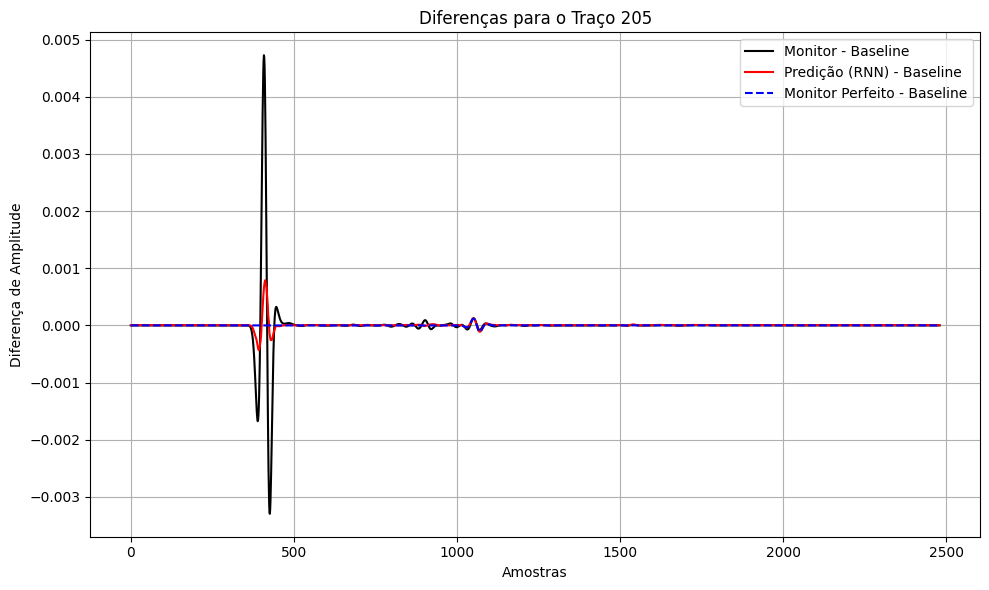

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Traço 206:
           full   arrival  deep  reserv
baseline:  0.48       0.0  10.32    10.8
monitor:  16.35     16.36  9.64    9.32
matched:   2.89      2.88  3.67    2.43


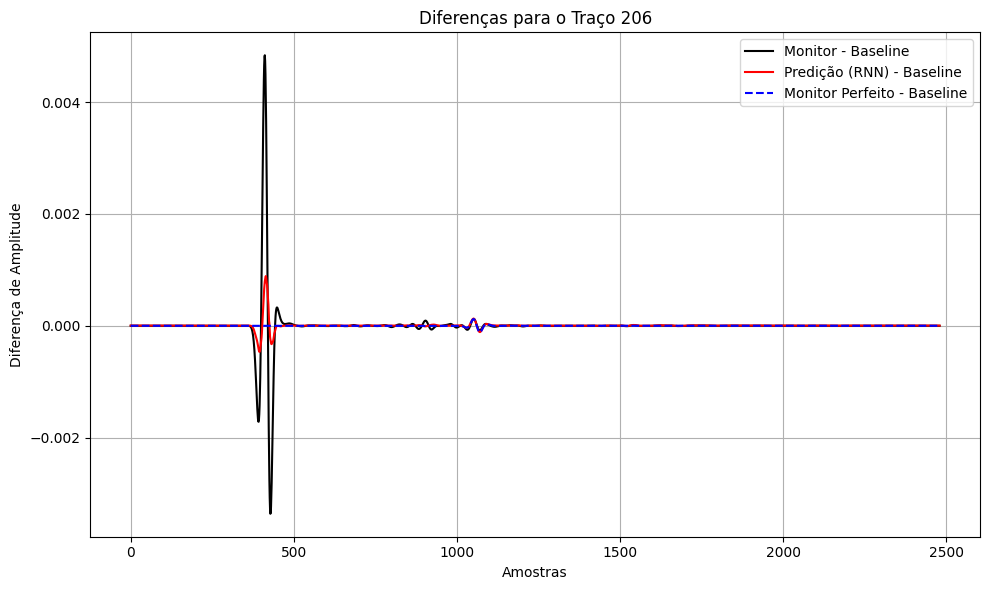

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 207:
           full   arrival  deep  reserv
baseline:  0.48       0.0  10.43    10.93
monitor:  16.74     16.75  9.71    9.44
matched:   3.6      3.6  3.71    2.46


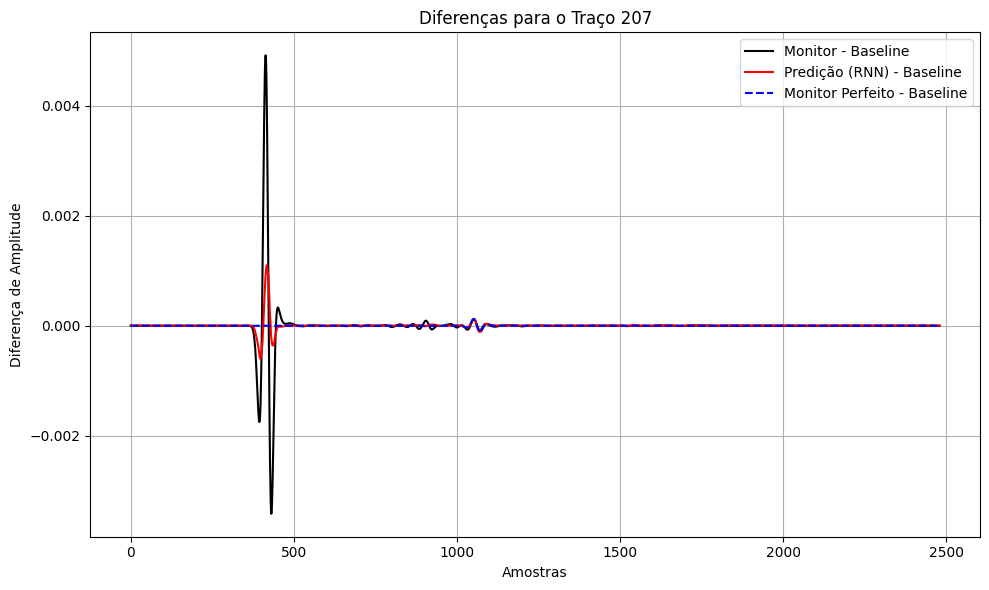

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 208:
           full   arrival  deep  reserv
baseline:  0.49       0.0  10.53    11.04
monitor:  17.11     17.13  9.79    9.54
matched:   3.94      3.94  3.69    2.45


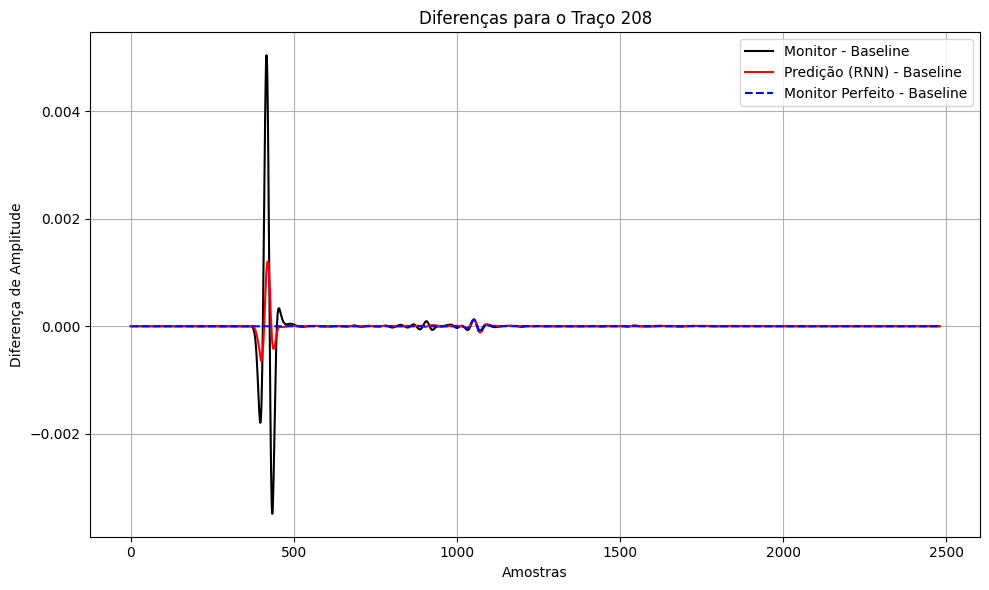

In [ ]:
# Inferência dos 17 traços com o treino no traço 200
traces_to_process_three = [192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208]
test_all_three_traces(traces_to_process_three, model, history, scaler)

### bs = 400 , ep = 300

In [ ]:
bs = 400
ep = 300

moni_win, base_amp, model, history, scaler = train_one(traces_to_process, ep, bs)

trace_monitor (antes da norm) = 2500
trace_baseline (antes da norm) = 2500
trace_monitor (depois da norm) = 2500
trace_baseline (depois da norm) = 2500
Tam de moni_win (antes) = 780
Tam de base_amp (antes) = 780
Tam de moni_win (depois) = (780, 20, 1)
Tam de base_amp (depois) = (780, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gru_6 (GRU)                          │ (None, 50)                  │           7,950 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,001 (31.25 KB)

 Trainable params: 8,001 (31.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/300
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - loss: 4.3398 - mean_absolute_error: 0.6179 - mean_squared_error: 4.3398 - val_loss: 6.5902e-04 - val_mean_absolute_error: 0.0205 - val_mean_squared_error: 6.5902e-04
Epoch 2/300
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 3.6415 - mean_absolute_error: 0.5498 - mean_squared_error: 3.6415 - val_loss: 0.0015 - val_mean_absolute_error: 0.0341 - val_mean_squared_error: 0.0015
Epoch 3/300
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 3.5320 - mean_absolute_error: 0.5563 - mean_squared_error: 3.5320 - val_loss: 0.0026 - val_mean_absolute_error: 0.0485 - val_mean_squared_error: 0.0026
Epoch 4/300
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 2.8609 - mean_absolute_error: 0.5043 - mean_squared_error: 2.8609 - val_loss: 0.0042 - val_mean_absolute_error: 0.0633 - val_mean_squared_error: 0.0042
Epoch 5/300
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 2.5542 - mean_absolute_error: 0.4838 - mean_squared_error: 2.5542 - val_loss: 0.0048 - val_m

##### INFERÊNCIA DO TRAÇO

78/78 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.48      0.46  3.5    2.99


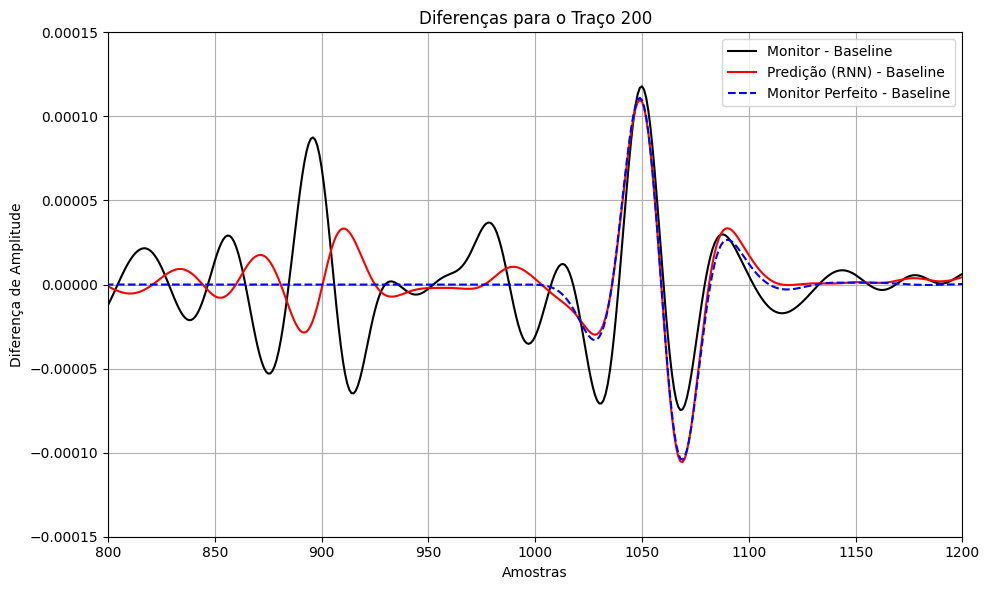

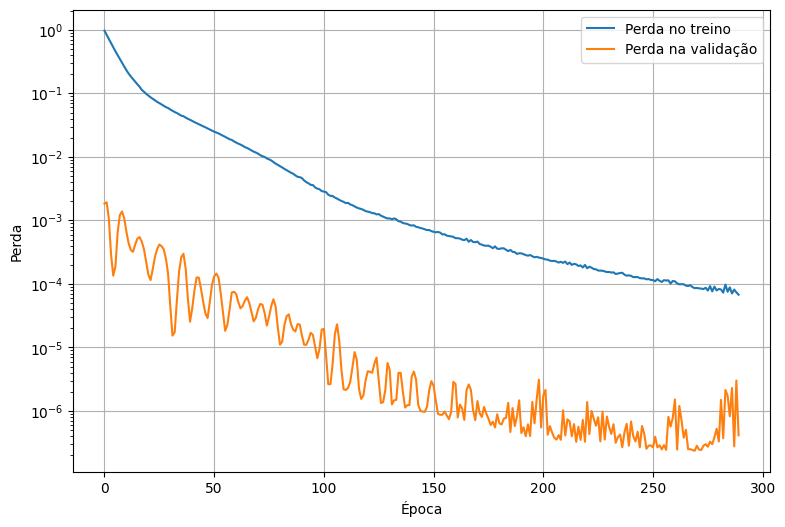

In [ ]:
test_one(traces_to_process, model, history, scaler)

##### INFERÊNCIA DO TRAÇO INTEIRO

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.48      0.46  3.5    2.99


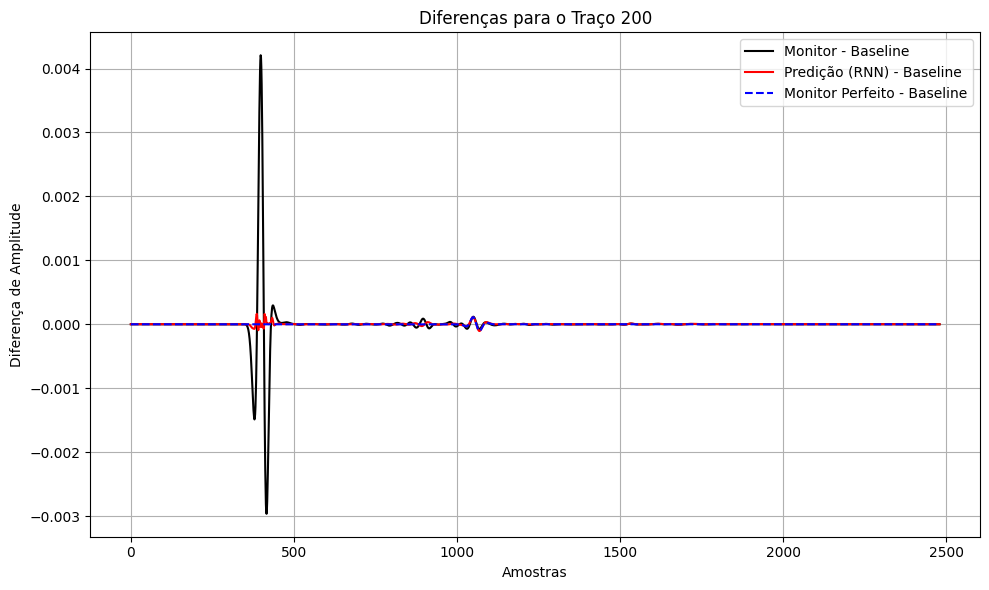

In [ ]:
test_all_all_trace(traces_to_process, model, history, scaler)

##### INFERÊNCIA DOS 17 TRAÇOS INTEIROS

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 192:
           full   arrival  deep  reserv
baseline:  0.36       0.0  7.92    8.67
monitor:  11.04     11.04  8.83    8.58
matched:   3.21      3.21  3.39    2.9


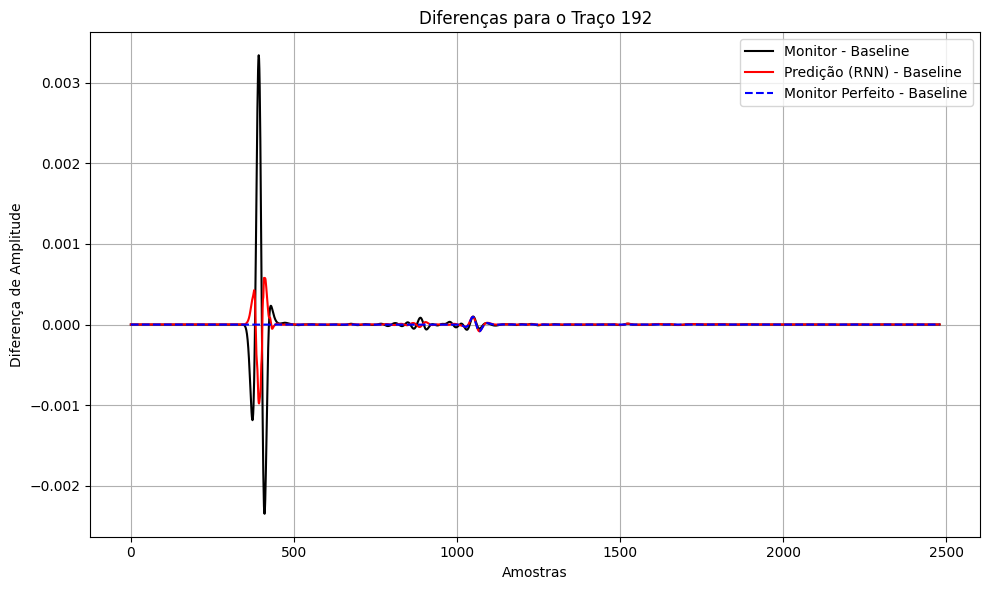

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 193:
           full   arrival  deep  reserv
baseline:  0.37       0.0  8.14    8.87
monitor:  11.4     11.4  8.88    8.59
matched:   2.78      2.78  3.51    3.06


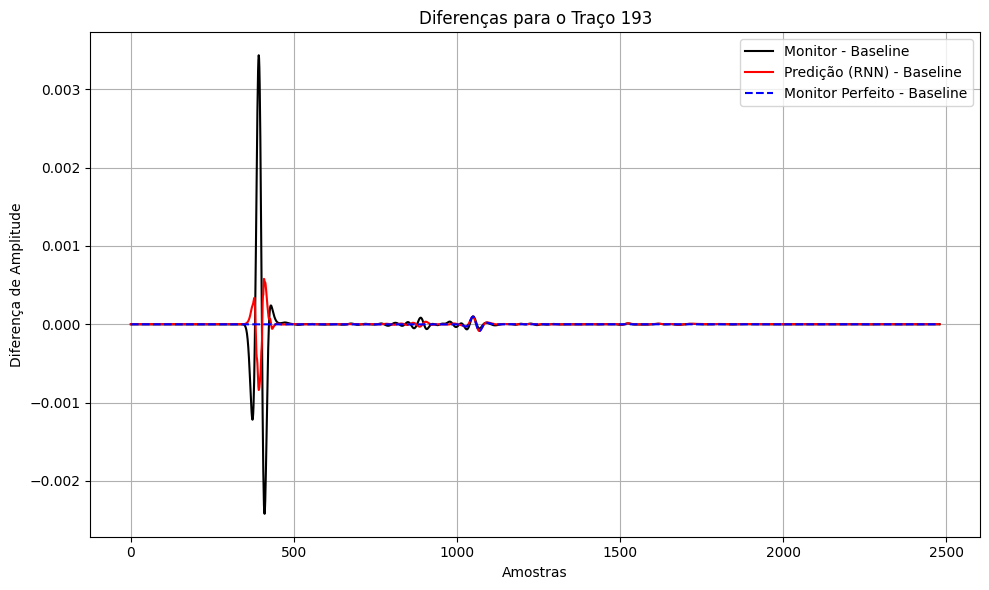

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 194:
           full   arrival  deep  reserv
baseline:  0.38       0.0  8.36    9.05
monitor:  11.76     11.77  8.93    8.59
matched:   2.51      2.51  3.35    2.86


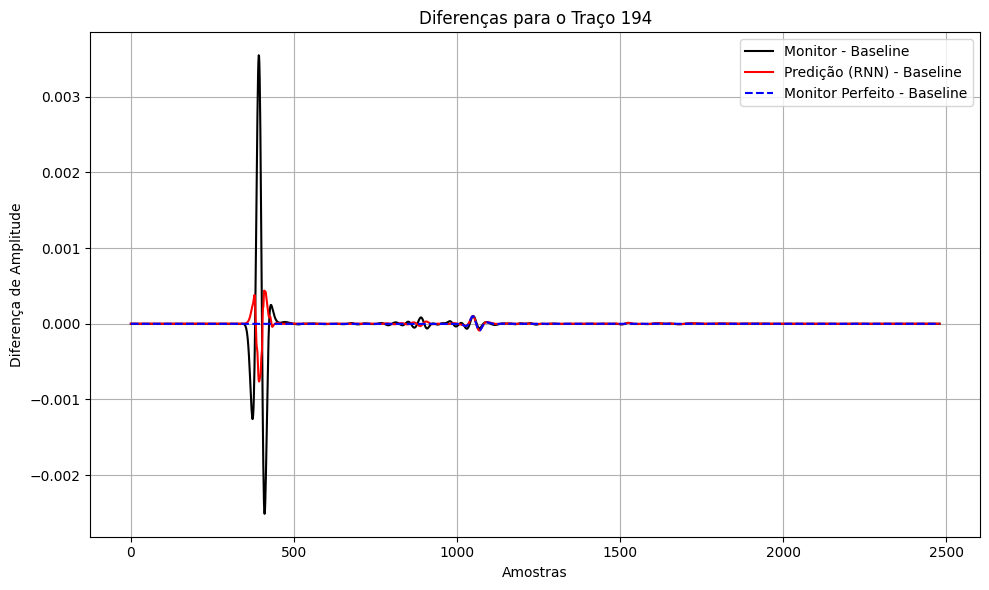

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 195:
           full   arrival  deep  reserv
baseline:  0.39       0.0  8.56    9.21
monitor:  12.13     12.13  8.99    8.57
matched:   2.05      2.05  3.52    3.06


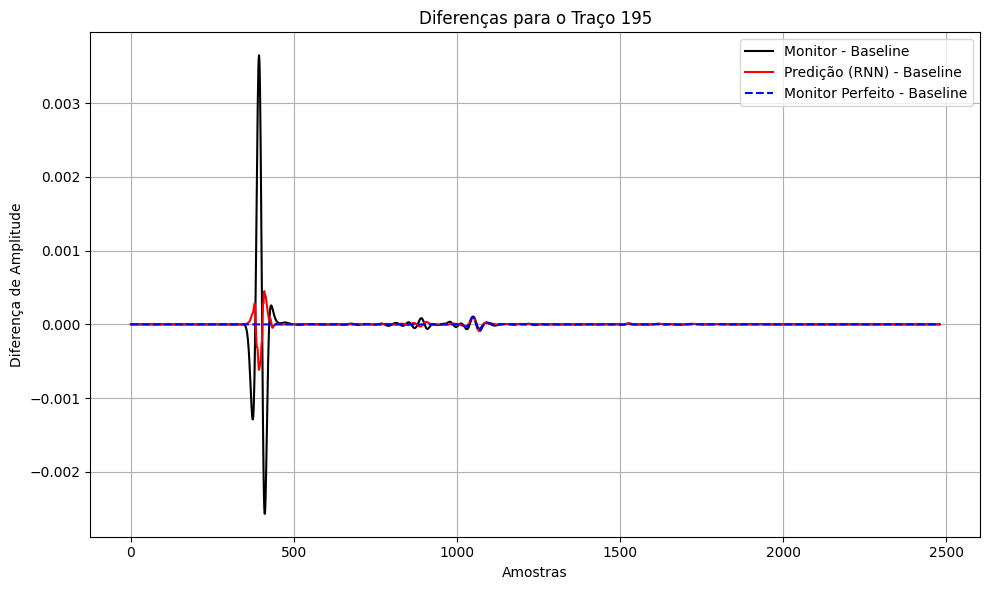

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 196:
           full   arrival  deep  reserv
baseline:  0.4       0.0  8.75    9.35
monitor:  12.5     12.51  9.04    8.55
matched:   1.78      1.77  3.38    2.86


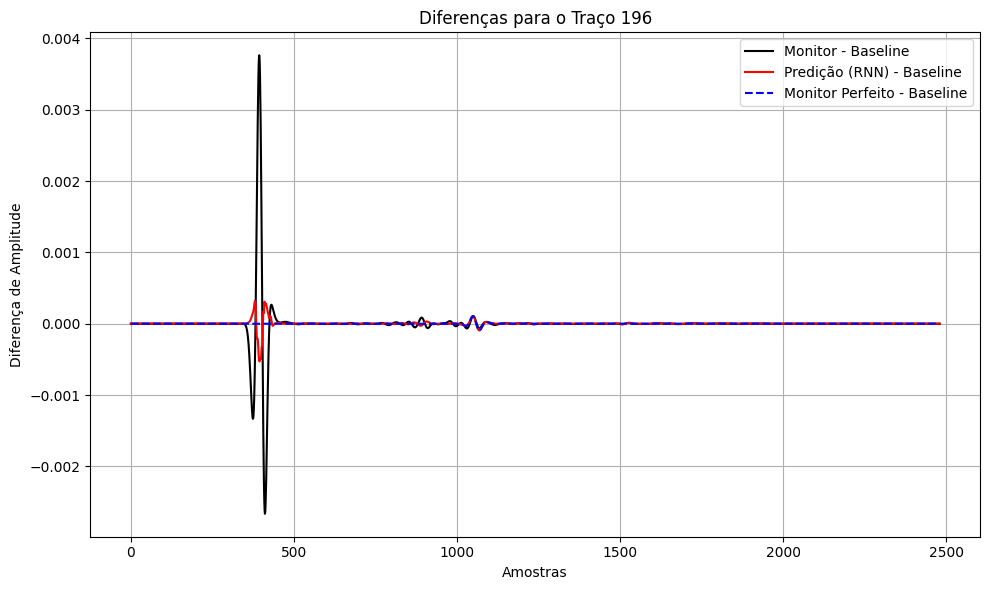

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 197:
           full   arrival  deep  reserv
baseline:  0.41       0.0  8.93    9.48
monitor:  12.88     12.89  9.1    8.55
matched:   1.32      1.31  3.58    3.09


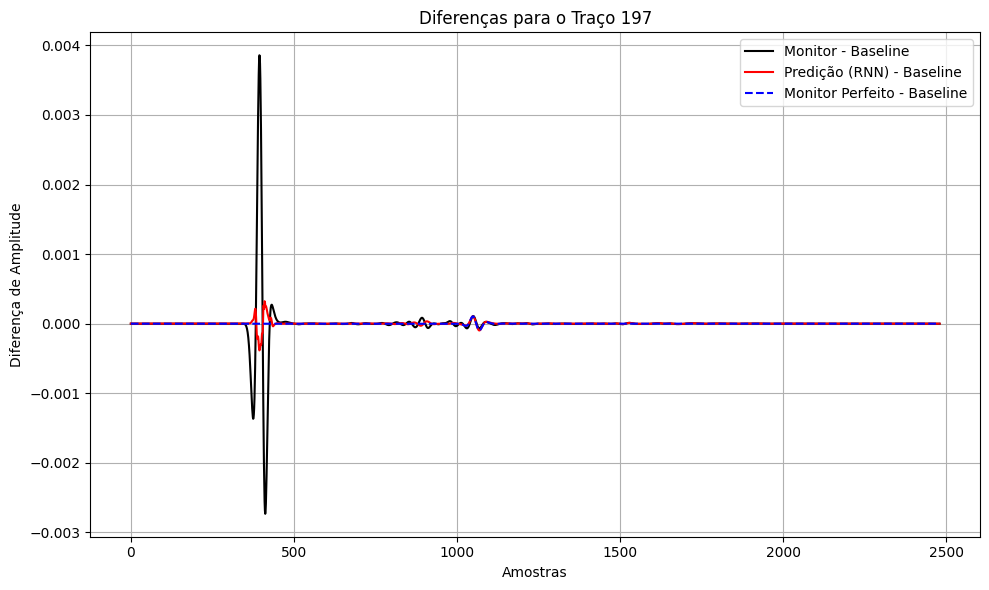

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 198:
           full   arrival  deep  reserv
baseline:  0.42       0.0  9.1    9.61
monitor:  13.26     13.26  9.15    8.57
matched:   1.03      1.02  3.42    2.89


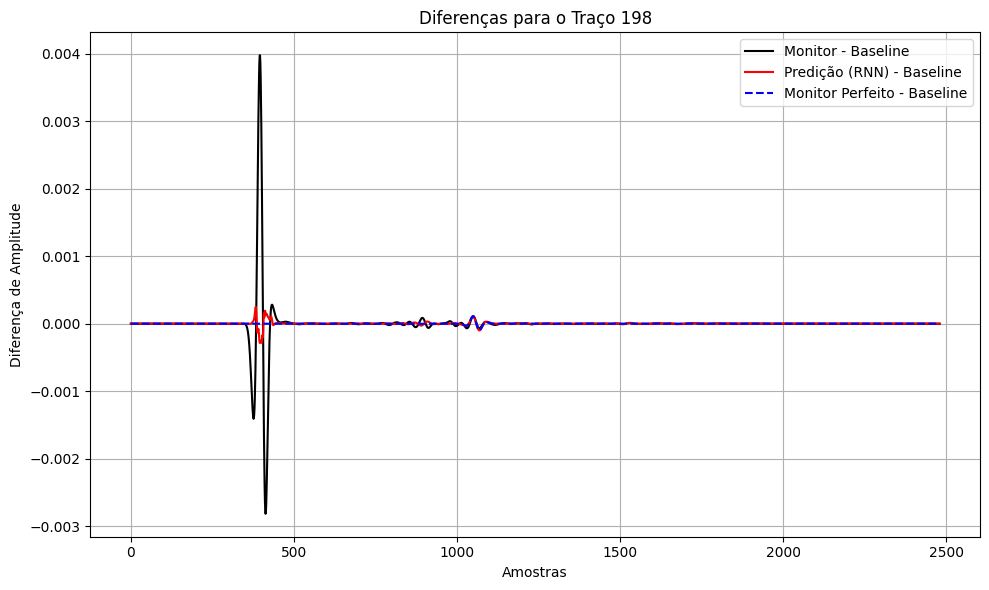

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 199:
           full   arrival  deep  reserv
baseline:  0.43       0.0  9.27    9.74
monitor:  13.64     13.65  9.21    8.61
matched:   0.7      0.68  3.66    3.17


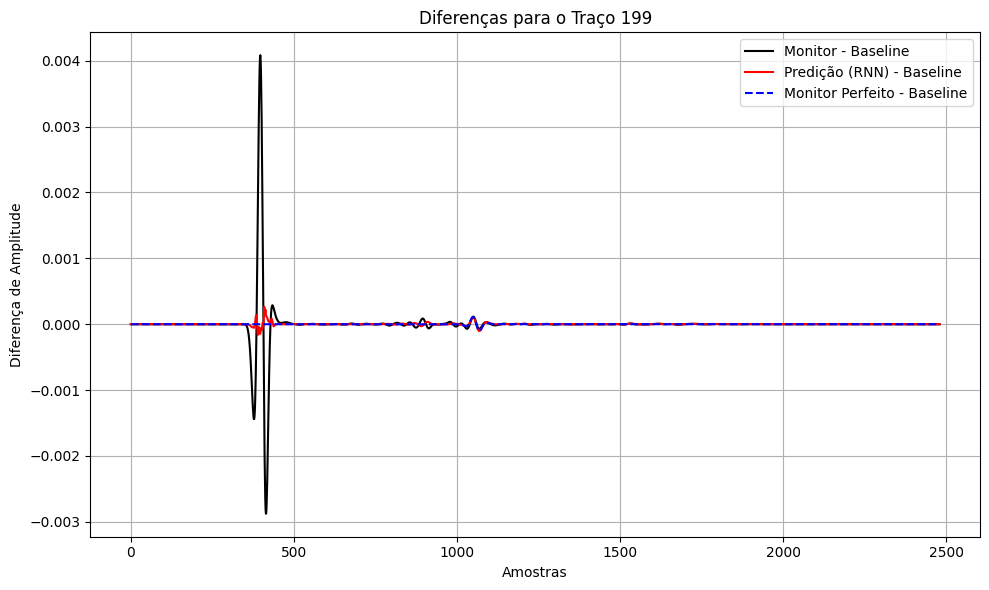

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.48      0.46  3.5    2.99


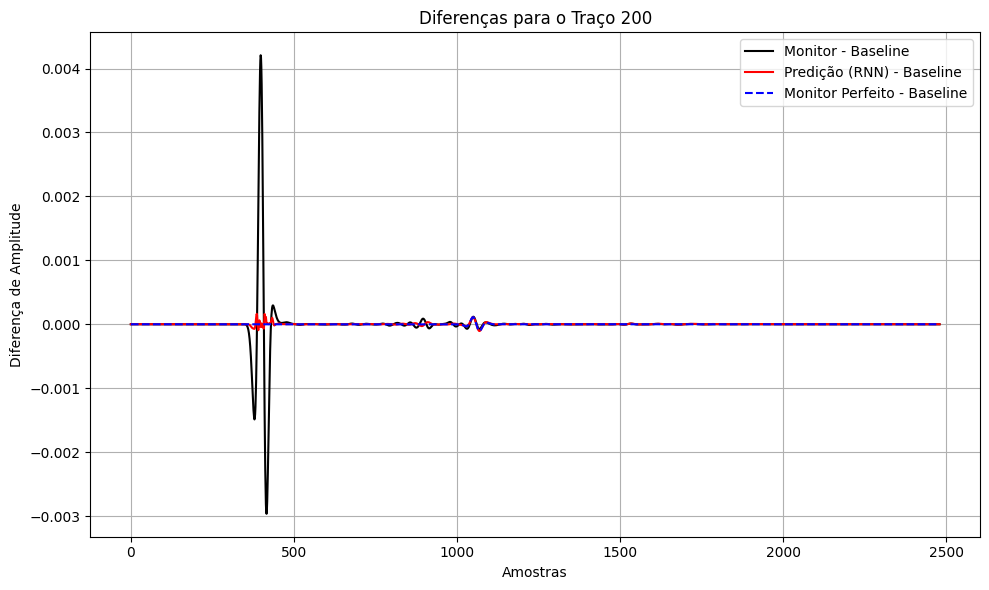

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 201:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.61    10.03
monitor:  14.41     14.42  9.33    8.74
matched:   0.85      0.83  3.8    3.33


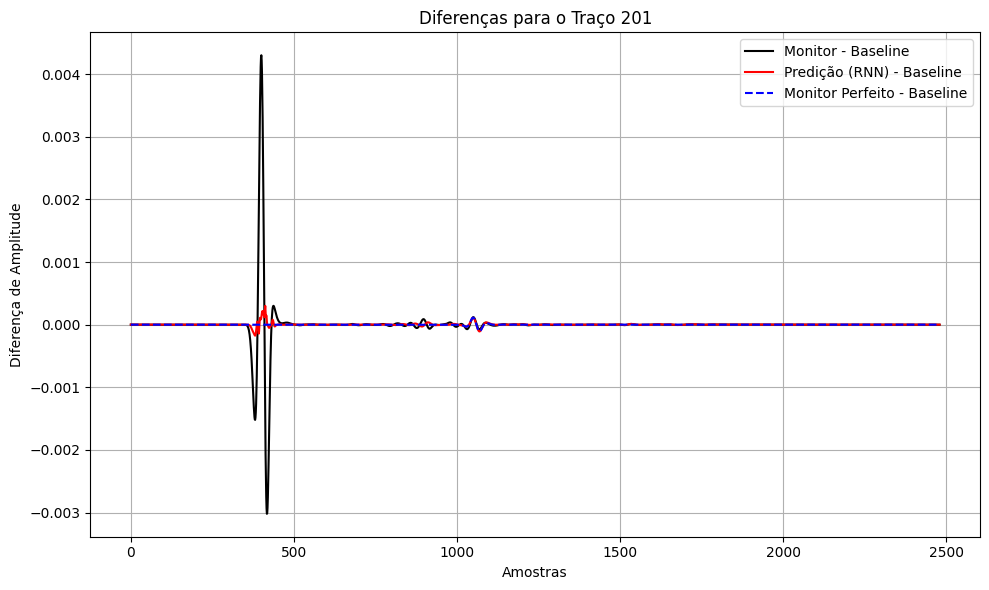

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 202:
           full   arrival  deep  reserv
baseline:  0.45       0.0  9.77    10.19
monitor:  14.8     14.81  9.39    8.83
matched:   0.99      0.98  3.66    3.17


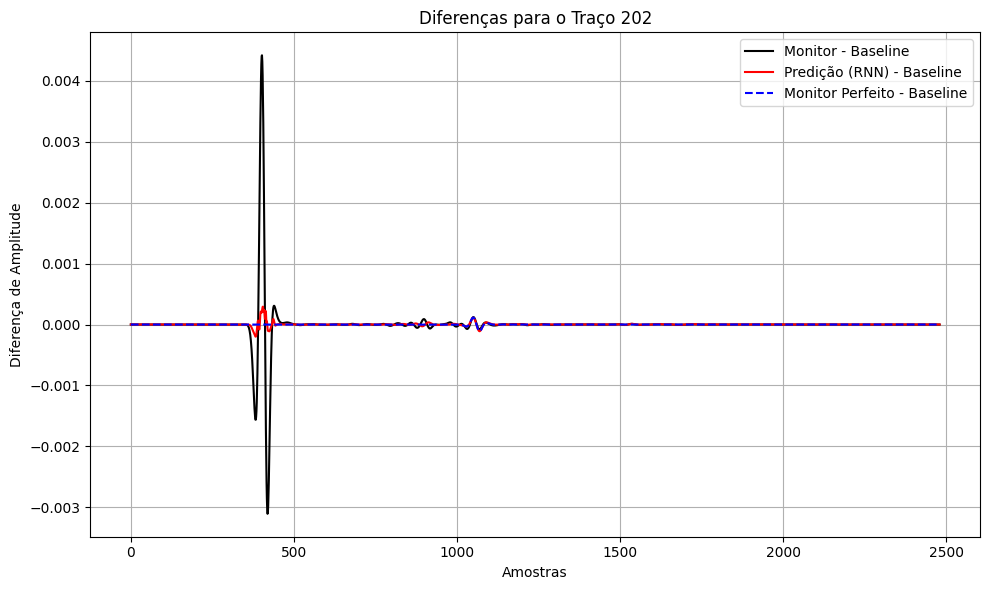

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 203:
           full   arrival  deep  reserv
baseline:  0.46       0.0  9.92    10.35
monitor:  15.19     15.2  9.44    8.94
matched:   1.64      1.64  4.02    3.58


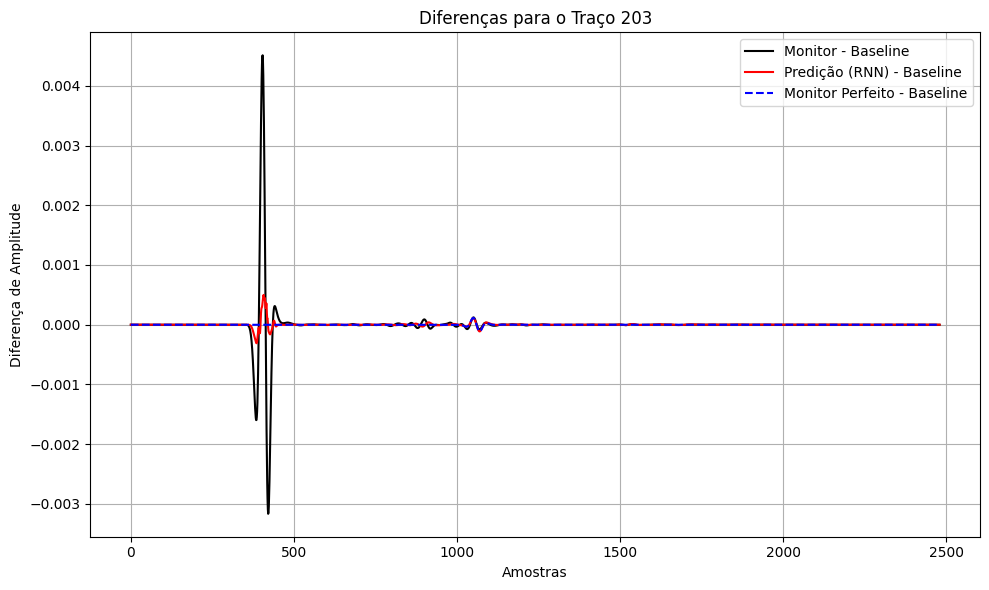

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 204:
           full   arrival  deep  reserv
baseline:  0.47       0.0  10.07    10.51
monitor:  15.57     15.58  9.5    9.06
matched:   1.9      1.89  3.92    3.49


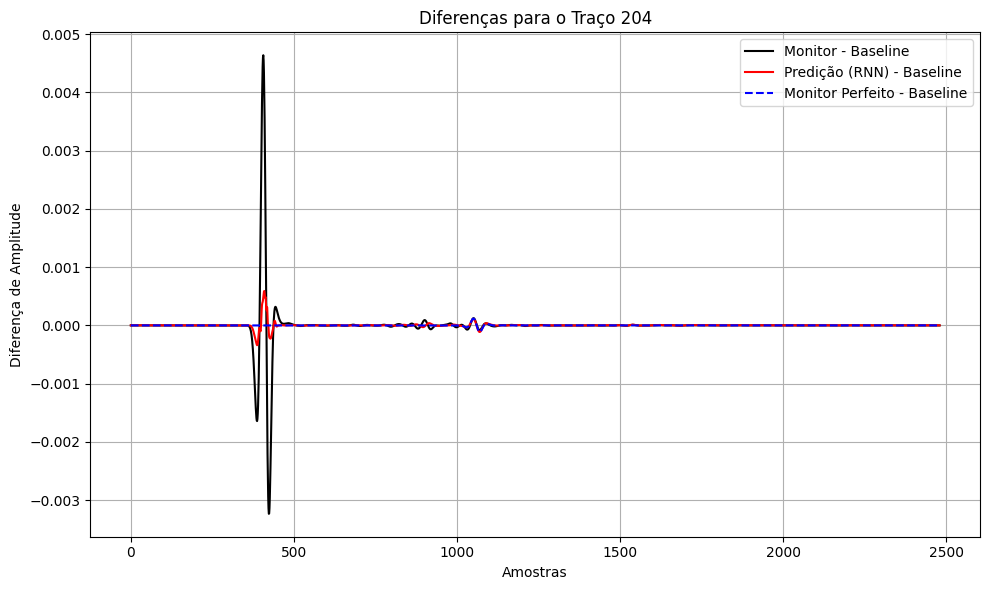

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 205:
           full   arrival  deep  reserv
baseline:  0.47       0.0  10.2    10.66
monitor:  15.96     15.98  9.57    9.19
matched:   2.59      2.59  4.36    3.97


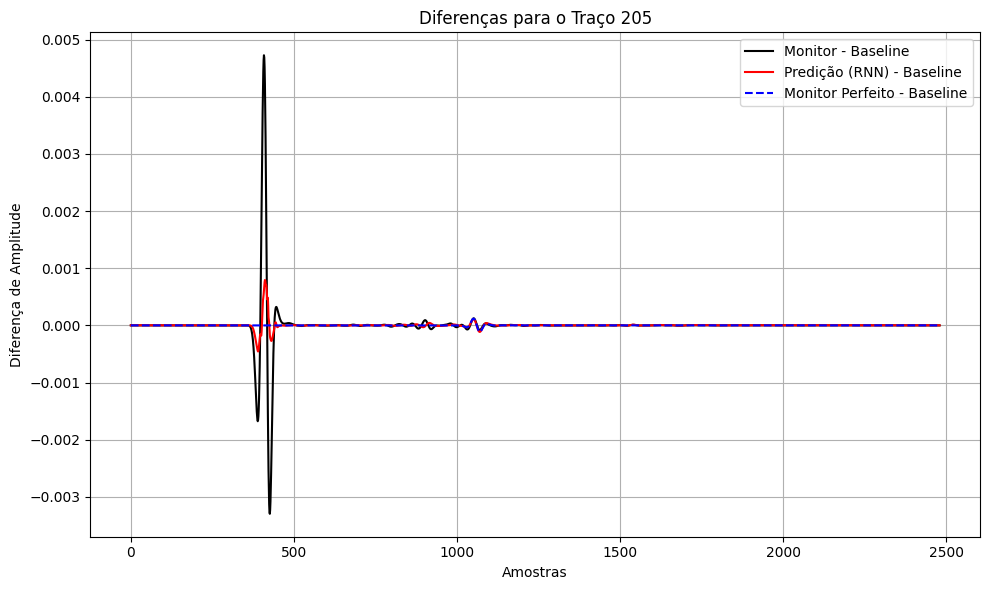

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Traço 206:
           full   arrival  deep  reserv
baseline:  0.48       0.0  10.32    10.8
monitor:  16.35     16.36  9.64    9.32
matched:   2.89      2.89  4.32    3.94


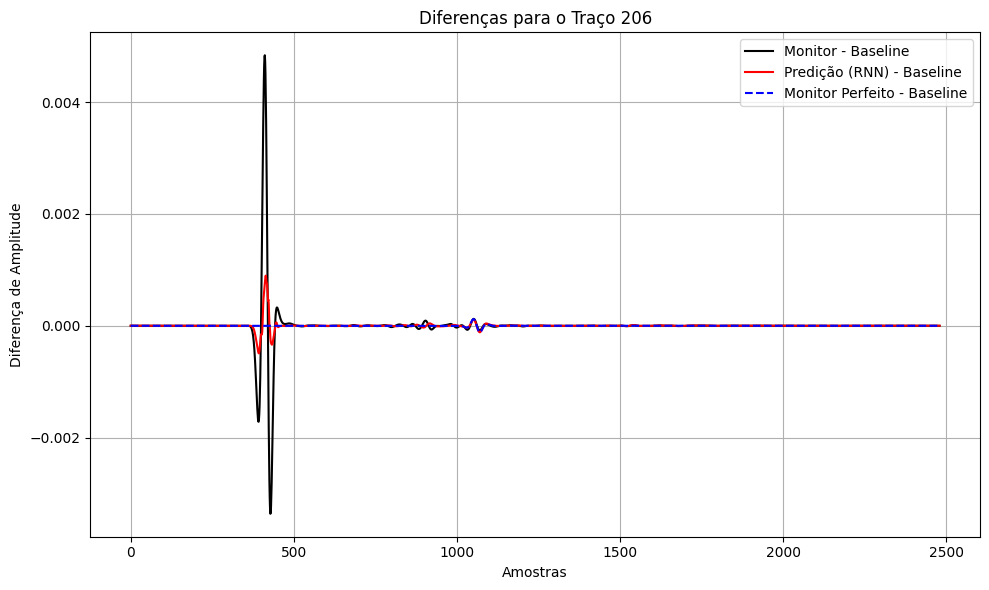

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 207:
           full   arrival  deep  reserv
baseline:  0.48       0.0  10.43    10.93
monitor:  16.74     16.75  9.71    9.44
matched:   3.61      3.61  4.82    4.48


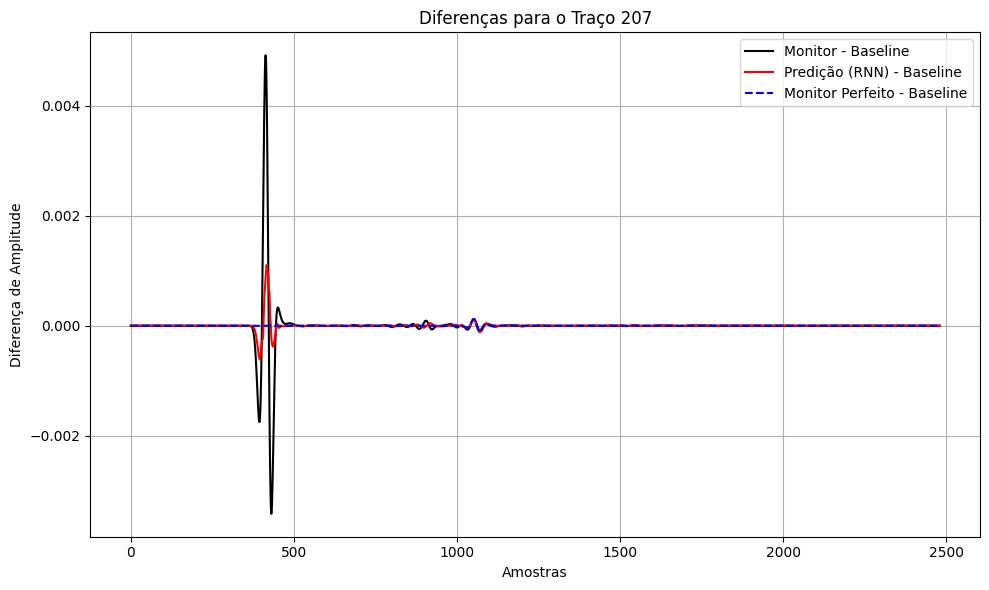

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 208:
           full   arrival  deep  reserv
baseline:  0.49       0.0  10.53    11.04
monitor:  17.11     17.13  9.79    9.54
matched:   3.94      3.94  4.83    4.51


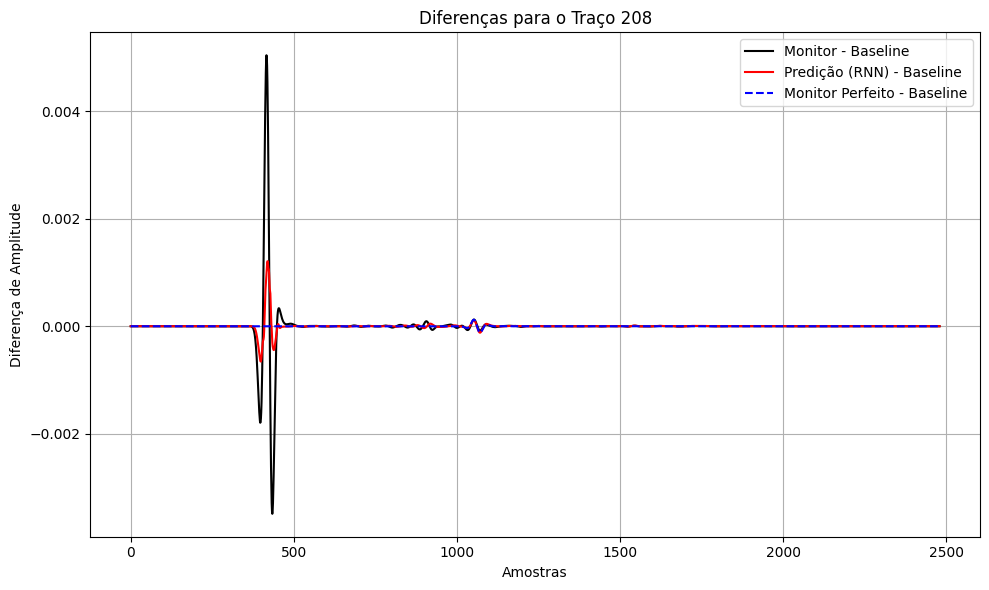

In [ ]:
# Inferência dos 17 traços com o treino no traço 200
traces_to_process_three = [192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208]
test_all_three_traces(traces_to_process_three, model, history, scaler)

### bs = 400 , ep = 700

In [ ]:
bs = 400
ep = 700

moni_win, base_amp, model, history, scaler = train_one(traces_to_process, ep, bs)

##### INFERÊNCIA DO TRAÇO

78/78 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.21      0.13  3.65    3.22


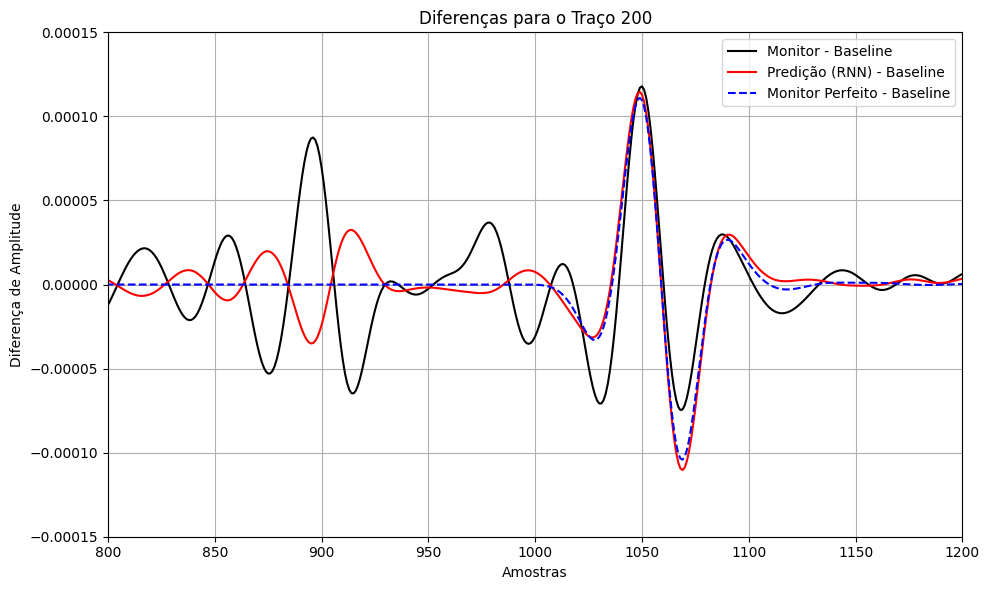

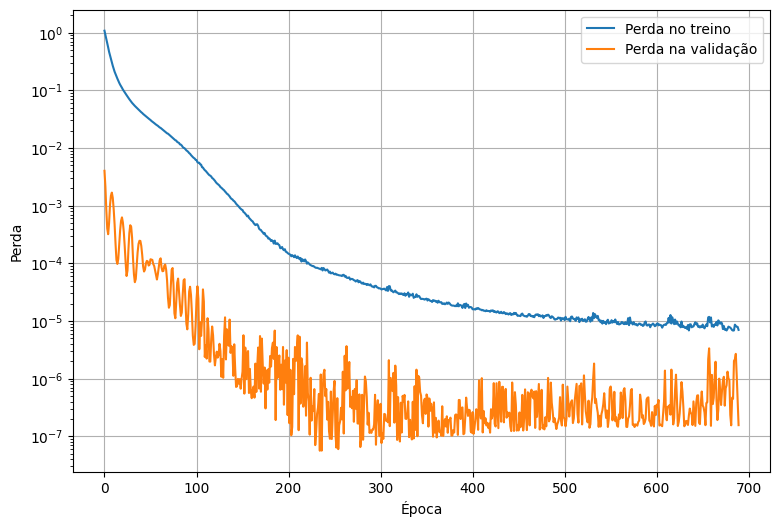

In [ ]:
test_one(traces_to_process, model, history, scaler)

##### INFERÊNCIA DO TRAÇO INTEIRO

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.48      0.46  3.5    2.99


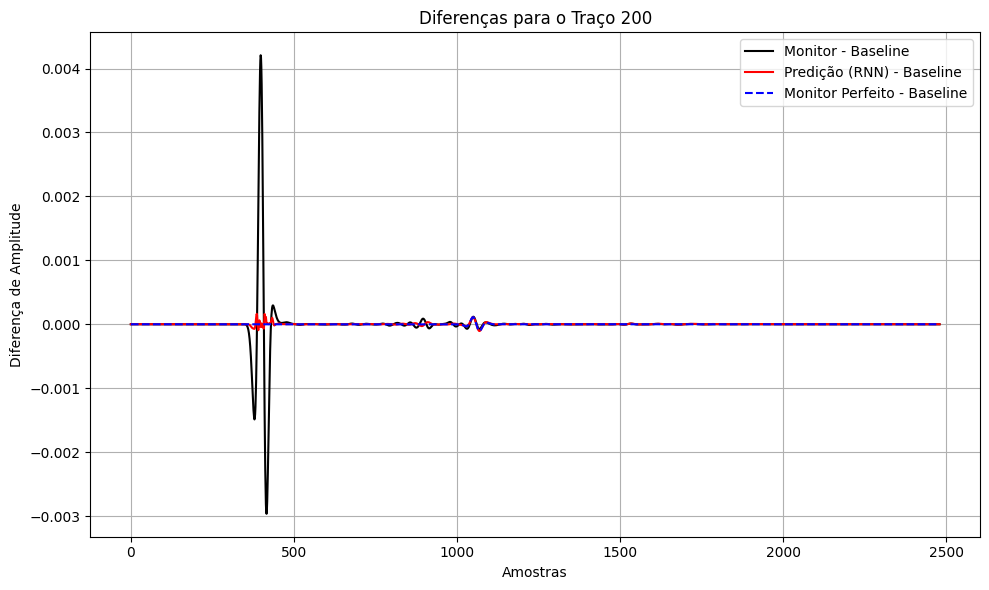

In [ ]:
test_all_all_trace(traces_to_process, model, history, scaler)

##### INFERÊNCIA DOS 17 TRAÇOS INTEIROS

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 192:
           full   arrival  deep  reserv
baseline:  0.36       0.0  7.92    8.67
monitor:  11.04     11.04  8.83    8.58
matched:   3.13      3.13  3.96    3.62


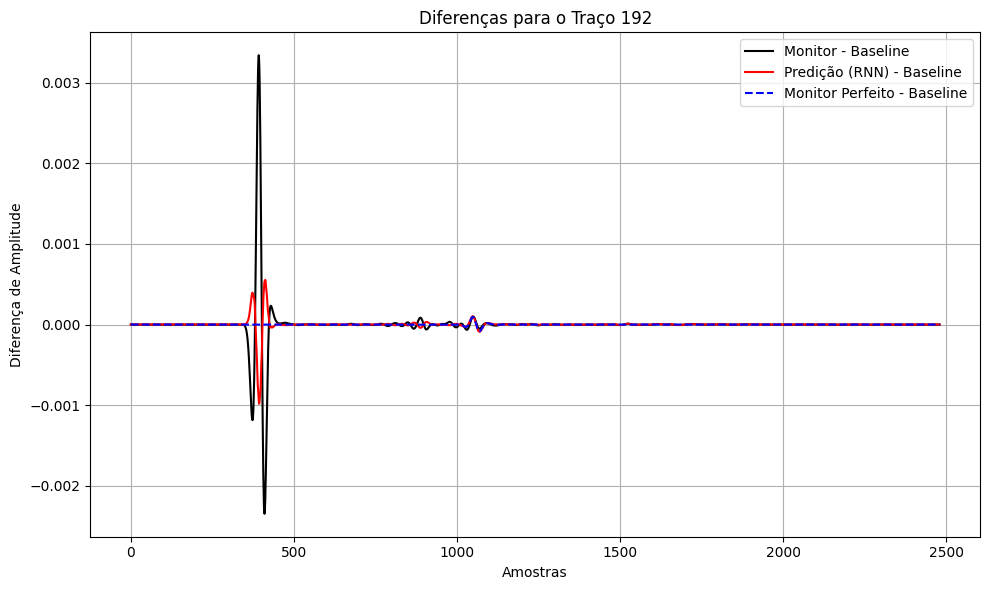

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 193:
           full   arrival  deep  reserv
baseline:  0.37       0.0  8.14    8.87
monitor:  11.4     11.4  8.88    8.59
matched:   2.68      2.68  3.91    3.58


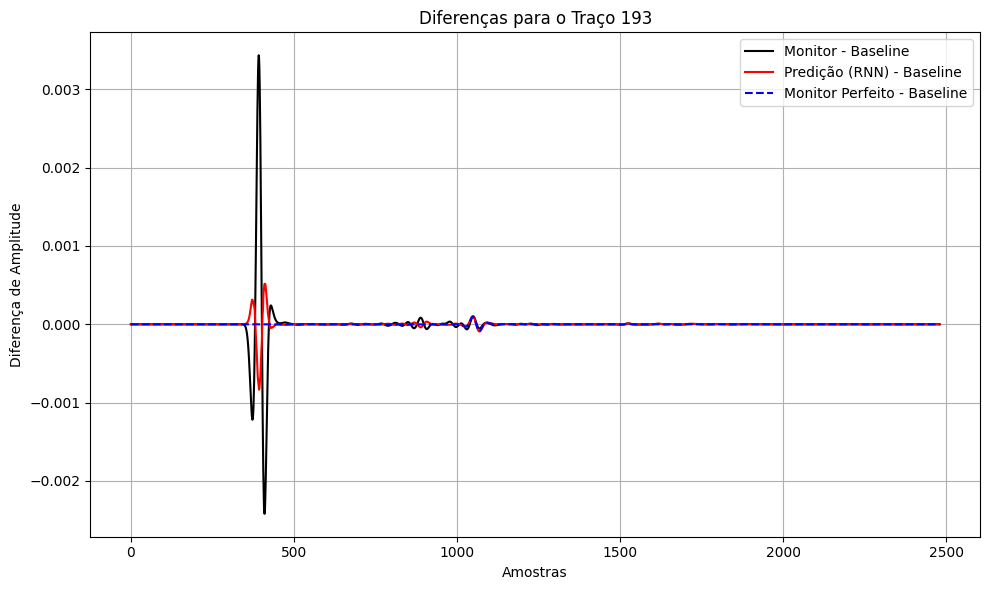

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 194:
           full   arrival  deep  reserv
baseline:  0.38       0.0  8.36    9.05
monitor:  11.76     11.77  8.93    8.59
matched:   2.43      2.42  3.89    3.51


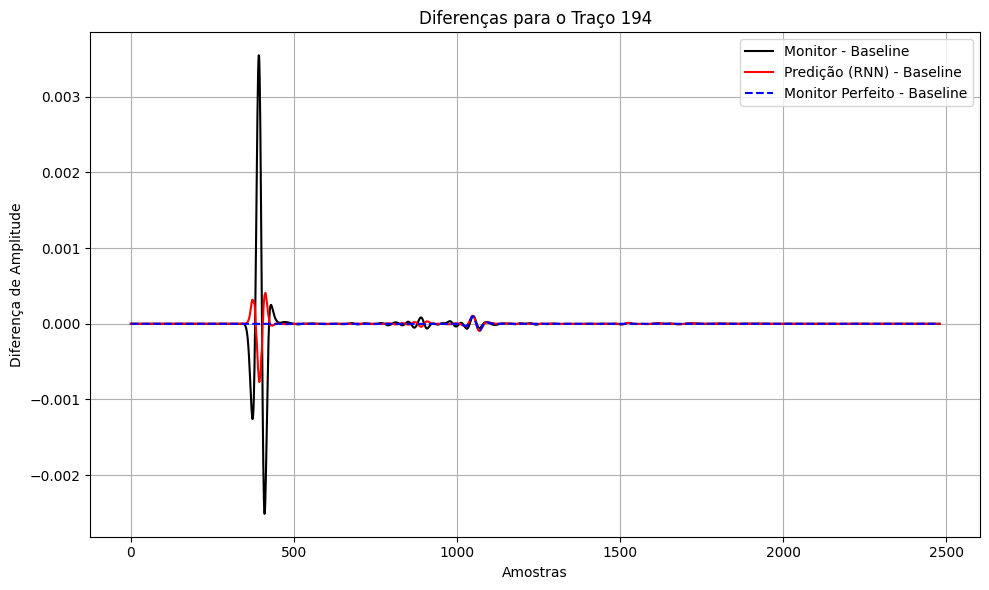

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 195:
           full   arrival  deep  reserv
baseline:  0.39       0.0  8.56    9.21
monitor:  12.13     12.13  8.99    8.57
matched:   1.95      1.94  3.85    3.48


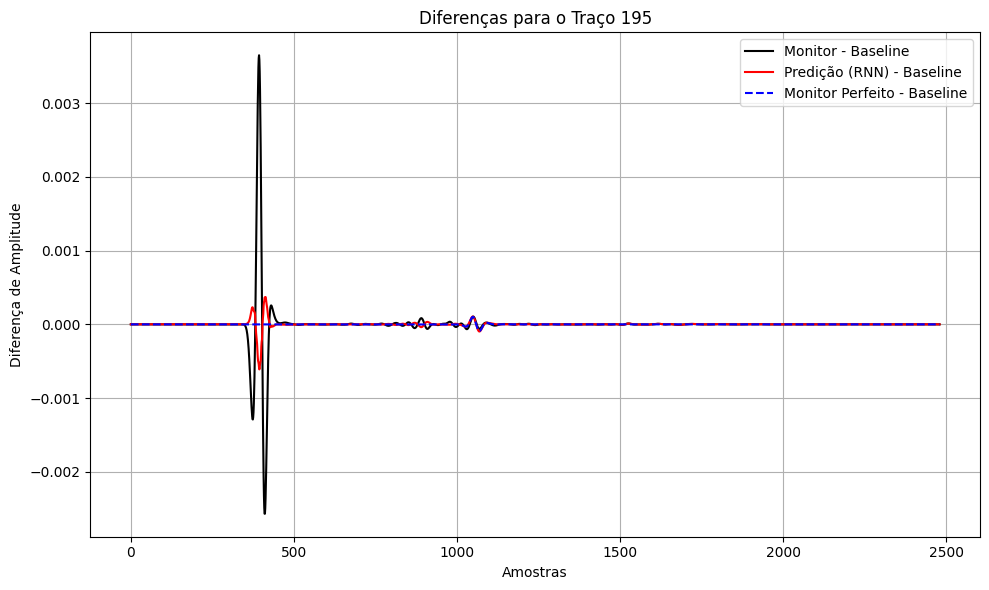

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 196:
           full   arrival  deep  reserv
baseline:  0.4       0.0  8.75    9.35
monitor:  12.5     12.51  9.04    8.55
matched:   1.68      1.67  3.82    3.4


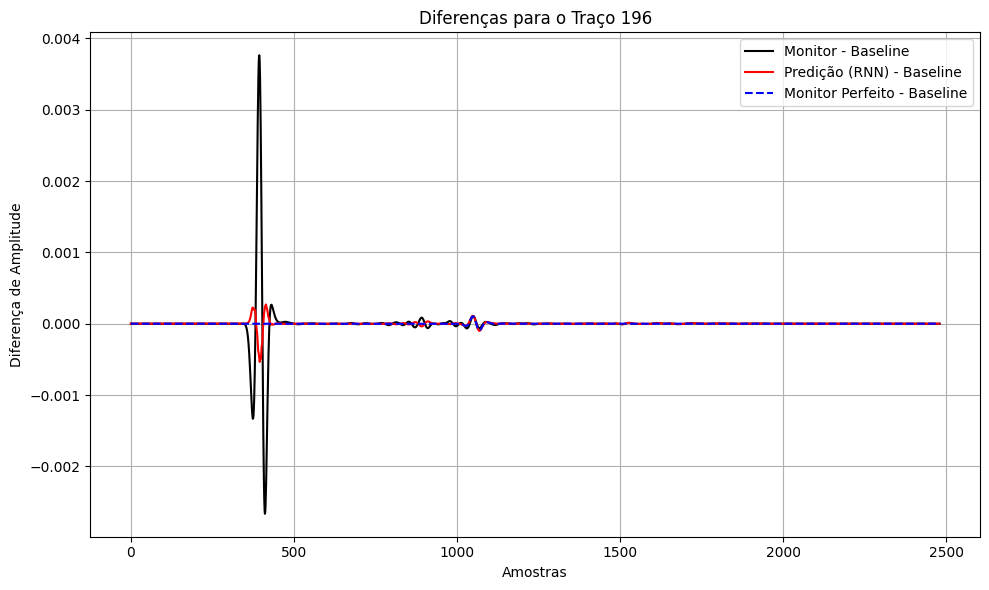

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 197:
           full   arrival  deep  reserv
baseline:  0.41       0.0  8.93    9.48
monitor:  12.88     12.89  9.1    8.55
matched:   1.18      1.16  3.79    3.38


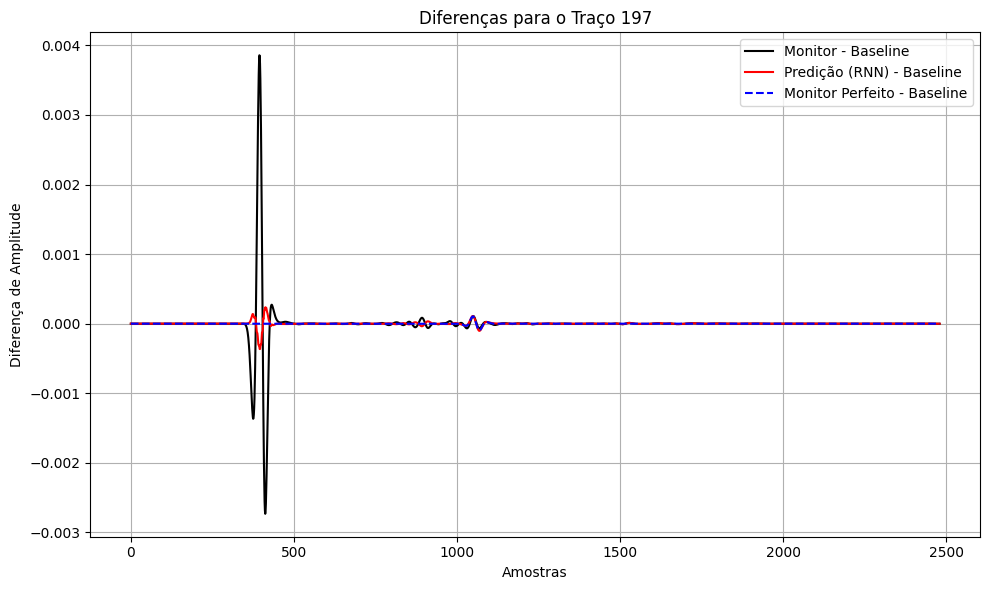

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 198:
           full   arrival  deep  reserv
baseline:  0.42       0.0  9.1    9.61
monitor:  13.26     13.26  9.15    8.57
matched:   0.88      0.87  3.73    3.29


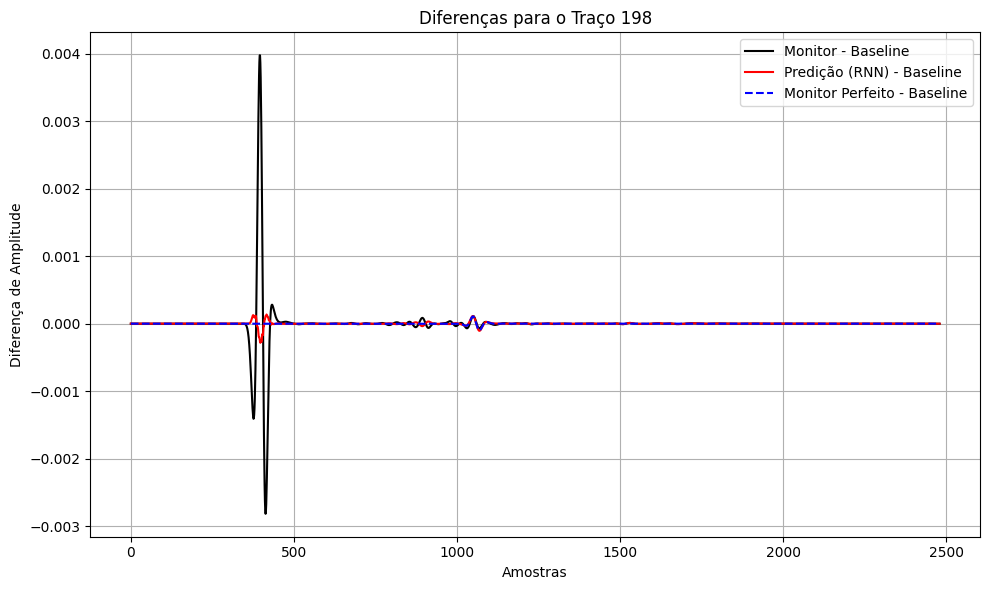

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Traço 199:
           full   arrival  deep  reserv
baseline:  0.43       0.0  9.27    9.74
monitor:  13.64     13.65  9.21    8.61
matched:   0.47      0.44  3.73    3.31


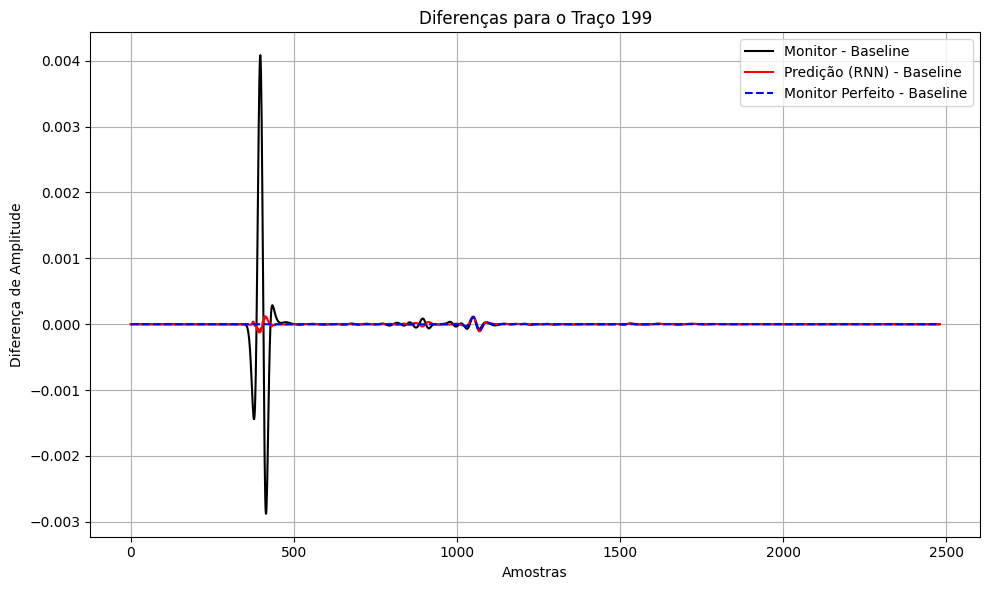

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.21      0.13  3.65    3.22


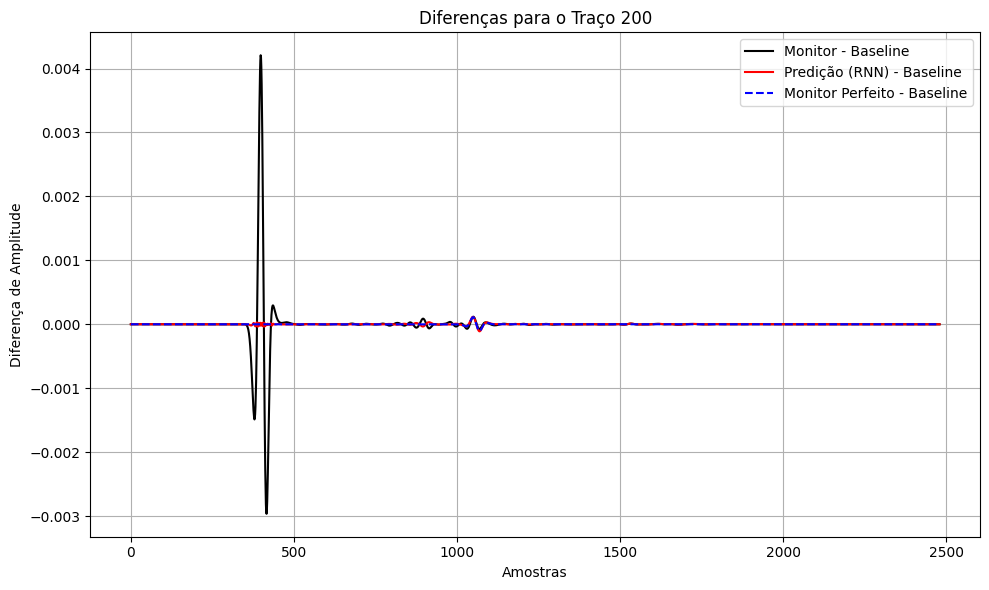

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 201:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.61    10.03
monitor:  14.41     14.42  9.33    8.74
matched:   0.74      0.72  3.7    3.3


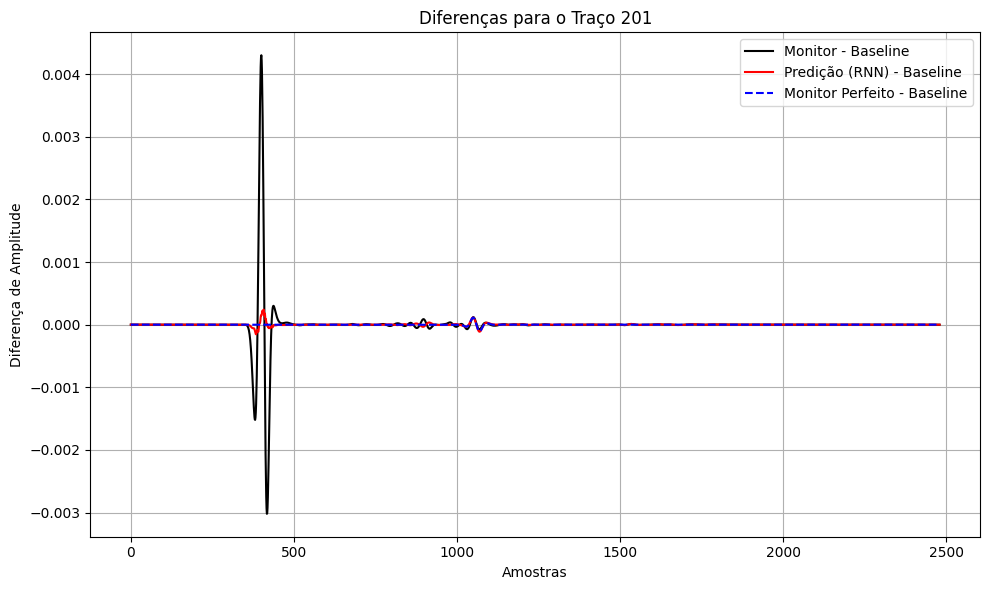

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 202:
           full   arrival  deep  reserv
baseline:  0.45       0.0  9.77    10.19
monitor:  14.8     14.81  9.39    8.83
matched:   0.94      0.93  3.6    3.2


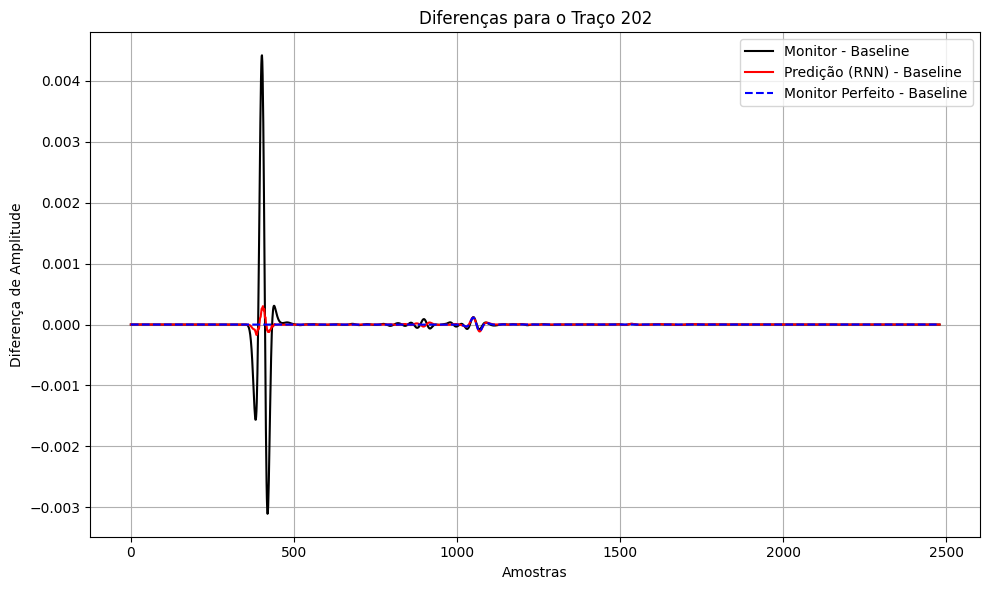

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 203:
           full   arrival  deep  reserv
baseline:  0.46       0.0  9.92    10.35
monitor:  15.19     15.2  9.44    8.94
matched:   1.62      1.62  3.73    3.37


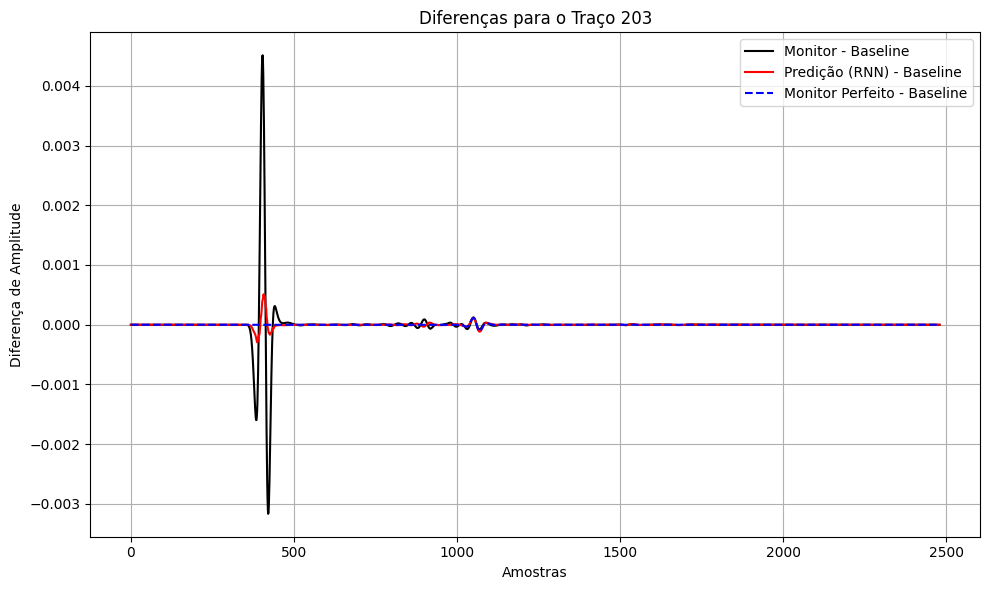

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 204:
           full   arrival  deep  reserv
baseline:  0.47       0.0  10.07    10.51
monitor:  15.57     15.58  9.5    9.06
matched:   1.9      1.89  3.64    3.3


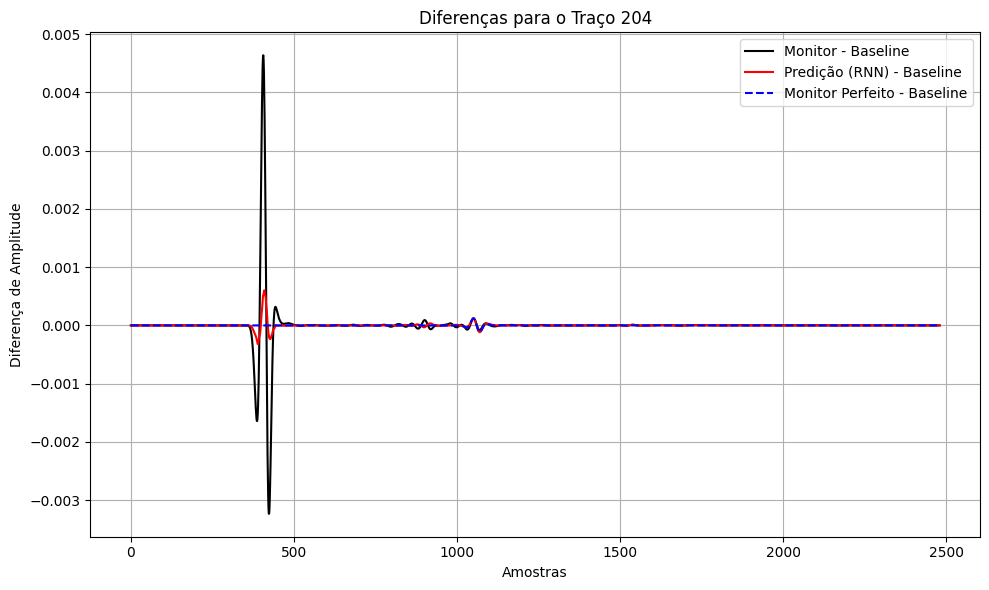

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 205:
           full   arrival  deep  reserv
baseline:  0.47       0.0  10.2    10.66
monitor:  15.96     15.98  9.57    9.19
matched:   2.6      2.6  3.86    3.56


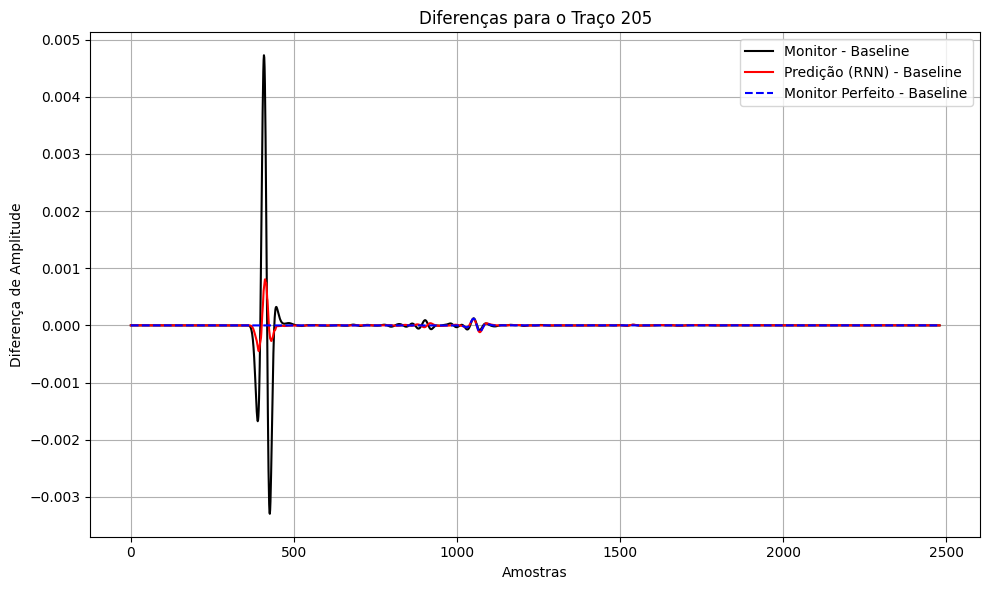

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 206:
           full   arrival  deep  reserv
baseline:  0.48       0.0  10.32    10.8
monitor:  16.35     16.36  9.64    9.32
matched:   2.91      2.91  3.8    3.52


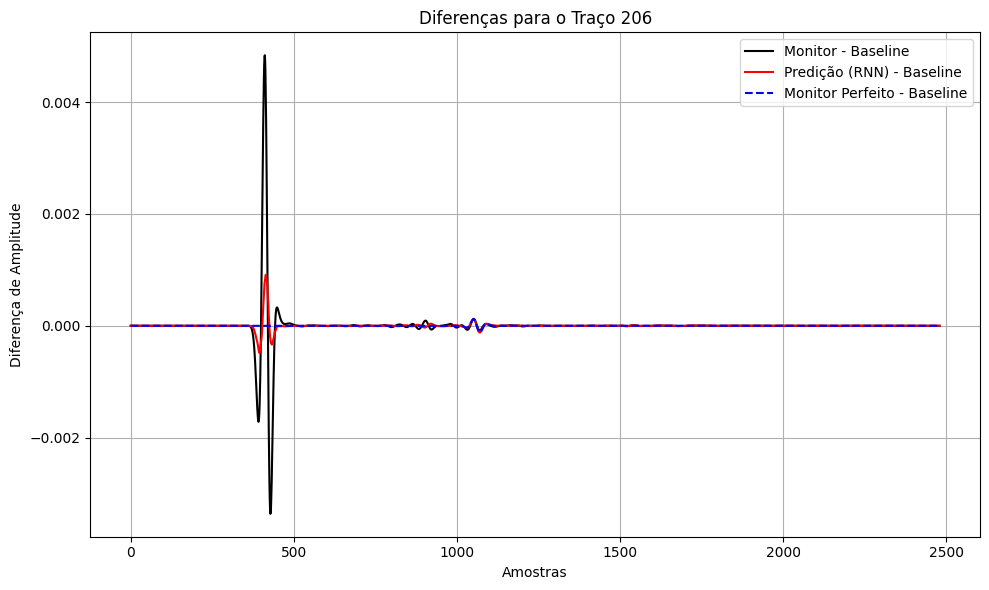

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 207:
           full   arrival  deep  reserv
baseline:  0.48       0.0  10.43    10.93
monitor:  16.74     16.75  9.71    9.44
matched:   3.63      3.63  4.13    3.88


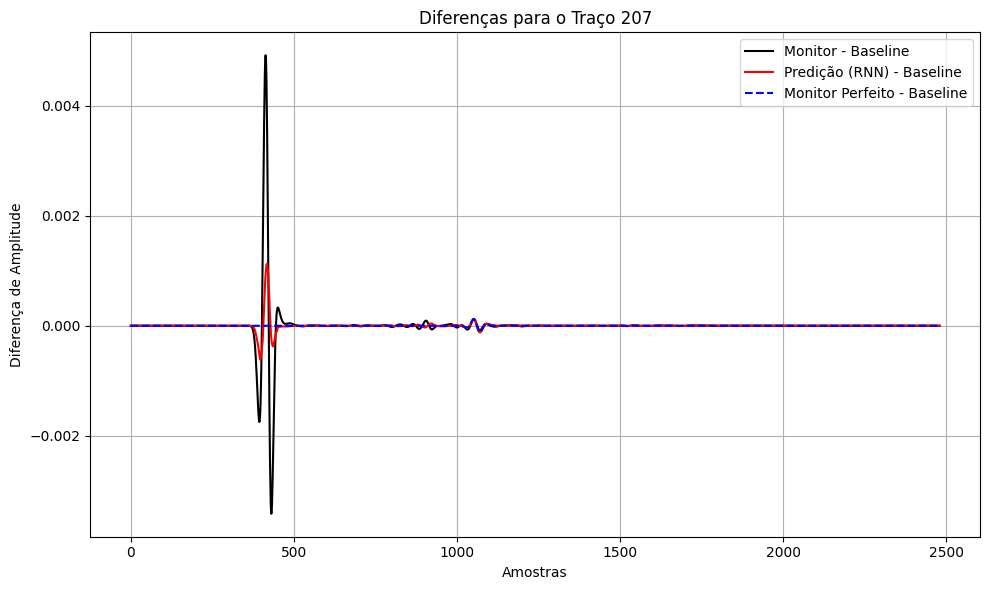

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 208:
           full   arrival  deep  reserv
baseline:  0.49       0.0  10.53    11.04
monitor:  17.11     17.13  9.79    9.54
matched:   3.97      3.97  4.11    3.88


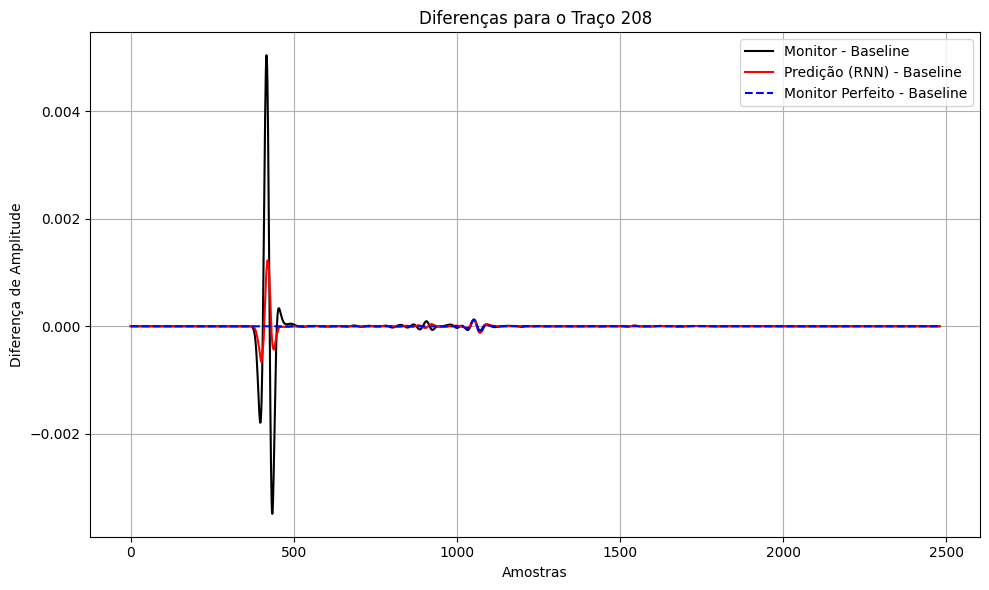

In [ ]:
# Inferência dos 17 traços com o treino no traço 200
traces_to_process_three = [192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208]
test_all_three_traces(traces_to_process_three, model, history, scaler)

# Um treino vários traços

#### bs = 1000, ep = 300

In [ ]:
traces_to_process = [197, 198, 199, 200, 201, 202, 203]

bs = 1000
ep = 300

moni_win_combined, base_amp_combined, model, history, scalers = one_train(traces_to_process, ep, bs)

trace_monitor (antes da norm) = (2500,)
trace_baseline (antes da norm) = (2500,)
trace_monitor (depois da norm) = (2500, 1)
trace_baseline (depois da norm) = (2500, 1)
trace_monitor (antes da norm) = (2500,)
trace_baseline (antes da norm) = (2500,)
trace_monitor (depois da norm) = (2500, 1)
trace_baseline (depois da norm) = (2500, 1)
trace_monitor (antes da norm) = (2500,)
trace_baseline (antes da norm) = (2500,)
trace_monitor (depois da norm) = (2500, 1)
trace_baseline (depois da norm) = (2500, 1)
trace_monitor (antes da norm) = (2500,)
trace_baseline (antes da norm) = (2500,)
trace_monitor (depois da norm) = (2500, 1)
trace_baseline (depois da norm) = (2500, 1)
trace_monitor (antes da norm) = (2500,)
trace_baseline (antes da norm) = (2500,)
trace_monitor (depois da norm) = (2500, 1)
trace_baseline (depois da norm) = (2500, 1)
trace_monitor (antes da norm) = (2500,)
trace_baseline (antes da norm) = (2500,)
trace_monitor (depois da norm) = (2500, 1)
trace_baseline (depois da norm) = (2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gru_13 (GRU)                         │ (None, 50)                  │           7,950 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,001 (31.25 KB)

 Trainable params: 8,001 (31.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/300
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 207ms/step - loss: 3.0659 - mean_absolute_error: 0.4804 - mean_squared_error: 3.0659 - val_loss: 1.6031 - val_mean_absolute_error: 0.3091 - val_mean_squared_error: 1.6031
Epoch 2/300
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 2.2618 - mean_absolute_error: 0.4192 - mean_squared_error: 2.2618 - val_loss: 1.0899 - val_mean_absolute_error: 0.2327 - val_mean_squared_error: 1.0899
Epoch 3/300
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 1.4374 - mean_absolute_error: 0.3023 - mean_squared_error: 1.4374 - val_loss: 0.7266 - val_mean_absolute_error: 0.1831 - val_mean_squared_error: 0.7266
Epoch 4/300
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.9467 - mean_absolute_error: 0.2508 - mean_squared_error: 0.9467 - val_loss: 0.4975 - val_mean_absolute_error: 0.1791 - val_mean_squared_error: 0.4975
Epoch 5/300
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.7233 - mean_absolute_error: 0.2479 - mean_squared_error: 0.7233 - val_loss: 0.3501 - val_mean_a

##### INFERÊNCIA DOS TRAÇOS

78/78 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
Traço 197:
           full   arrival  deep  reserv
baseline:  0.41       0.0  8.93    9.48
monitor:  12.88     12.89  9.1    8.55
matched:   0.94      0.88  6.5    4.6


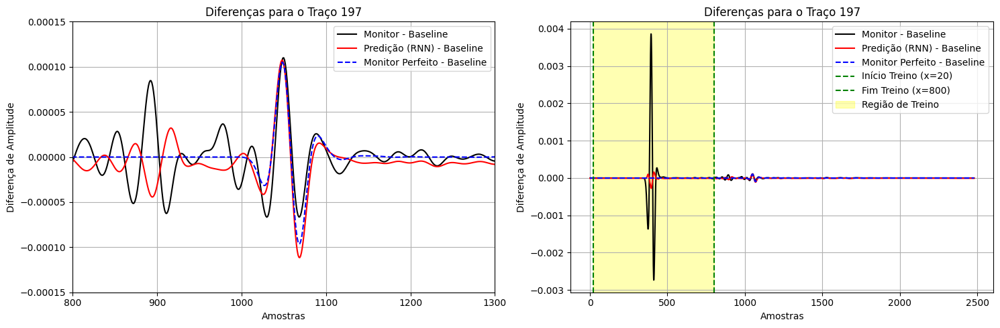

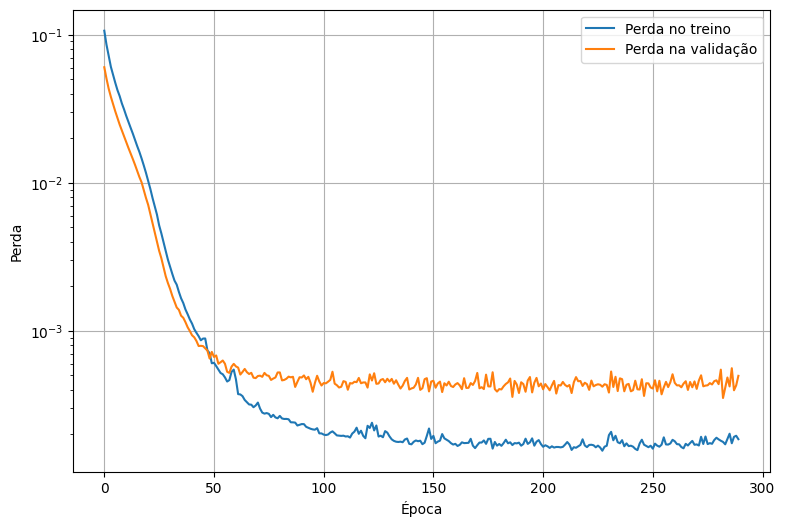

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 198:
           full   arrival  deep  reserv
baseline:  0.42       0.0  9.1    9.61
monitor:  13.26     13.26  9.15    8.57
matched:   0.61      0.52  6.47    4.55


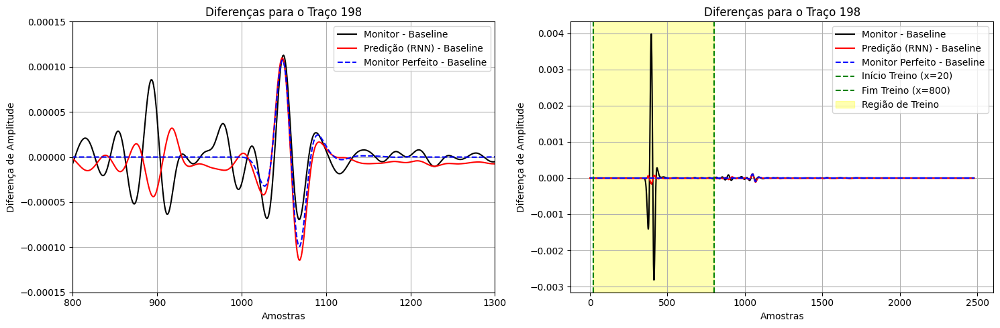

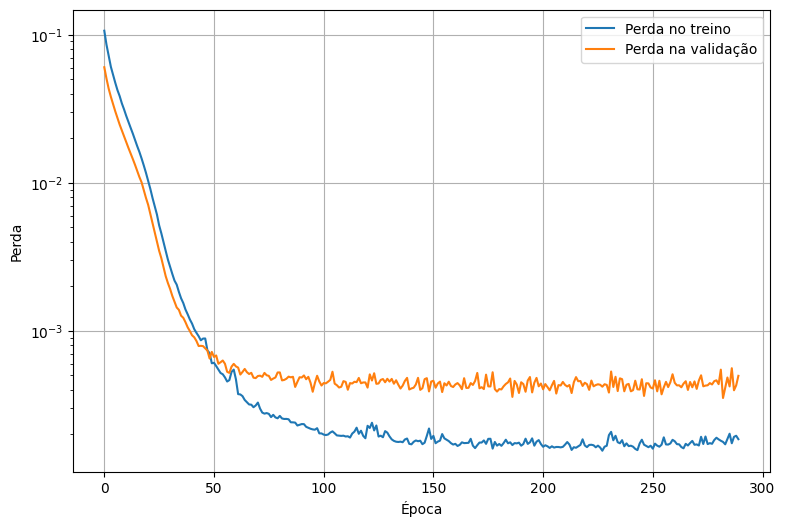

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 199:
           full   arrival  deep  reserv
baseline:  0.43       0.0  9.27    9.74
monitor:  13.64     13.65  9.21    8.61
matched:   0.39      0.22  6.44    4.5


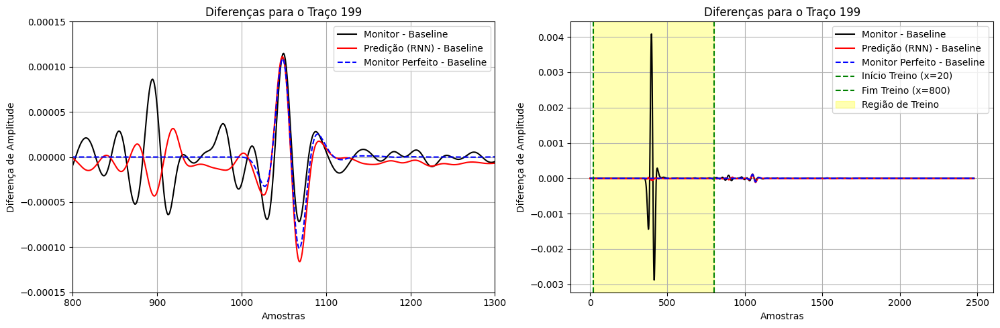

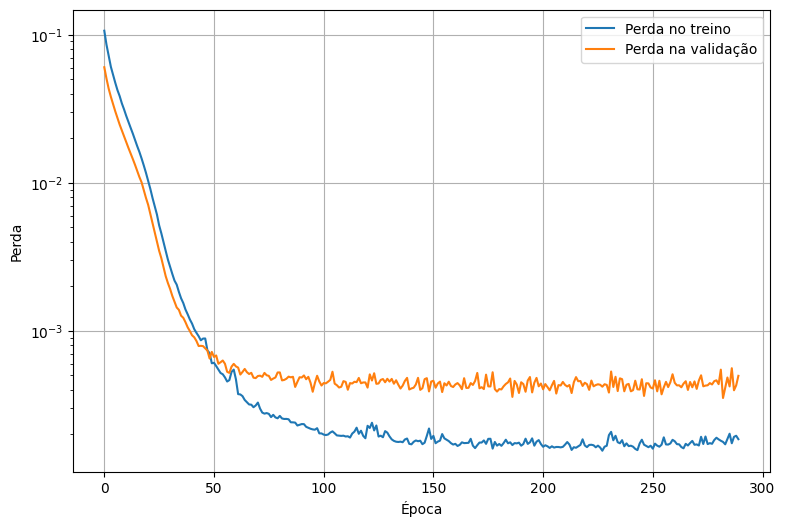

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.47      0.35  6.41    4.45


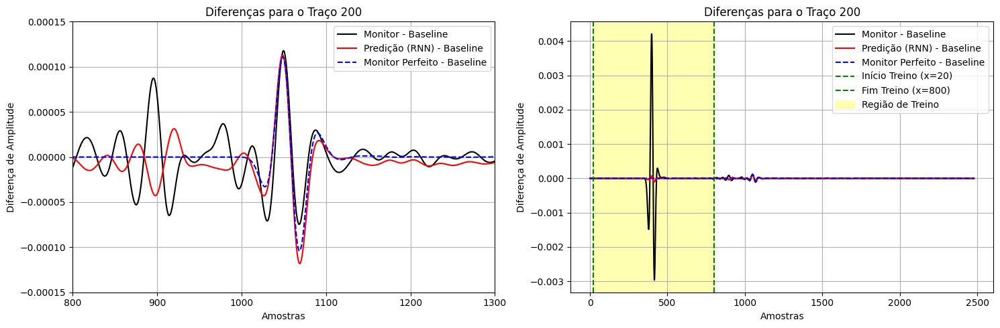

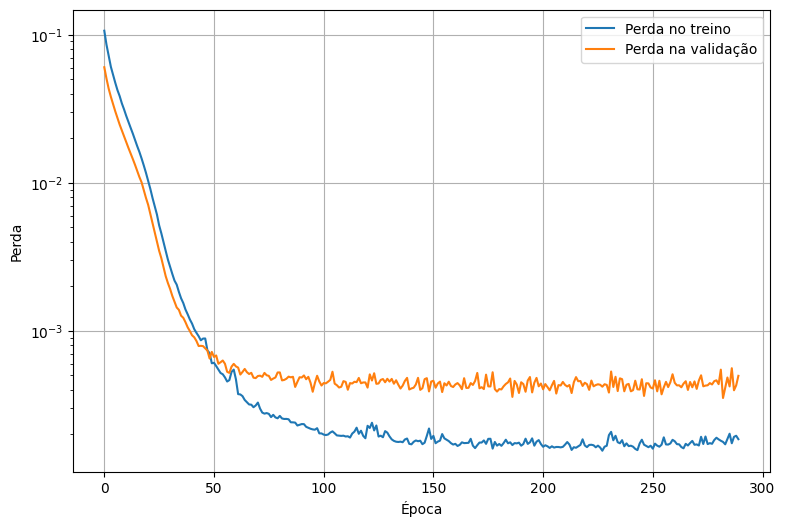

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 201:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.61    10.03
monitor:  14.41     14.42  9.33    8.74
matched:   0.77      0.7  6.38    4.41


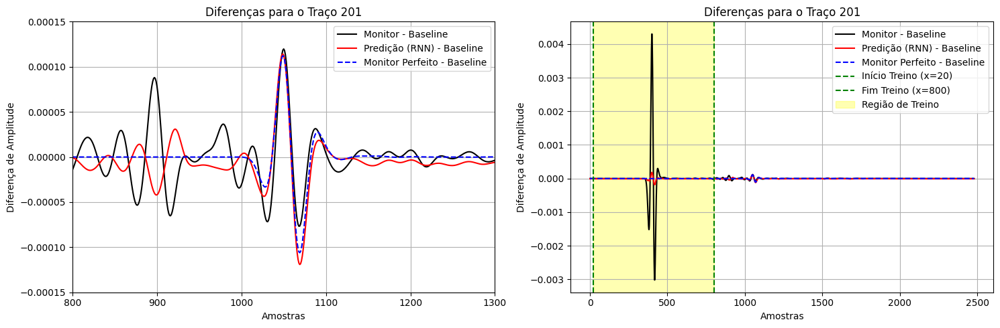

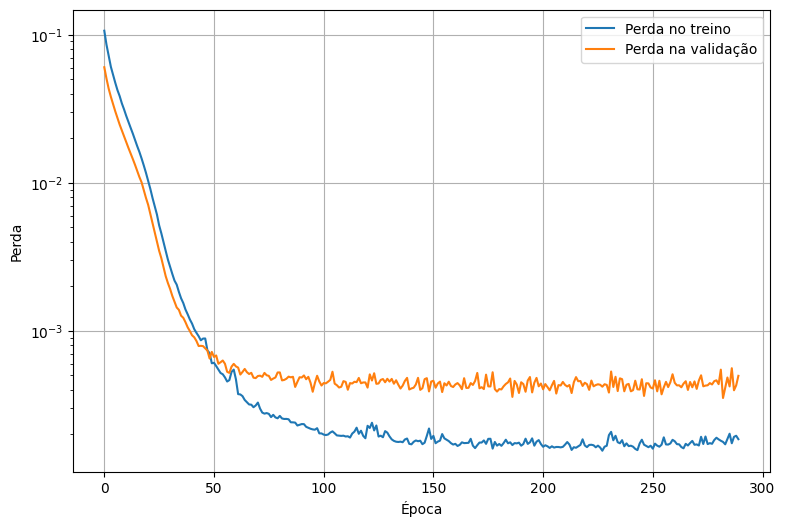

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 202:
           full   arrival  deep  reserv
baseline:  0.45       0.0  9.77    10.19
monitor:  14.8     14.81  9.39    8.83
matched:   1.13      1.08  6.35    4.38


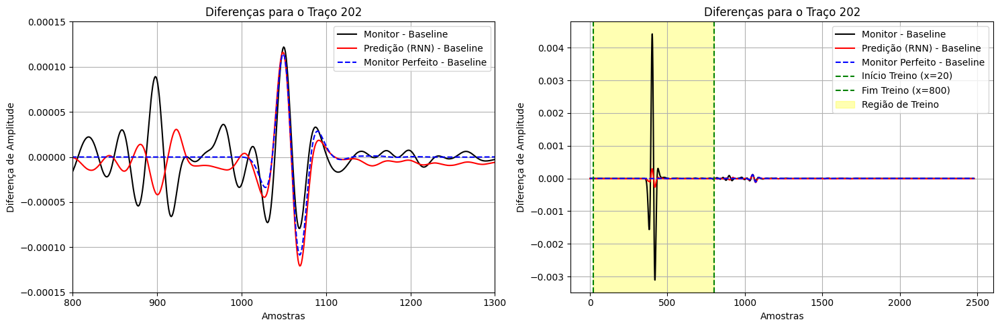

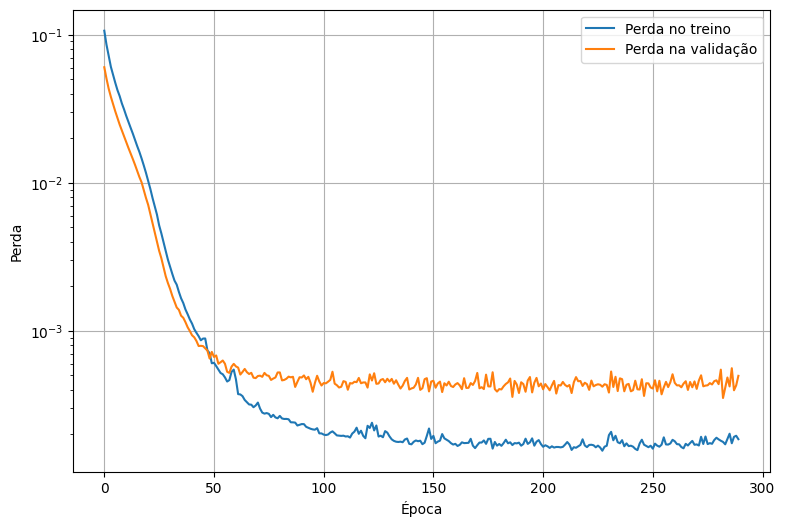

78/78 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Traço 203:
           full   arrival  deep  reserv
baseline:  0.46       0.0  9.92    10.35
monitor:  15.19     15.2  9.44    8.94
matched:   1.5      1.47  6.33    4.35


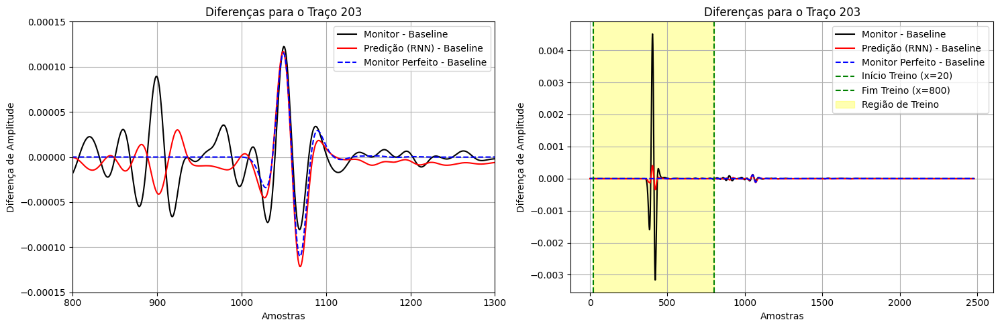

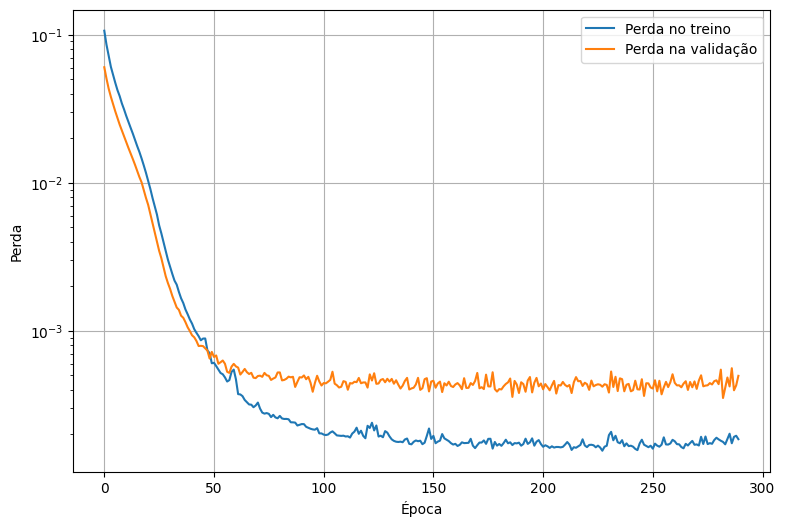

In [ ]:
test_all(traces_to_process, model, history, scalers)

In [ ]:
traces_to_process = [197, 198, 199, 200, 201, 202, 203]

bs = 1100
ep = 300

moni_win_combined, base_amp_combined, model, history, scalers = one_train(traces_to_process, ep, bs)

trace_monitor (antes da norm) = (2500,)
trace_baseline (antes da norm) = (2500,)
trace_monitor (depois da norm) = (2500, 1)
trace_baseline (depois da norm) = (2500, 1)
trace_monitor (antes da norm) = (2500,)
trace_baseline (antes da norm) = (2500,)
trace_monitor (depois da norm) = (2500, 1)
trace_baseline (depois da norm) = (2500, 1)
trace_monitor (antes da norm) = (2500,)
trace_baseline (antes da norm) = (2500,)
trace_monitor (depois da norm) = (2500, 1)
trace_baseline (depois da norm) = (2500, 1)
trace_monitor (antes da norm) = (2500,)
trace_baseline (antes da norm) = (2500,)
trace_monitor (depois da norm) = (2500, 1)
trace_baseline (depois da norm) = (2500, 1)
trace_monitor (antes da norm) = (2500,)
trace_baseline (antes da norm) = (2500,)
trace_monitor (depois da norm) = (2500, 1)
trace_baseline (depois da norm) = (2500, 1)
trace_monitor (antes da norm) = (2500,)
trace_baseline (antes da norm) = (2500,)
trace_monitor (depois da norm) = (2500, 1)
trace_baseline (depois da norm) = (2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gru_14 (GRU)                         │ (None, 50)                  │           7,950 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,001 (31.25 KB)

 Trainable params: 8,001 (31.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/300
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 260ms/step - loss: 1.8088 - mean_absolute_error: 0.3358 - mean_squared_error: 1.8088 - val_loss: 0.9152 - val_mean_absolute_error: 0.2033 - val_mean_squared_error: 0.9152
Epoch 2/300
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 1.2358 - mean_absolute_error: 0.2791 - mean_squared_error: 1.2358 - val_loss: 0.6461 - val_mean_absolute_error: 0.1688 - val_mean_squared_error: 0.6461
Epoch 3/300
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.8705 - mean_absolute_error: 0.2371 - mean_squared_error: 0.8705 - val_loss: 0.4784 - val_mean_absolute_error: 0.1830 - val_mean_squared_error: 0.4784
Epoch 4/300
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.7056 - mean_absolute_error: 0.2504 - mean_squared_error: 0.7056 - val_loss: 0.3640 - val_mean_absolute_error: 0.1545 - val_mean_squared_error: 0.3640
Epoch 5/300
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.5124 - mean_absolute_error: 0.2054 - mean_squared_error: 0.5124 - val_loss: 0.2783 - val_mean_a

##### INFERÊNCIA DOS TRAÇOS

78/78 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
Traço 197:
           full   arrival  deep  reserv
baseline:  0.41       0.0  8.93    9.48
monitor:  12.88     12.89  9.1    8.55
matched:   1.05      1.04  3.77    3.3


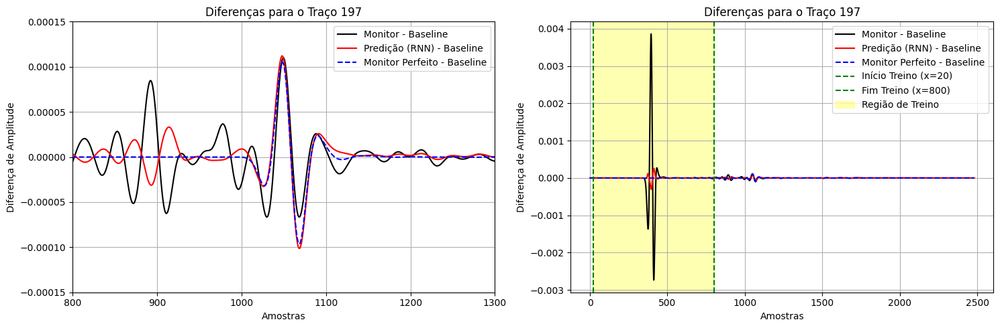

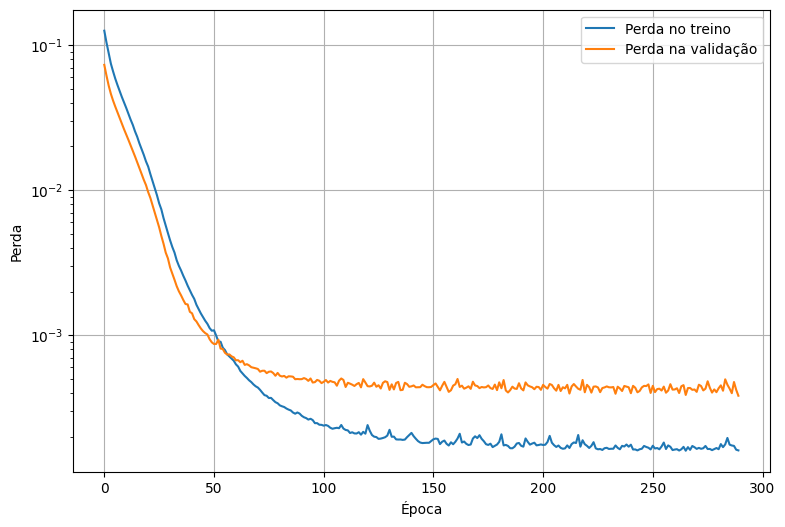

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 198:
           full   arrival  deep  reserv
baseline:  0.42       0.0  9.1    9.61
monitor:  13.26     13.26  9.15    8.57
matched:   0.69      0.67  3.73    3.25


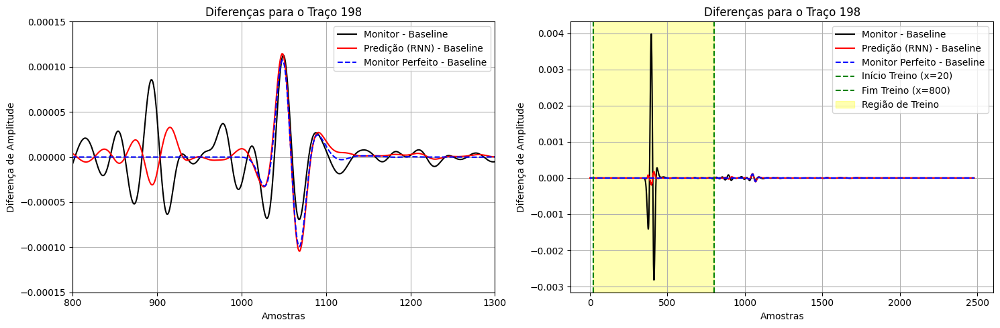

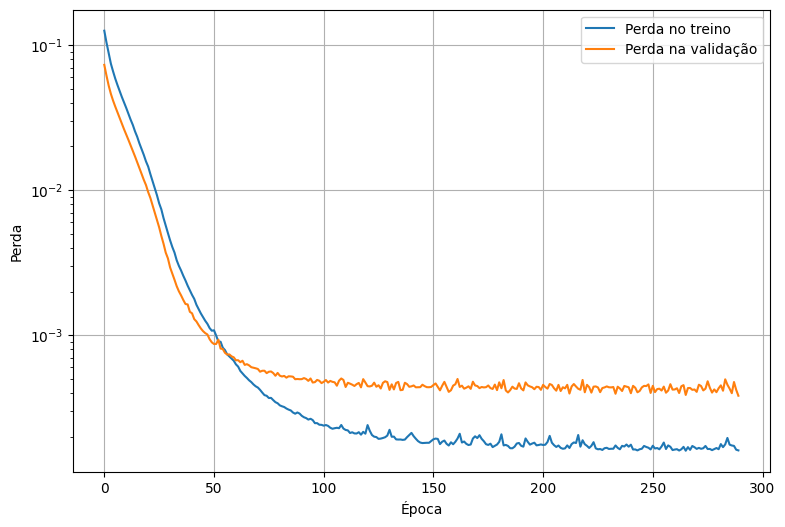

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 199:
           full   arrival  deep  reserv
baseline:  0.43       0.0  9.27    9.74
monitor:  13.64     13.65  9.21    8.61
matched:   0.36      0.31  3.68    3.2


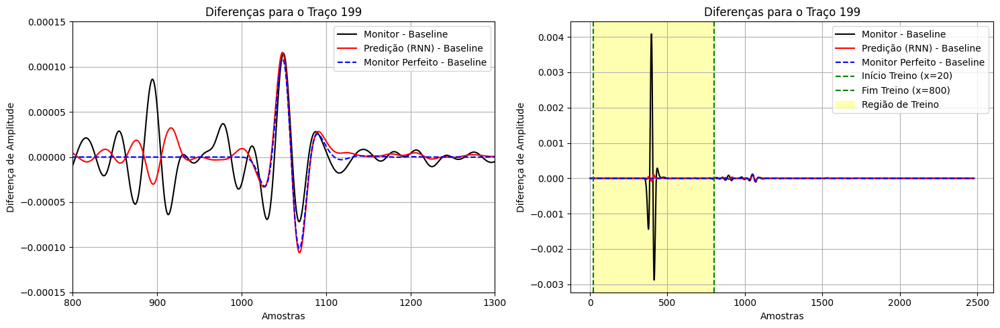

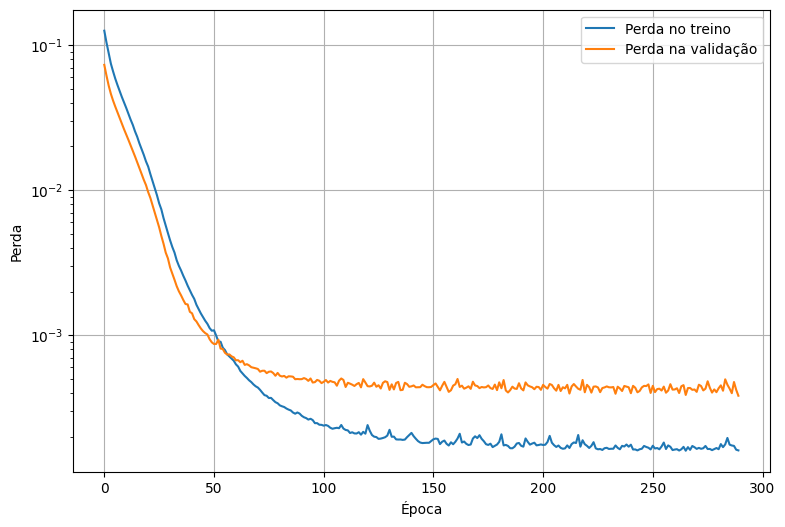

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 200:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.44    9.88
monitor:  14.02     14.03  9.27    8.66
matched:   0.27      0.21  3.64    3.16


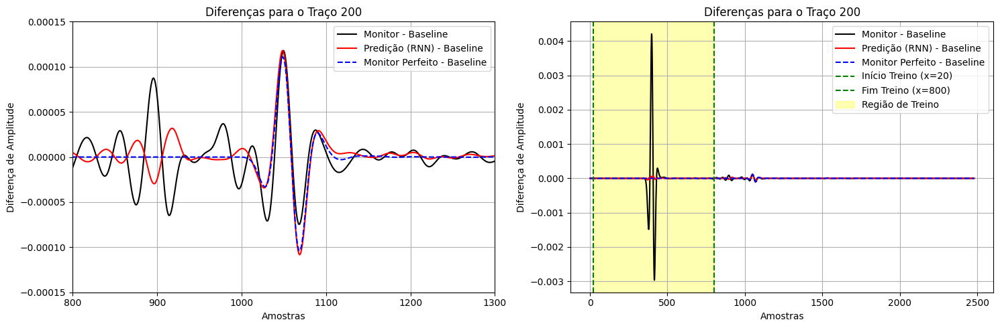

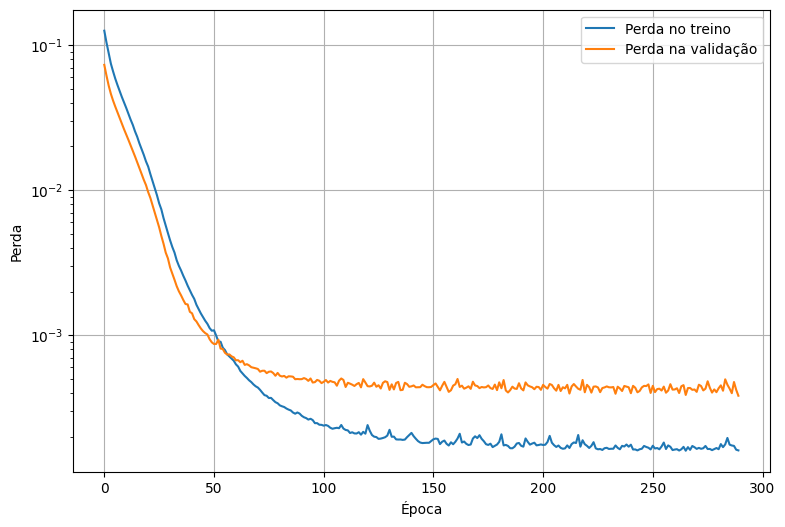

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Traço 201:
           full   arrival  deep  reserv
baseline:  0.44       0.0  9.61    10.03
monitor:  14.41     14.42  9.33    8.74
matched:   0.56      0.54  3.59    3.12


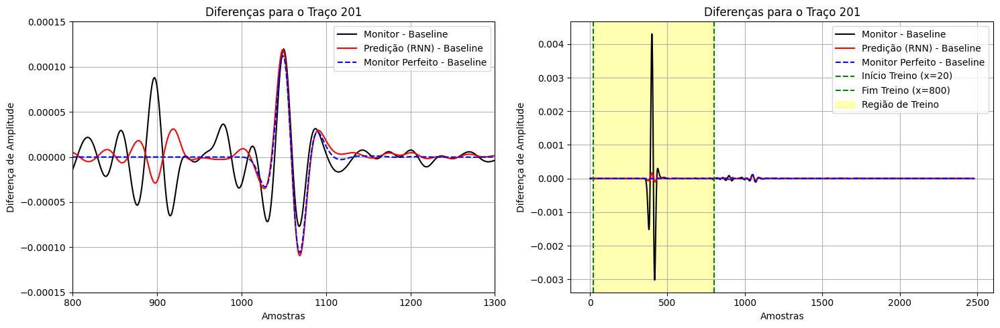

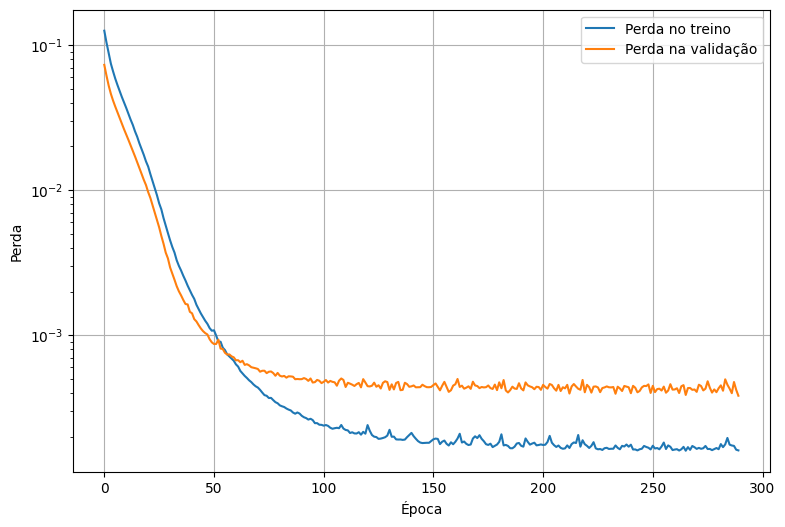

78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Traço 202:
           full   arrival  deep  reserv
baseline:  0.45       0.0  9.77    10.19
monitor:  14.8     14.81  9.39    8.83
matched:   0.92      0.91  3.53    3.09


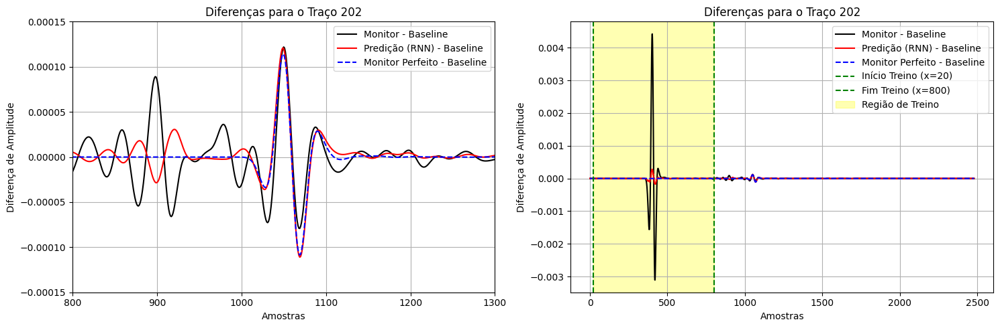

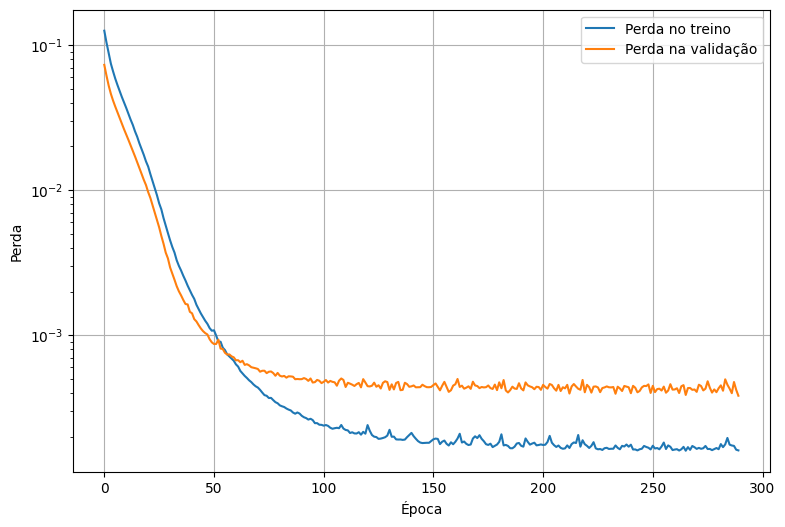

78/78 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Traço 203:
           full   arrival  deep  reserv
baseline:  0.46       0.0  9.92    10.35
monitor:  15.19     15.2  9.44    8.94
matched:   1.3      1.29  3.48    3.07


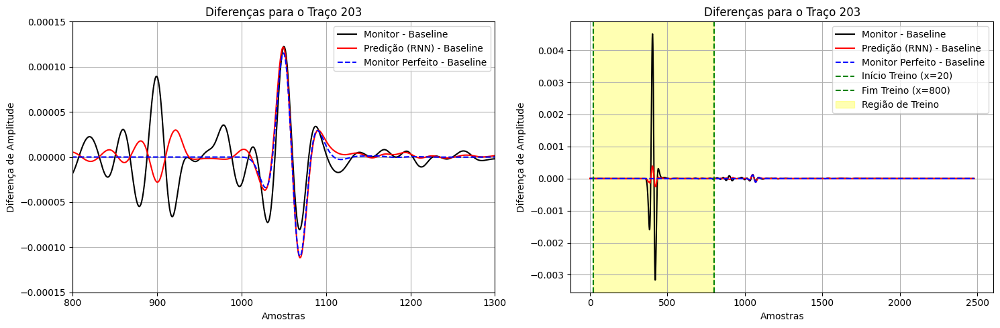

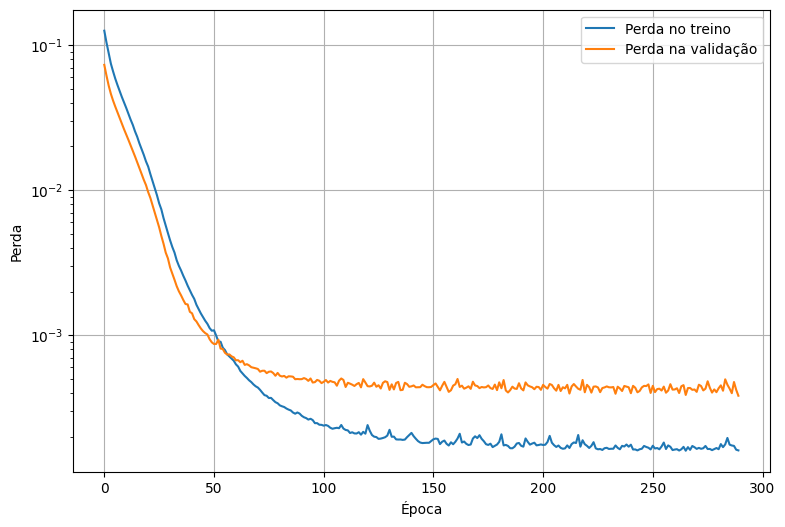

In [ ]:
test_all(traces_to_process, model, history, scalers)